>  # <font color=blue>  Telecom Churn - Group Case Study </font>

> ## Business Problem Overview
> In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

In [1]:
# import pandas, pd is an alias
import pandas as pd

# import numpy, np is an alias
import numpy as np

# import matplotlib.pyplot, plt is an alias
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns

#Modeling 
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from imblearn.metrics import sensitivity_specificity_support
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC


#!pip install fancyimpute
from fancyimpute import IterativeImputer

# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 


#ignore Warning
import warnings
warnings.filterwarnings('ignore')


/Users/raj/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.
/Users/raj/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/Users/raj/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corres

> # <font color=blue> 1. Data Sourcing </font>

> ## 1.1. Enter CSV Data File location

In [2]:
#Store File Location
Location = "./"

#Store Data File Name / csv File
FileName = "telecom_churn_data.csv"

LocationChurn = Location + FileName
print("File '{0}'' available in Location '{1}' will be used as DataSet".format(FileName,LocationChurn))


File 'telecom_churn_data.csv'' available in Location './telecom_churn_data.csv' will be used as DataSet


> ## 1.2. Read CSV DataSet

In [3]:
#Print dataframe properly
pd.set_option('display.max_columns', 500)
pd.set_option("display.max_rows", 300)

#Read DataSet in CSV File Format and converting select into Null
dfChurn = pd.read_csv(LocationChurn, sep=',', encoding='utf-8') 

dfChurn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

> ## 1.3. Inspecting the DataFrame

In [4]:
#Return total number of Rows and Columns
dfChurn.shape

(99999, 226)

In [5]:
#View some basic statistical details of a data frame 
dfChurn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [6]:
# Check the dataSet model
dfChurn.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               int64
circle_id                   int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float6

In [7]:
# create column name list by types of columns
id_cols = ['mobile_number', 'circle_id']

date_cols = ['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9',
             'date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9',
             'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9'
            ]

cat_cols =  ['night_pck_user_6','night_pck_user_7','night_pck_user_8','night_pck_user_9','fb_user_6',
             'fb_user_7','fb_user_8','fb_user_9'
            ]

num_cols = [column for column in dfChurn.columns if column not in id_cols + date_cols + cat_cols]

# print the number of columns in each list
print("#ID cols: %d\n#Date cols:%d\n#Numeric cols:%d\n#Category cols:%d" % (len(id_cols), len(date_cols), len(num_cols), len(cat_cols)))

# check if we have missed any column or not
print(len(id_cols) + len(date_cols) + len(num_cols) + len(cat_cols) == dfChurn.shape[1])

#ID cols: 2
#Date cols:12
#Numeric cols:204
#Category cols:8
True


> # <font color=blue> 2. Data Cleaning </font>

> ## 2.1. DataSet Metadata

In [8]:
#Header
print("*" * 110)
print("| Column Name".ljust(27), '|', "Data Type", '|', "Null  ",'|', "Unique",'|', 
      "Sample Unique Records                            |")
print("*" * 110)

#Print Metadata content
for cols in dfChurn:
    print('|', cols.ljust(25),'|' ,'%-9s'%(dfChurn[cols].dtypes),'|' , 
          "{:<6d}".format(dfChurn[cols].isnull().sum()),'|', "{:<6d}".format(dfChurn[cols].nunique()),
          '|', dfChurn[cols].unique()[0:4])

**************************************************************************************************************
| Column Name               | Data Type | Null   | Unique | Sample Unique Records                            |
**************************************************************************************************************
| mobile_number             | int64     | 0      | 99999  | [7000842753 7001865778 7001625959 7001204172]
| circle_id                 | int64     | 0      | 1      | [109]
| loc_og_t2o_mou            | float64   | 1018   | 1      | [ 0. nan]
| std_og_t2o_mou            | float64   | 1018   | 1      | [ 0. nan]
| loc_ic_t2o_mou            | float64   | 1018   | 1      | [ 0. nan]
| last_date_of_month_6      | object    | 0      | 1      | ['6/30/2014']
| last_date_of_month_7      | object    | 601    | 1      | ['7/31/2014' nan]
| last_date_of_month_8      | object    | 1100   | 1      | ['8/31/2014' nan]
| last_date_of_month_9      | object    | 1659   | 1   

| std_ic_t2o_mou_9          | float64   | 7745   | 1      | [nan  0.]
| std_ic_mou_6              | float64   | 3937   | 11646  | [   nan   5.9  139.33  45.99]
| std_ic_mou_7              | float64   | 3859   | 11889  | [   nan   0.   306.66 105.01]
| std_ic_mou_8              | float64   | 5378   | 11662  | [  0.    14.84 239.03   4.94]
| std_ic_mou_9              | float64   | 7745   | 11266  | [   nan  15.01 171.49 143.83]
| total_ic_mou_6            | float64   | 0      | 32247  | [  0.    26.83 370.04 280.08]
| total_ic_mou_7            | float64   | 0      | 32242  | [  0.   104.23 519.53 216.61]
| total_ic_mou_8            | float64   | 0      | 32128  | [  5.44 423.28 395.03  53.13]
| total_ic_mou_9            | float64   | 0      | 31260  | [  0.   188.04 517.74 305.38]
| spl_ic_mou_6              | float64   | 3937   | 84     | [ nan 0.   0.21 0.59]
| spl_ic_mou_7              | float64   | 3859   | 107    | [ nan 0.   0.21 0.06]
| spl_ic_mou_8              | float64   | 5378

> ## 2.2. Treating Missing Column Values

In [9]:
#Percentage of missing values column-wise
round(100*(dfChurn.isnull().sum(axis=0)/len(dfChurn.index)),2).sort_values(ascending=False)

count_rech_2g_6             74.85
date_of_last_rech_data_6    74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
max_rech_data_6             74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
arpu_2g_6                   74.85
night_pck_user_6            74.85
fb_user_6                   74.85
arpu_3g_7                   74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
count_rech_3g_7             74.43
arpu_2g_7                   74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
total_rech_data_7           74.43
date_of_last_rech_data_7    74.43
night_pck_user_9            74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
total_rech_data_9           74.08
av_rech_amt_data_9          74.08
count_rech_3g_9             74.08
count_rech_2g_

> ## 2.3. Dropping Duplicate values in dataset

In [10]:
# Dropping duplicate values in dataset, if exist
dfChurn = dfChurn.drop_duplicates()
dfChurn.shape

(99999, 226)

> ## 2.4. Removing column have unique values

In [11]:
colUnique = dfChurn.apply(lambda x: x.nunique())
dfChurnCol = dfChurn.drop(colUnique[colUnique<2].index, axis=1)
dfChurnCol.shape

(99999, 210)

> ## 2.5. Handling columns with missing values

In [12]:
#replacing columns have null to Zero 

missValCols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9',
               'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
               'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9',
               'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
               'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9'
              ]

dfChurnCol[missValCols].describe()

,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.00000,25153.000000,25571.000000,26339.000000,25922.000000
mean,2.463802,2.666419,2.651999,2.441170,1.864668,2.044699,2.016288,1.781807,0.599133,0.621720,0.635711,0.659363,126.393392,126.729459,125.717301,124.94144,192.600982,200.981292,197.526489,192.734315
std,2.789128,3.031593,3.074987,2.516339,2.570254,2.768332,2.720132,2.214701,1.274428,1.394524,1.422827,1.411513,108.477235,109.765267,109.437851,111.36376,192.646318,196.791224,191.301305,188.400286
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.500000,0.500000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,25.000000,25.000000,25.000000,25.00000,82.000000,92.000000,87.000000,69.000000
50%,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,145.000000,145.000000,145.000000,145.00000,154.000000,154.000000,154.000000,164.000000
75%,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,177.000000,177.000000,179.000000,179.00000,252.000000,252.000000,252.000000,252.000000
max,61.000000,54.000000,60.000000,84.000000,42.000000,48.000000,44.000000,40.000000,29.000000,35.000000,45.000000,49.000000,1555.000000,1555.000000,1555.000000,1555.00000,7546.000000,4365.000000,4076.000000,4061.000000


> ### 2.5.1. It's been observed that the recharge date and corresponding record recharge value are missing due to customer didn't recharge

In [13]:
dfChurnCol.loc[dfChurnCol.total_rech_data_6.isnull() & dfChurnCol.date_of_last_rech_data_6.isnull(), 
               ["total_rech_data_6", "date_of_last_rech_data_6"]].head(20)

,total_rech_data_6,date_of_last_rech_data_6
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
5,NaN,NaN
6,NaN,NaN
7,NaN,NaN
8,NaN,NaN
9,NaN,NaN
10,NaN,NaN
11,NaN,NaN


> ### 2.5.2. Recharge variables where minumum value is 1 which means that missing values with zeroes since it means customer didn't recharge on that month.
> - total_rech_data_6
> - total_rech_data_7
> - total_rech_data_8
> - total_rech_data_9
> - av_rech_amt_data_6
> - av_rech_amt_data_7
> - av_rech_amt_data_8
> - av_rech_amt_data_9
> - max_rech_data_6
> - max_rech_data_7
> - max_rech_data_8
> - max_rech_data_9

In [14]:
# create a list of recharge columns where we will impute missing values with zeroes

zeroVal= ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9','av_rech_amt_data_6', 
          'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9','max_rech_data_6', 'max_rech_data_7',
          'max_rech_data_8', 'max_rech_data_9'
         ]

In [15]:
# impute missing values with zero
dfChurnCol[zeroVal] = dfChurnCol[zeroVal].apply(lambda x: x.fillna(0))

#Percentage of missing values column-wise
round(100*(dfChurnCol[zeroVal].isnull().sum(axis=0)/len(dfChurnCol.index)),2).sort_values(ascending=False)


max_rech_data_9       0.0
max_rech_data_8       0.0
max_rech_data_7       0.0
max_rech_data_6       0.0
av_rech_amt_data_9    0.0
av_rech_amt_data_8    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_6    0.0
total_rech_data_9     0.0
total_rech_data_8     0.0
total_rech_data_7     0.0
total_rech_data_6     0.0
dtype: float64

In [16]:
# drop id and date columns

dropcols = ['mobile_number','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8',
           'date_of_last_rech_9','date_of_last_rech_data_6','date_of_last_rech_data_7',
           'date_of_last_rech_data_8','date_of_last_rech_data_9'
          ]


dfChurnCol = dfChurnCol.drop(dropcols, axis=1)
dfChurnCol.shape


(99999, 201)

> ## 2.5.3. Replaceing NaN values in categorical variables

> Replaceing the categorical missing values with '-1' where '-1' will be a new category.

In [17]:

#replacing the columns have null to No
for col in cat_cols:
    print(col.ljust(12),':',dfChurnCol[col].unique())
    dfChurnCol[col] = dfChurnCol[col].fillna(-1)
    print(col.ljust(12),':',dfChurnCol[col].unique())


night_pck_user_6 : [ 0. nan  1.]
night_pck_user_6 : [ 0. -1.  1.]
night_pck_user_7 : [ 0. nan  1.]
night_pck_user_7 : [ 0. -1.  1.]
night_pck_user_8 : [ 0. nan  1.]
night_pck_user_8 : [ 0. -1.  1.]
night_pck_user_9 : [nan  0.  1.]
night_pck_user_9 : [-1.  0.  1.]
fb_user_6    : [ 1. nan  0.]
fb_user_6    : [ 1. -1.  0.]
fb_user_7    : [ 1. nan  0.]
fb_user_7    : [ 1. -1.  0.]
fb_user_8    : [ 1. nan  0.]
fb_user_8    : [ 1. -1.  0.]
fb_user_9    : [nan  1.  0.]
fb_user_9    : [-1.  1.  0.]


In [18]:
#Percentage of missing values column-wise
round(100*(dfChurnCol[cat_cols].isnull().sum(axis=0)/len(dfChurnCol.index)),2).sort_values(ascending=False)


fb_user_9           0.0
fb_user_8           0.0
fb_user_7           0.0
fb_user_6           0.0
night_pck_user_9    0.0
night_pck_user_8    0.0
night_pck_user_7    0.0
night_pck_user_6    0.0
dtype: float64

> ## 2.5.4. Droping the variables exceed given Threshold level

In [19]:
cols = dfChurnCol.shape[1]

missThreshold = 0.7

inclCols = list(dfChurnCol.apply(lambda column: True if column.isnull().sum()/dfChurnCol.shape[0] 
                                 < missThreshold else False))

dropCols = pd.DataFrame({'Features':dfChurnCol.columns,'include': inclCols})
dropCols.loc[dropCols.include == True,:]

,Features,include
0,arpu_6,True
1,arpu_7,True
2,arpu_8,True
3,arpu_9,True
4,onnet_mou_6,True
5,onnet_mou_7,True
6,onnet_mou_8,True
7,onnet_mou_9,True
8,offnet_mou_6,True
9,offnet_mou_7,True


In [20]:
# Drop Columns missing threshold
dfChurnCol = dfChurnCol.loc[:,inclCols]
dfChurnCol.shape

(99999, 185)

> ## 2.5.5. Using Fancyimpute technique to impute missing values in the rest of the columns

In [21]:
# collecting all columns list
churn_cols = dfChurnCol.columns

#Using Fancyimpute technique to impute missing values in the rest of the columns
df_Churn_Clean = pd.DataFrame(IterativeImputer().fit_transform(dfChurnCol))
df_Churn_Clean.columns = churn_cols
df_Churn_Clean.head()


,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,197.385,214.816,213.803,21.100,-94.998122,-82.210857,0.00,-107.653712,143.91064,133.466457,0.00,113.531836,28.58772,12.003,0.00,8.077097,33.253467,12.316163,0.00,1.47269,-99.924929,-117.328793,0.00,-120.139657,93.341801,91.388321,0.00,90.461377,3.746372,3.791515,0.00,3.649278,2.46152,-2.529144,0.00,-0.11523,-2.922421,-22.153266,0.00,-26.028008,30.610995,32.982277,0.00,34.010694,87.298083,90.807343,0.00,86.273305,1.122873,1.117734,0.00,1.042947,119.019183,124.920455,0.00,121.320977,-120.365631,-107.779741,0.0,-99.725339,3.91021,4.973044,0.00,4.403566,0.442867,0.048158,0.0,0.049581,0.00,0.00,0.00,0.00,-58.903241,-63.900168,0.16,-58.732685,107.474081,107.117095,4.13,106.157185,12.085017,12.601181,1.15,12.172777,60.57865,55.782647,5.44,59.592404,-23.056995,-23.203308,0.00,-22.251313,20.722453,21.656991,0.00,19.621031,2.15516,2.216191,0.00,2.172881,-0.184978,0.668692,0.00,-0.456926,0.00,0.00,5.44,0.00,-67.593064,-64.487897,0.0,-68.001575,7.070674,7.405509,0.0,8.015078,0.853557,1.0123,0.0,1.0171,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,-1.0,968.0,30.4,0.0,

In [22]:
#Percentage of missing values column-wise
round(100*(df_Churn_Clean.isnull().sum(axis=0)/len(df_Churn_Clean.index)),2).sort_values(ascending=False)

sep_vbc_3g            0.0
isd_og_mou_7          0.0
og_others_8           0.0
og_others_7           0.0
og_others_6           0.0
spl_og_mou_9          0.0
spl_og_mou_8          0.0
spl_og_mou_7          0.0
spl_og_mou_6          0.0
isd_og_mou_9          0.0
isd_og_mou_8          0.0
isd_og_mou_6          0.0
std_ic_t2t_mou_9      0.0
std_og_mou_9          0.0
std_og_mou_8          0.0
std_og_mou_7          0.0
std_og_mou_6          0.0
std_og_t2f_mou_9      0.0
std_og_t2f_mou_8      0.0
std_og_t2f_mou_7      0.0
std_og_t2f_mou_6      0.0
std_og_t2m_mou_9      0.0
og_others_9           0.0
total_og_mou_6        0.0
total_og_mou_7        0.0
total_og_mou_8        0.0
std_ic_t2t_mou_7      0.0
std_ic_t2t_mou_6      0.0
loc_ic_mou_9          0.0
loc_ic_mou_8          0.0
loc_ic_mou_7          0.0
loc_ic_mou_6          0.0
loc_ic_t2f_mou_9      0.0
loc_ic_t2f_mou_8      0.0
loc_ic_t2f_mou_7      0.0
loc_ic_t2f_mou_6      0.0
loc_ic_t2m_mou_9      0.0
loc_ic_t2m_mou_8      0.0
loc_ic_t2m_m

> ## 2.6. Data Prepration

> ## 2.6.1. Derive new features

In [23]:
# calculate total incoming and outgoing minutes of usage
df_Churn_Clean['total_calls_mou_9'] = df_Churn_Clean.total_ic_mou_9 + df_Churn_Clean.total_og_mou_9

In [24]:
# calculate 2g and 3g data consumption
df_Churn_Clean['total_internet_mb_9'] =  df_Churn_Clean.vol_2g_mb_9 + df_Churn_Clean.vol_3g_mb_9

In [25]:
# create churn variable: those who have not used either calls or 
# internet in the month of September are customers who have churned

# 0 - not churn, 1 - churn
df_Churn_Clean['churn'] = df_Churn_Clean.apply(lambda row: 1 if (row.total_calls_mou_9 == 0 
                                                                 and row.total_internet_mb_9 == 0) else 0, axis=1)

In [26]:
# delete derived variables
df_Churn_Clean = df_Churn_Clean.drop(['total_calls_mou_9', 'total_internet_mb_9'], axis=1)

In [27]:
# change data type to category
df_Churn_Clean.churn = df_Churn_Clean.churn.astype("category")

# print churn ratio
print("Churn Ratio:")
print(df_Churn_Clean.churn.value_counts()*100/df_Churn_Clean.shape[0])

Churn Ratio:
0    89.808898
1    10.191102
Name: churn, dtype: float64


In [28]:
# Calculate difference variable as the difference between 8th month and the average of 6th and 7th month.

df_Churn_Clean['arpu_diff'] = df_Churn_Clean.arpu_8 - ((df_Churn_Clean.arpu_6 + df_Churn_Clean.arpu_7)/2)

df_Churn_Clean['onnet_mou_diff'] = df_Churn_Clean.onnet_mou_8 - ((df_Churn_Clean.onnet_mou_6 + 
                                                                  df_Churn_Clean.onnet_mou_7)/2)

df_Churn_Clean['offnet_mou_diff'] = df_Churn_Clean.offnet_mou_8 - ((df_Churn_Clean.offnet_mou_6 + 
                                                                    df_Churn_Clean.offnet_mou_7)/2)

df_Churn_Clean['roam_ic_mou_diff'] = df_Churn_Clean.roam_ic_mou_8 - ((df_Churn_Clean.roam_ic_mou_6 + 
                                                                      df_Churn_Clean.roam_ic_mou_7)/2)

df_Churn_Clean['roam_og_mou_diff'] = df_Churn_Clean.roam_og_mou_8 - ((df_Churn_Clean.roam_og_mou_6 + 
                                                                      df_Churn_Clean.roam_og_mou_7)/2)

df_Churn_Clean['loc_og_mou_diff'] = df_Churn_Clean.loc_og_mou_8 - ((df_Churn_Clean.loc_og_mou_6 + 
                                                                    df_Churn_Clean.loc_og_mou_7)/2)

df_Churn_Clean['std_og_mou_diff'] = df_Churn_Clean.std_og_mou_8 - ((df_Churn_Clean.std_og_mou_6 + 
                                                                    df_Churn_Clean.std_og_mou_7)/2)

df_Churn_Clean['isd_og_mou_diff'] = df_Churn_Clean.isd_og_mou_8 - ((df_Churn_Clean.isd_og_mou_6 + 
                                                                    df_Churn_Clean.isd_og_mou_7)/2)

df_Churn_Clean['spl_og_mou_diff'] = df_Churn_Clean.spl_og_mou_8 - ((df_Churn_Clean.spl_og_mou_6 + 
                                                                    df_Churn_Clean.spl_og_mou_7)/2)

df_Churn_Clean['total_og_mou_diff'] = df_Churn_Clean.total_og_mou_8 - ((df_Churn_Clean.total_og_mou_6 + 
                                                                        df_Churn_Clean.total_og_mou_7)/2)

df_Churn_Clean['loc_ic_mou_diff'] = df_Churn_Clean.loc_ic_mou_8 - ((df_Churn_Clean.loc_ic_mou_6 + 
                                                                    df_Churn_Clean.loc_ic_mou_7)/2)

df_Churn_Clean['std_ic_mou_diff'] = df_Churn_Clean.std_ic_mou_8 - ((df_Churn_Clean.std_ic_mou_6 + 
                                                                    df_Churn_Clean.std_ic_mou_7)/2)

df_Churn_Clean['isd_ic_mou_diff'] = df_Churn_Clean.isd_ic_mou_8 - ((df_Churn_Clean.isd_ic_mou_6 + 
                                                                    df_Churn_Clean.isd_ic_mou_7)/2)

df_Churn_Clean['spl_ic_mou_diff'] = df_Churn_Clean.spl_ic_mou_8 - ((df_Churn_Clean.spl_ic_mou_6 + 
                                                                    df_Churn_Clean.spl_ic_mou_7)/2)

df_Churn_Clean['total_ic_mou_diff'] = df_Churn_Clean.total_ic_mou_8 - ((df_Churn_Clean.total_ic_mou_6 + 
                                                                        df_Churn_Clean.total_ic_mou_7)/2)

df_Churn_Clean['total_rech_num_diff'] = df_Churn_Clean.total_rech_num_8 - ((df_Churn_Clean.total_rech_num_6 + 
                                                                            df_Churn_Clean.total_rech_num_7)/2)

df_Churn_Clean['total_rech_amt_diff'] = df_Churn_Clean.total_rech_amt_8 - ((df_Churn_Clean.total_rech_amt_6 + 
                                                                            df_Churn_Clean.total_rech_amt_7)/2)

df_Churn_Clean['max_rech_amt_diff'] = df_Churn_Clean.max_rech_amt_8 - ((df_Churn_Clean.max_rech_amt_6 + 
                                                                        df_Churn_Clean.max_rech_amt_7)/2)

df_Churn_Clean['total_rech_data_diff'] = df_Churn_Clean.total_rech_data_8 - ((df_Churn_Clean.total_rech_data_6 + 
                                                                              df_Churn_Clean.total_rech_data_7)/2)

df_Churn_Clean['max_rech_data_diff'] = df_Churn_Clean.max_rech_data_8 - ((df_Churn_Clean.max_rech_data_6 + 
                                                                          df_Churn_Clean.max_rech_data_7)/2)

df_Churn_Clean['av_rech_amt_data_diff'] = df_Churn_Clean.av_rech_amt_data_8 - ((df_Churn_Clean.av_rech_amt_data_6
                                                                                + df_Churn_Clean.av_rech_amt_data_7)/2)

df_Churn_Clean['vol_2g_mb_diff'] = df_Churn_Clean.vol_2g_mb_8 - ((df_Churn_Clean.vol_2g_mb_6 + 
                                                                  df_Churn_Clean.vol_2g_mb_7)/2)

df_Churn_Clean['vol_3g_mb_diff'] = df_Churn_Clean.vol_3g_mb_8 - ((df_Churn_Clean.vol_3g_mb_6 + 
                                                                  df_Churn_Clean.vol_3g_mb_7)/2)


In [29]:
# summary of one of the difference variables
df_Churn_Clean['total_og_mou_diff'].describe()

count    99999.000000
mean        -3.562787
std        345.573973
min      -7213.410000
25%        -71.870000
50%         -2.835000
75%         58.270000
max      12768.705000
Name: total_og_mou_diff, dtype: float64

> ## 2.6.2. Filter high-value customers

In [30]:
# calculate the total data recharge amount for June and July
# i.e. number of recharges * average recharge amount

df_Churn_Clean['total_data_rech_6'] = df_Churn_Clean.total_rech_data_6 * df_Churn_Clean.av_rech_amt_data_6
df_Churn_Clean['total_data_rech_7'] = df_Churn_Clean.total_rech_data_7 * df_Churn_Clean.av_rech_amt_data_7

In [31]:
# calculate total recharge amount for June and July
# i.e. call recharge amount + data recharge amount
df_Churn_Clean['amt_data_6'] = df_Churn_Clean.total_rech_amt_6 + df_Churn_Clean.total_data_rech_6
df_Churn_Clean['amt_data_7'] = df_Churn_Clean.total_rech_amt_7 + df_Churn_Clean.total_data_rech_7

In [32]:
# calculate average recharge done by customer in June and July
df_Churn_Clean['av_amt_data_6_7'] = (df_Churn_Clean.amt_data_6 + df_Churn_Clean.amt_data_7)/2

In [33]:
# look at the 70th percentile recharge amount
print("Recharge amount at 70th percentile: {0}".format(df_Churn_Clean.av_amt_data_6_7.quantile(0.7)))

Recharge amount at 70th percentile: 478.0


In [34]:
# Keep only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
dfchurn_filtered = df_Churn_Clean.loc[df_Churn_Clean.av_amt_data_6_7 >= df_Churn_Clean.av_amt_data_6_7.quantile(0.7), :]
dfchurn_filtered = dfchurn_filtered.reset_index(drop=True)
dfchurn_filtered.shape

(30001, 214)

In [35]:
# remove variables created to filter high-value customers
dfchurn_filtered = dfchurn_filtered.drop(['total_data_rech_6', 'total_data_rech_7','amt_data_6', 'amt_data_7', 
                                          'av_amt_data_6_7'], axis=1)
dfchurn_filtered.shape

(30001, 209)

> ### We're left with 30,001 rows after selecting the customers who have provided recharge value of more than or equal to the recharge value of the 70th percentile customer.

> ## 2.6.3. Tag churners and remove attributes of the churn phase

In [36]:
# remove all the attributes corresponding to the churn phase 
dfchurn_filtered = dfchurn_filtered.filter(regex='[^9]$', axis=1)
dfchurn_filtered.shape

(30001, 164)

In [37]:
# extract all names that end with 9
col_9_names = df_Churn_Clean.filter(regex='9$', axis=1).columns

# update num_cols and cat_cols column name list
cat_cols = [col for col in cat_cols if col not in col_9_names]
cat_cols.append('churn')
num_cols = [col for col in dfchurn_filtered.columns if col not in cat_cols]


In [38]:
# Check the dataSet model
dfchurn_filtered.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 164 columns):
arpu_6                   float64
arpu_7                   float64
arpu_8                   float64
onnet_mou_6              float64
onnet_mou_7              float64
onnet_mou_8              float64
offnet_mou_6             float64
offnet_mou_7             float64
offnet_mou_8             float64
roam_ic_mou_6            float64
roam_ic_mou_7            float64
roam_ic_mou_8            float64
roam_og_mou_6            float64
roam_og_mou_7            float64
roam_og_mou_8            float64
loc_og_t2t_mou_6         float64
loc_og_t2t_mou_7         float64
loc_og_t2t_mou_8         float64
loc_og_t2m_mou_6         float64
loc_og_t2m_mou_7         float64
loc_og_t2m_mou_8         float64
loc_og_t2f_mou_6         float64
loc_og_t2f_mou_7         float64
loc_og_t2f_mou_8         float64
loc_og_t2c_mou_6         float64
loc_og_t2c_mou_7         float64
loc_og_t2c_mou_8         float64

> # <font color=blue> 3. Data Visualization </font>

> ## 3.1. Univariate Analysis

count    30001.000000
mean       558.490824
std        460.640461
min      -2258.709000
25%        309.865000
50%        481.694000
75%        699.943000
max      27731.088000
Name: arpu_6, dtype: float64


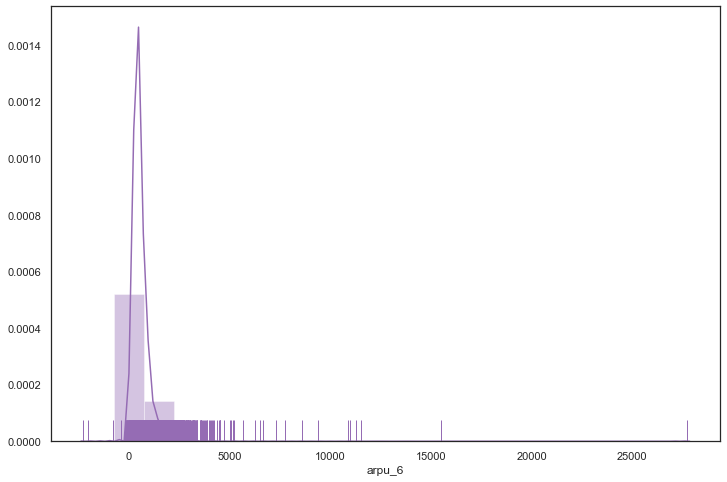

count    30001.000000
mean       560.782203
std        479.776947
min      -2014.045000
25%        309.826000
50%        480.943000
75%        698.315000
max      35145.834000
Name: arpu_7, dtype: float64


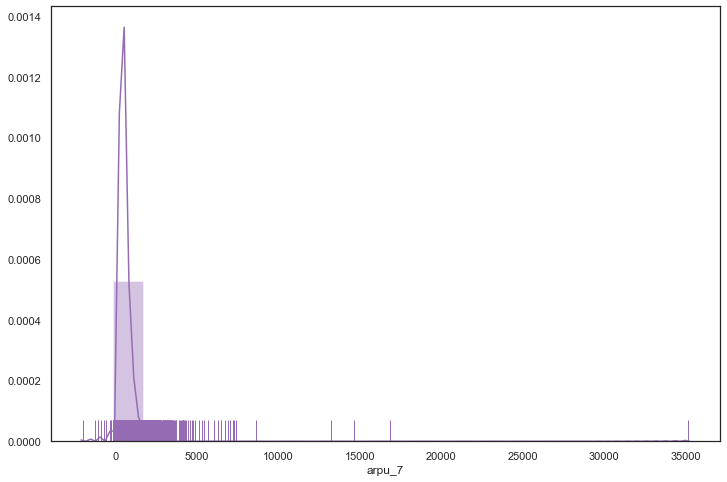

count    30001.000000
mean       508.597957
std        501.961981
min       -945.808000
25%        231.473000
50%        427.585000
75%        661.491000
max      33543.624000
Name: arpu_8, dtype: float64


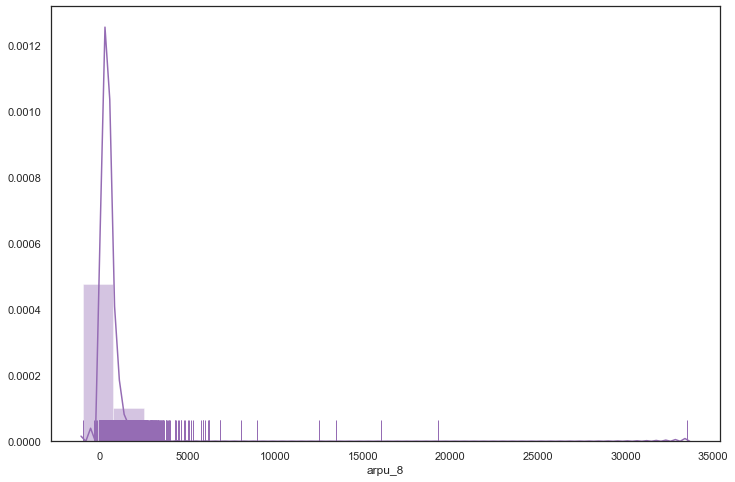

count    30001.000000
mean       259.081600
std        460.787126
min       -138.314187
25%         17.080000
50%         84.580000
75%        290.440000
max       7376.710000
Name: onnet_mou_6, dtype: float64


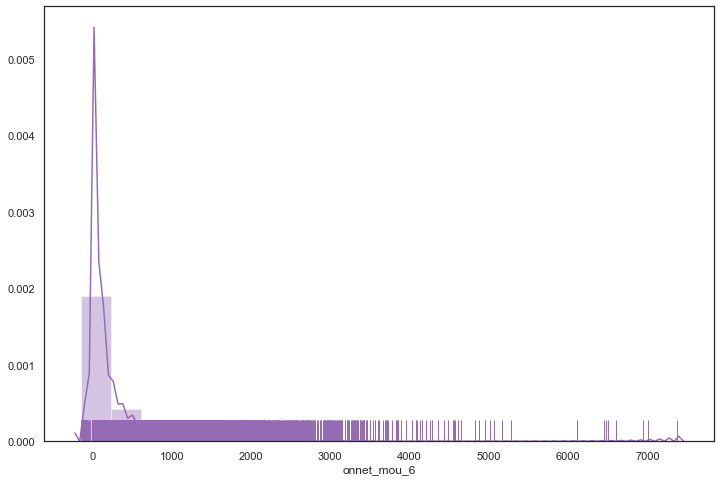

count    30001.000000
mean       266.330676
std        480.958061
min       -525.010242
25%         16.030000
50%         82.810000
75%        290.240000
max       8157.780000
Name: onnet_mou_7, dtype: float64


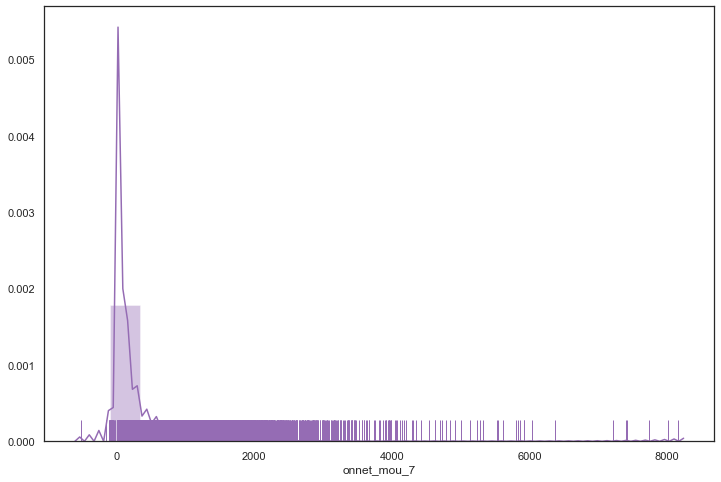

count    30001.000000
mean       230.944251
std        460.348700
min       -680.613051
25%         10.410000
50%         65.610000
75%        239.960000
max      10752.560000
Name: onnet_mou_8, dtype: float64


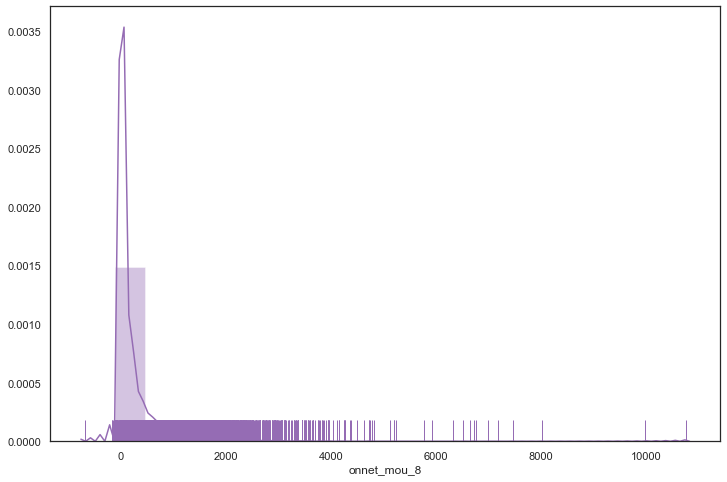

count    30001.000000
mean       376.299623
std        480.883754
min          0.000000
25%         80.690000
50%        222.540000
75%        487.940000
max       8362.360000
Name: offnet_mou_6, dtype: float64


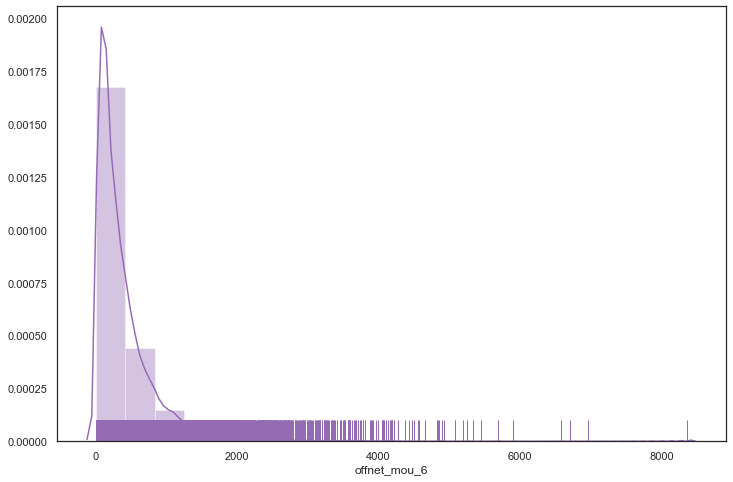

count    30001.000000
mean       380.506140
std        497.426325
min       -306.135847
25%         78.390000
50%        220.040000
75%        494.010000
max       9667.130000
Name: offnet_mou_7, dtype: float64


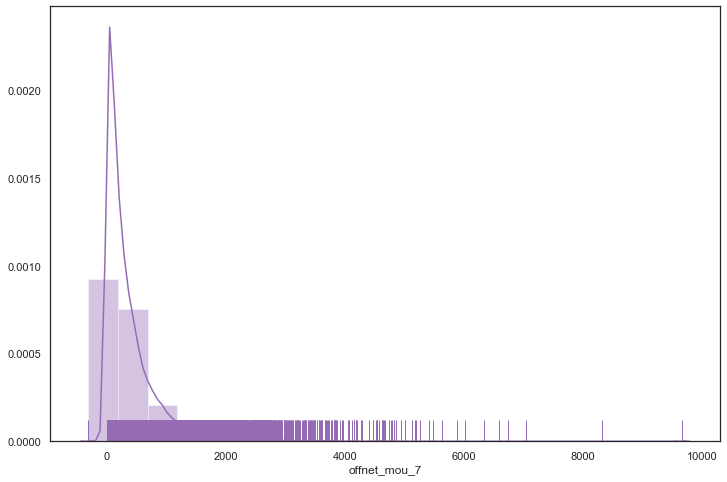

count    30001.000000
mean       340.487462
std        479.046443
min       -256.523369
25%         63.160000
50%        182.840000
75%        438.890000
max      14007.340000
Name: offnet_mou_8, dtype: float64


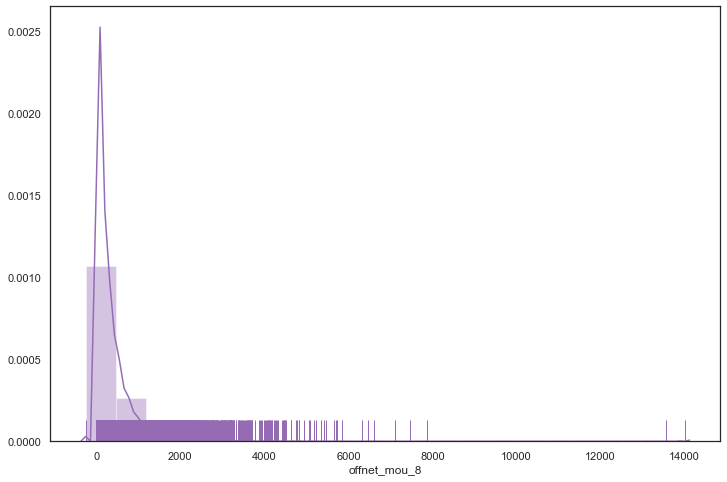

count    30001.000000
mean        16.667004
std         76.348330
min       -136.279129
25%          0.000000
50%          0.000000
75%          0.000000
max       2613.310000
Name: roam_ic_mou_6, dtype: float64


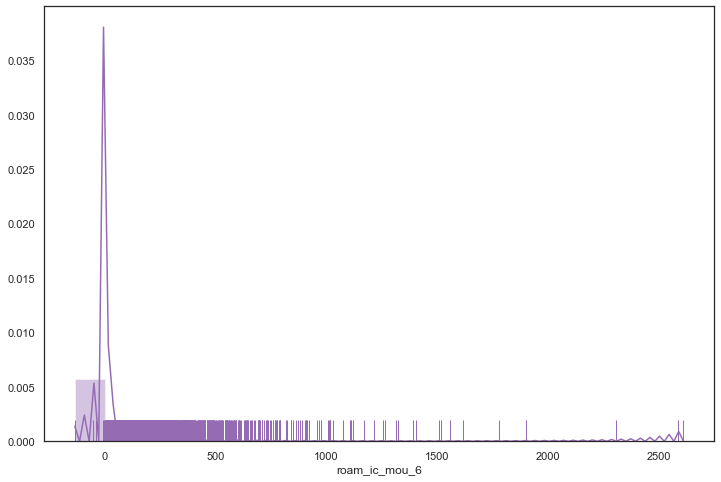

count    30001.000000
mean        12.866454
std         75.896903
min        -89.031403
25%          0.000000
50%          0.000000
75%          0.000000
max       3813.290000
Name: roam_ic_mou_7, dtype: float64


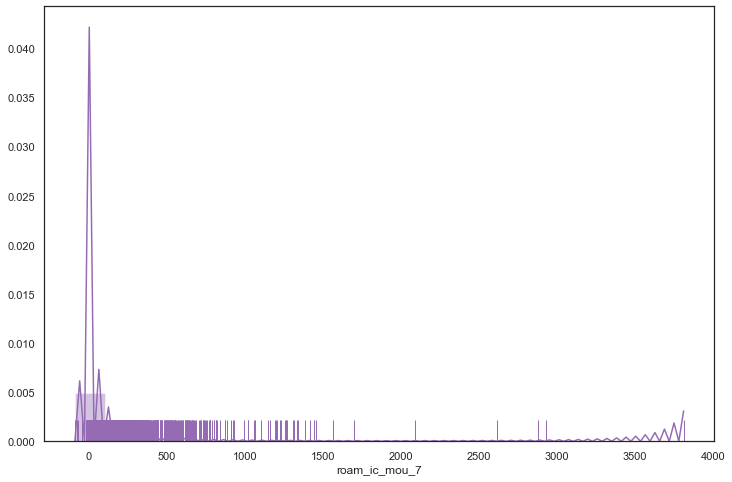

count    30001.000000
mean        13.593433
std         74.568532
min       -368.887926
25%          0.000000
50%          0.000000
75%          0.000000
max       4169.810000
Name: roam_ic_mou_8, dtype: float64


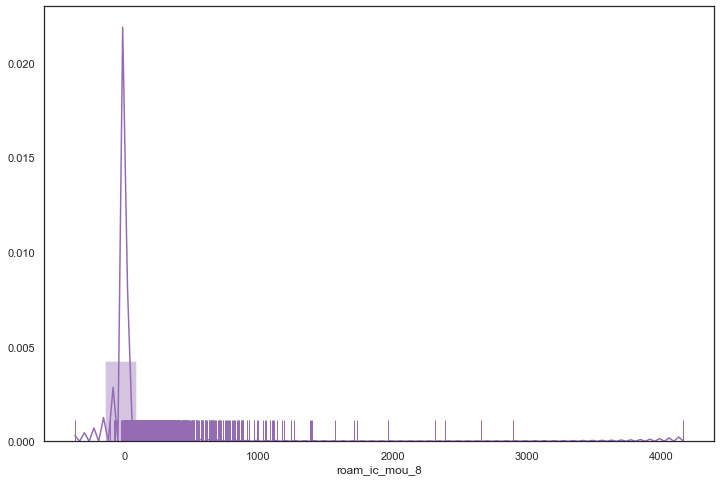

count    30001.000000
mean        27.179874
std        116.154966
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       3775.110000
Name: roam_og_mou_6, dtype: float64


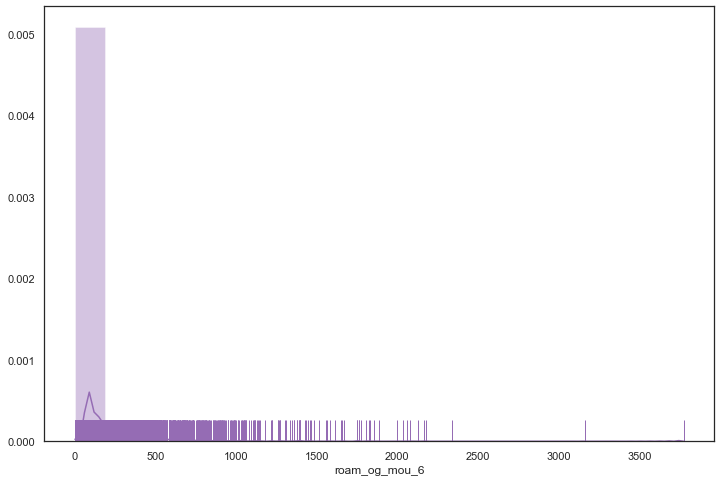

count    30001.000000
mean        20.374226
std         96.078882
min       -142.993350
25%          0.000000
50%          0.000000
75%          0.000000
max       2812.040000
Name: roam_og_mou_7, dtype: float64


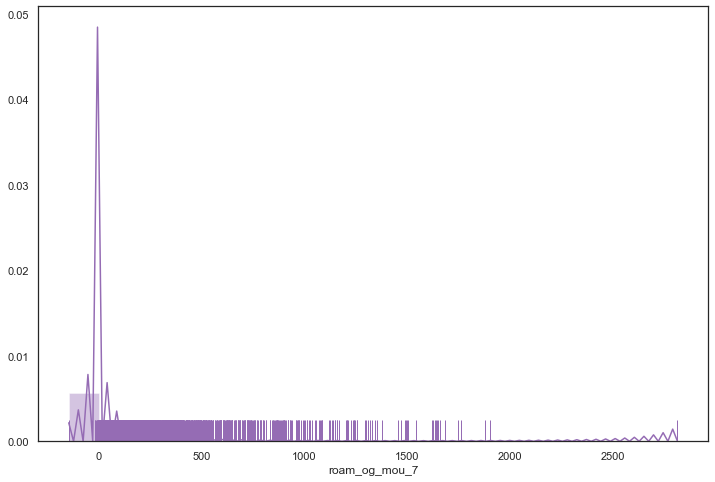

count    30001.000000
mean        21.853474
std        104.818703
min        -94.045432
25%          0.000000
50%          0.000000
75%          0.000000
max       5337.040000
Name: roam_og_mou_8, dtype: float64


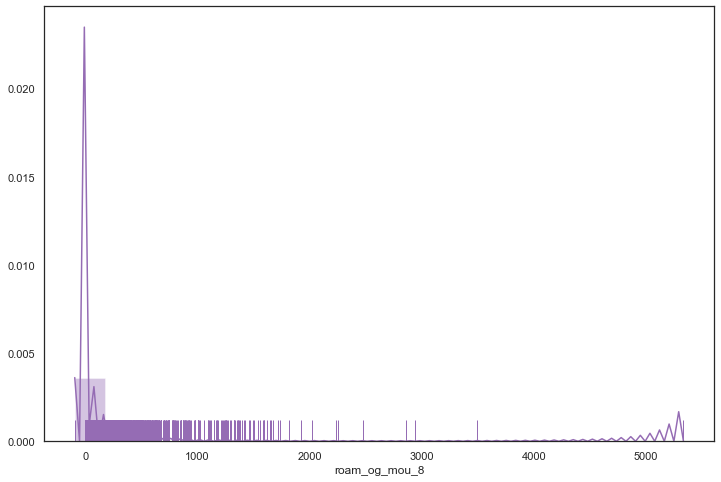

count    30001.000000
mean        82.669484
std        229.851116
min        -99.948407
25%          4.380000
50%         24.330000
75%         77.980000
max       6431.330000
Name: loc_og_t2t_mou_6, dtype: float64


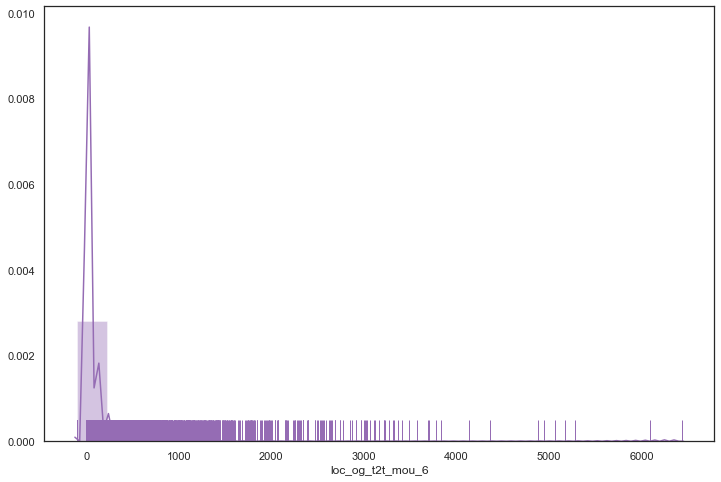

count    30001.000000
mean        83.574173
std        241.773905
min       -117.342241
25%          4.610000
50%         24.680000
75%         78.340000
max       7400.660000
Name: loc_og_t2t_mou_7, dtype: float64


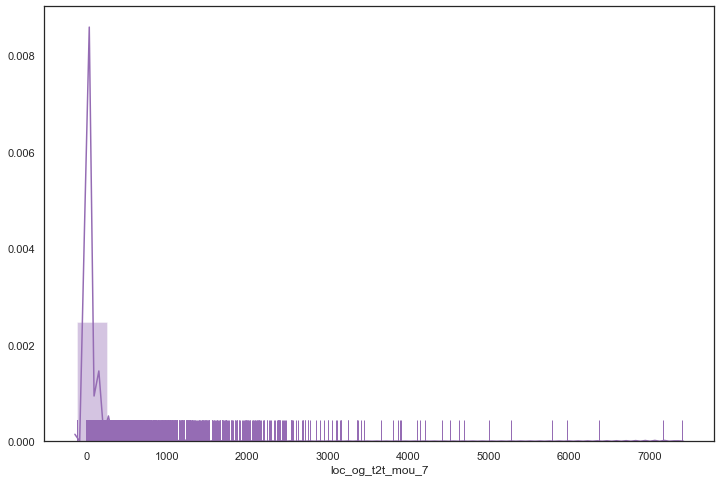

count    30001.000000
mean        73.348838
std        230.187089
min       -120.843530
25%          2.530000
50%         20.730000
75%         72.040000
max      10752.560000
Name: loc_og_t2t_mou_8, dtype: float64


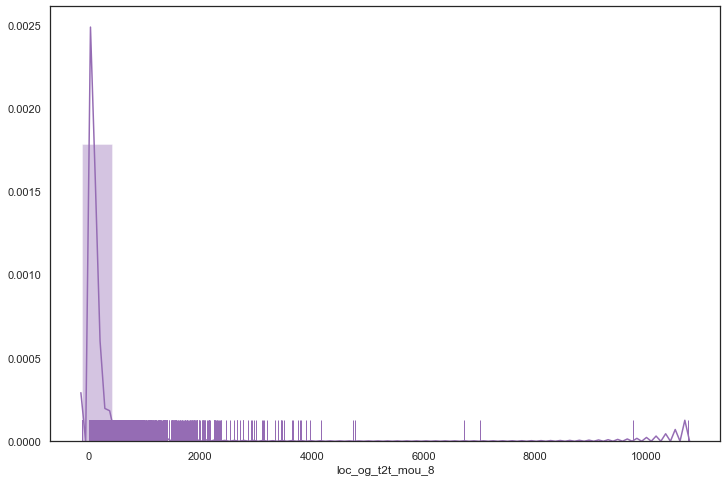

count    30001.000000
mean       164.938945
std        249.319360
min          0.000000
25%         21.840000
50%         83.190000
75%        208.930000
max       4729.740000
Name: loc_og_t2m_mou_6, dtype: float64


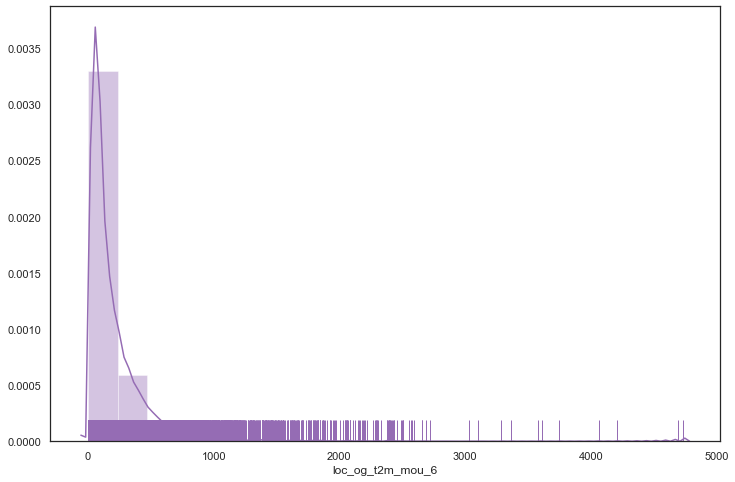

count    30001.000000
mean       164.645770
std        240.775424
min          0.000000
25%         23.680000
50%         84.510000
75%        208.410000
max       4557.140000
Name: loc_og_t2m_mou_7, dtype: float64


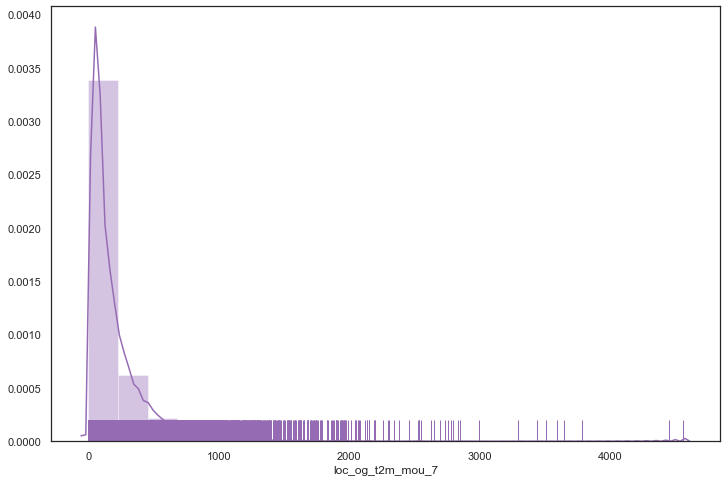

count    30001.000000
mean       155.347201
std        232.000411
min          0.000000
25%         19.090000
50%         81.560000
75%        196.960000
max       4961.330000
Name: loc_og_t2m_mou_8, dtype: float64


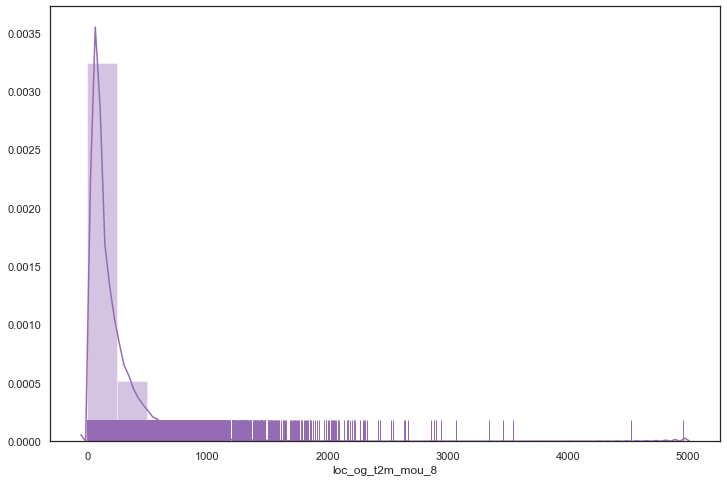

count    30001.000000
mean         6.412174
std         22.109698
min          0.000000
25%          0.000000
50%          0.230000
75%          4.230000
max       1466.030000
Name: loc_og_t2f_mou_6, dtype: float64


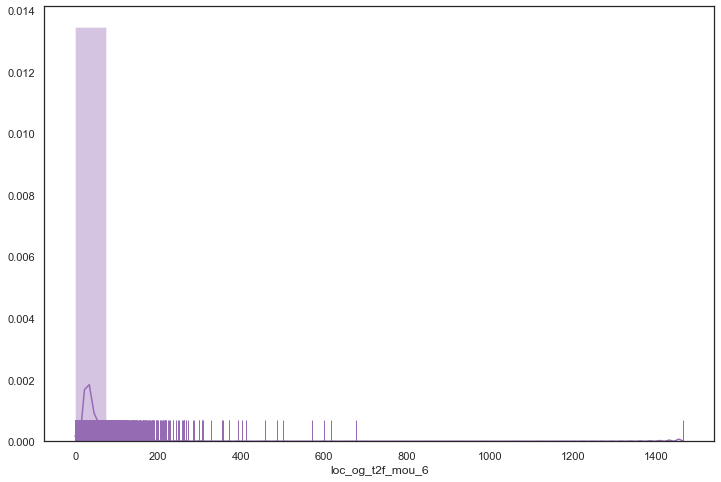

count    30001.000000
mean         6.491538
std         21.930071
min          0.000000
25%          0.000000
50%          0.280000
75%          4.380000
max       1196.430000
Name: loc_og_t2f_mou_7, dtype: float64


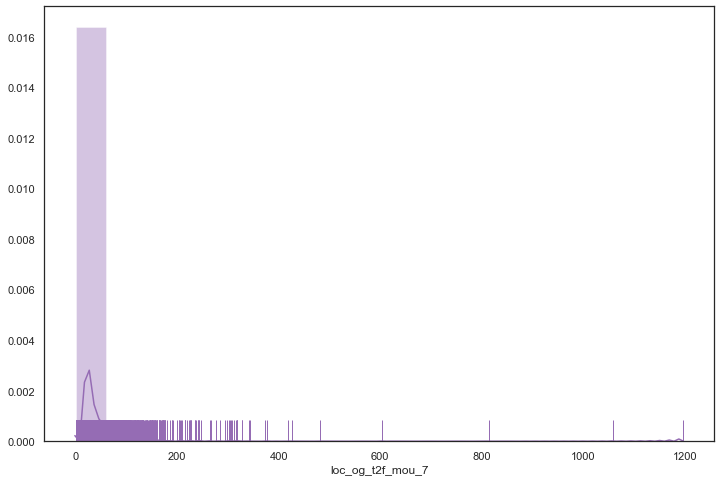

count    30001.000000
mean         6.030220
std         19.471866
min          0.000000
25%          0.000000
50%          0.280000
75%          3.930000
max        928.490000
Name: loc_og_t2f_mou_8, dtype: float64


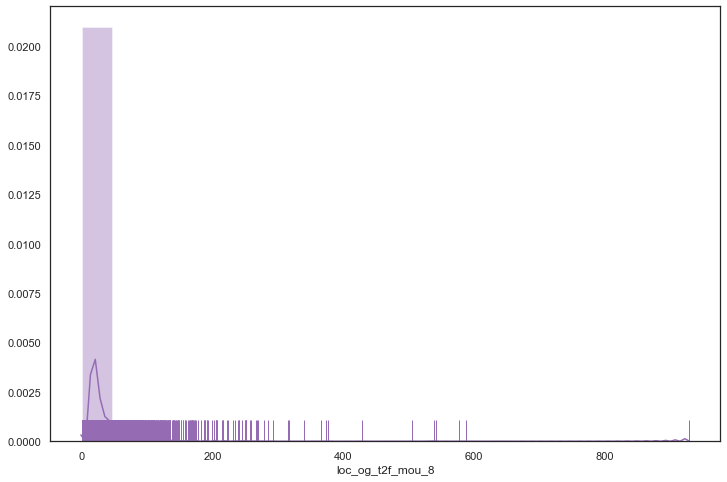

count    30001.000000
mean         1.622195
std          6.303177
min         -1.892828
25%          0.000000
50%          0.000000
75%          0.130000
max        271.440000
Name: loc_og_t2c_mou_6, dtype: float64


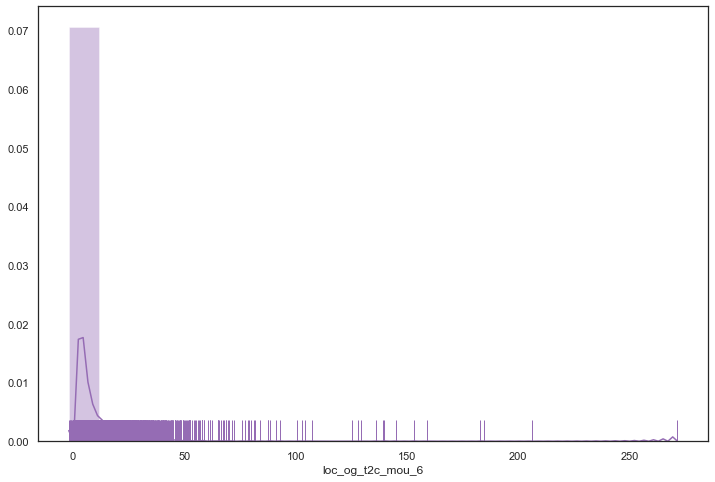

count    30001.000000
mean         1.852676
std          9.178761
min        -29.528068
25%          0.000000
50%          0.000000
75%          0.100000
max        569.710000
Name: loc_og_t2c_mou_7, dtype: float64


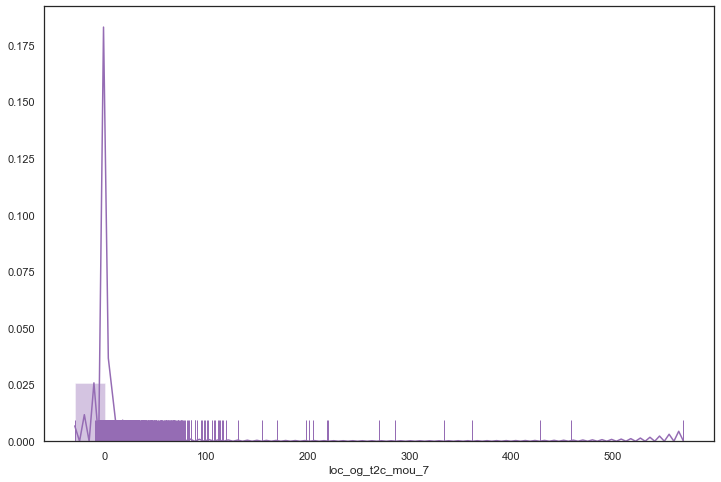

count    30001.000000
mean         1.803182
std          7.222908
min        -11.808239
25%          0.000000
50%          0.000000
75%          0.480000
max        351.830000
Name: loc_og_t2c_mou_8, dtype: float64


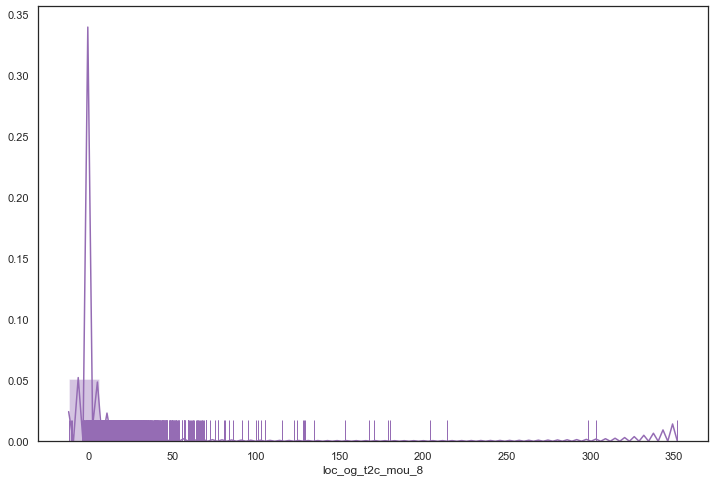

count    30001.000000
mean       254.027279
std        378.374928
min         -2.932602
25%         32.260000
50%        124.540000
75%        332.090000
max      10643.380000
Name: loc_og_mou_6, dtype: float64


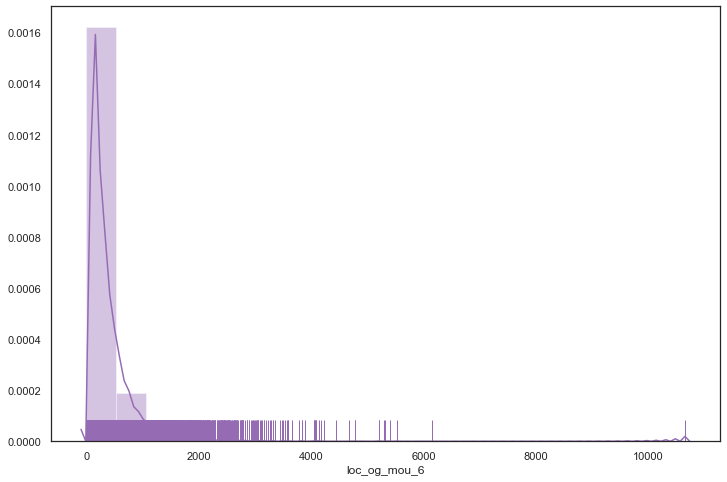

count    30001.000000
mean       254.719759
std        375.699838
min        -22.157596
25%         34.480000
50%        127.880000
75%        333.390000
max       7674.780000
Name: loc_og_mou_7, dtype: float64


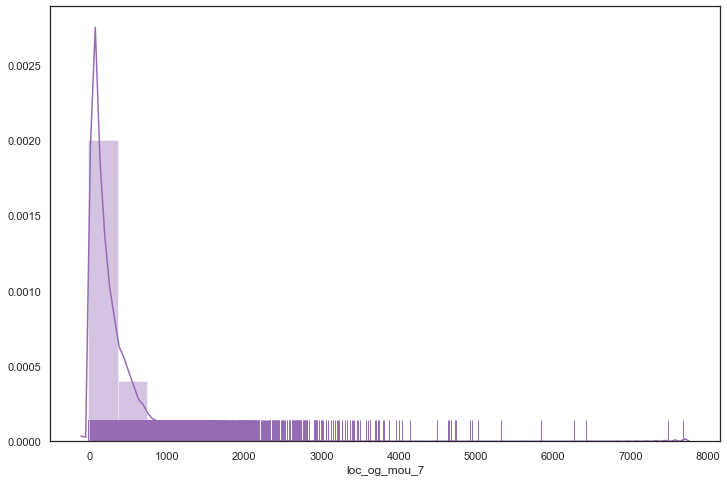

count    30001.000000
mean       234.735302
std        364.046974
min        -25.380245
25%         22.460000
50%        110.810000
75%        310.610000
max      11039.910000
Name: loc_og_mou_8, dtype: float64


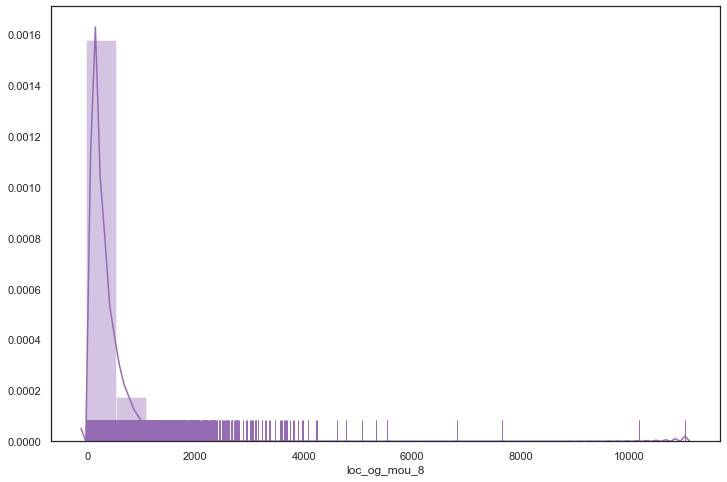

count    30001.000000
mean       166.441314
std        403.624193
min          0.000000
25%          0.000000
50%          4.160000
75%        109.610000
max       7366.580000
Name: std_og_t2t_mou_6, dtype: float64


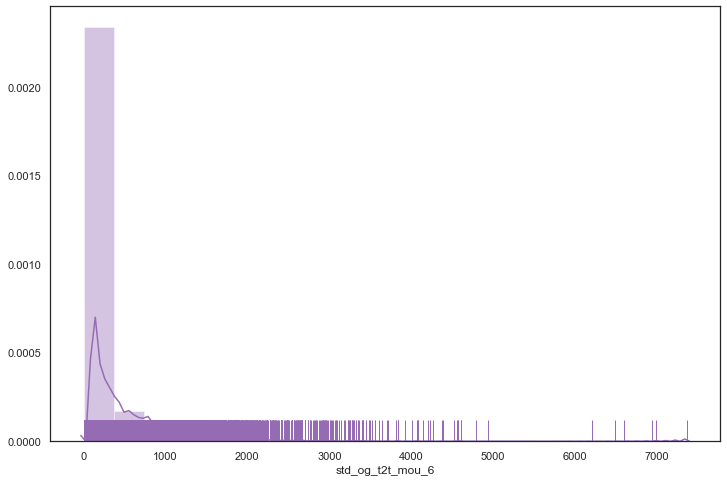

count    30001.000000
mean       174.824302
std        420.968608
min          0.000000
25%          0.000000
50%          4.040000
75%        116.610000
max       8133.660000
Name: std_og_t2t_mou_7, dtype: float64


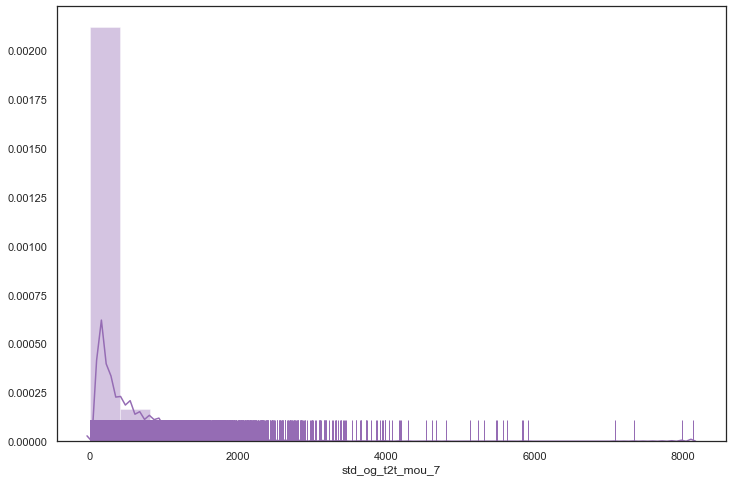

count    30001.000000
mean       149.745394
std        397.129859
min          0.000000
25%          0.000000
50%          2.530000
75%         78.190000
max       8014.430000
Name: std_og_t2t_mou_8, dtype: float64


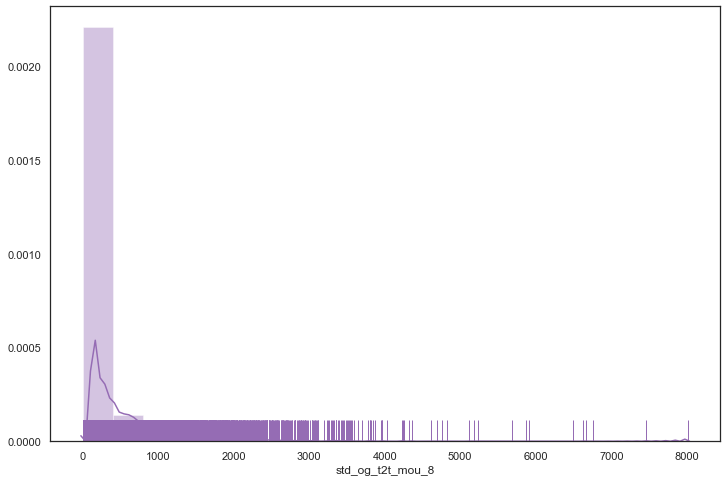

count    30001.000000
mean       181.019255
std        408.495919
min          0.000000
25%          0.000000
50%         20.040000
75%        154.540000
max       8314.760000
Name: std_og_t2m_mou_6, dtype: float64


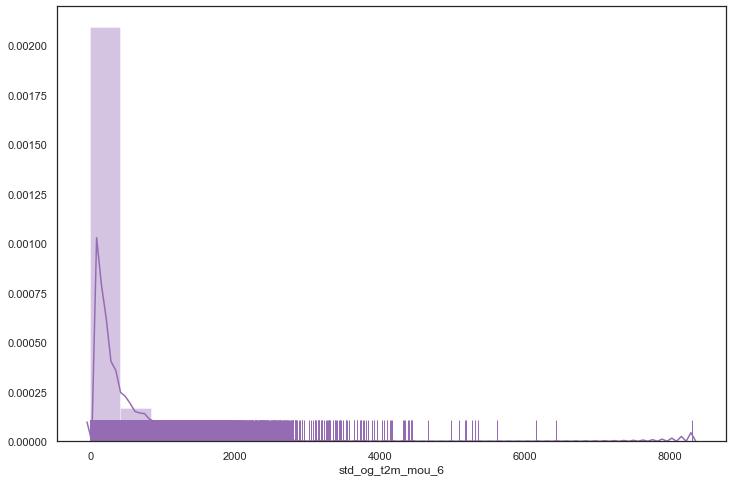

count    30001.000000
mean       189.546152
std        433.094548
min          0.000000
25%          0.000000
50%         19.880000
75%        160.280000
max       9284.740000
Name: std_og_t2m_mou_7, dtype: float64


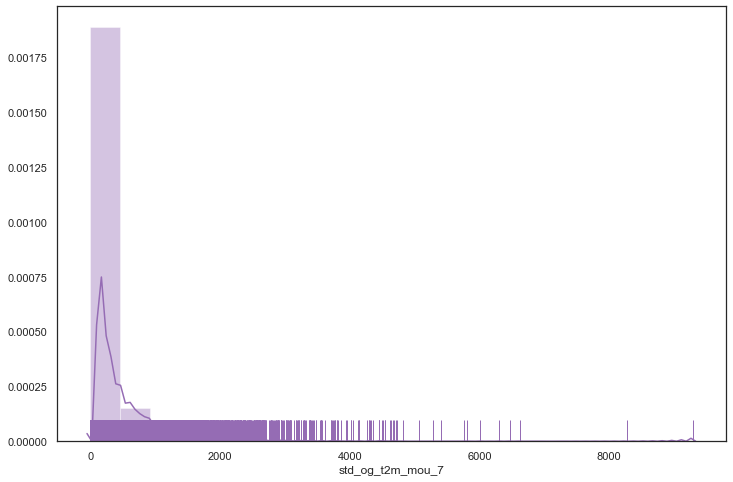

count    30001.000000
mean       160.865258
std        408.117868
min          0.000000
25%          0.000000
50%         15.530000
75%        117.780000
max      13950.040000
Name: std_og_t2m_mou_8, dtype: float64


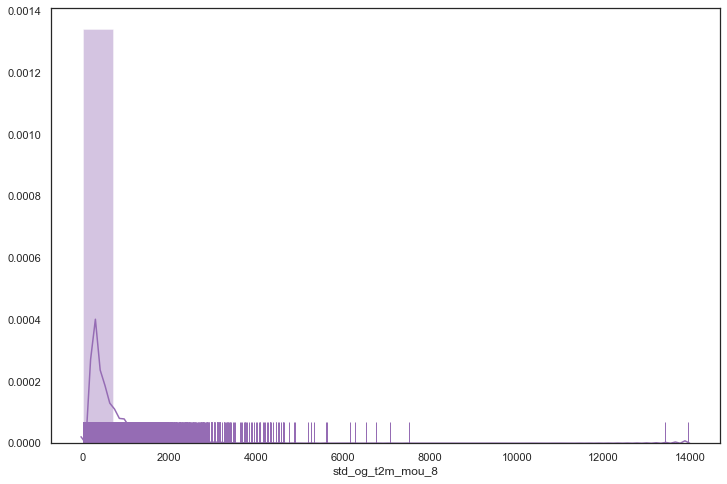

count    30001.000000
mean         1.823942
std         11.977297
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        628.560000
Name: std_og_t2f_mou_6, dtype: float64


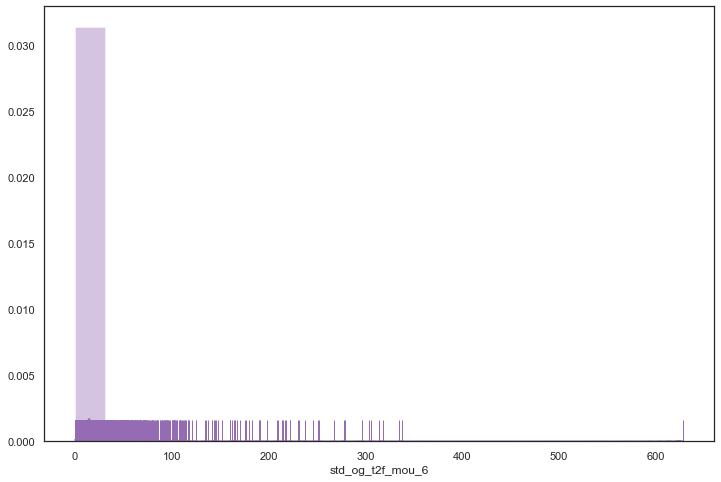

count    30001.000000
mean         1.846063
std         12.978300
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        544.630000
Name: std_og_t2f_mou_7, dtype: float64


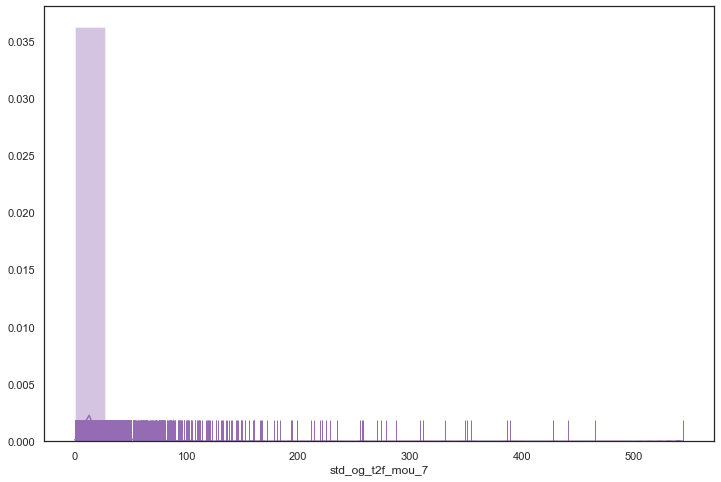

count    30001.000000
mean         1.626716
std         10.927696
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        516.910000
Name: std_og_t2f_mou_8, dtype: float64


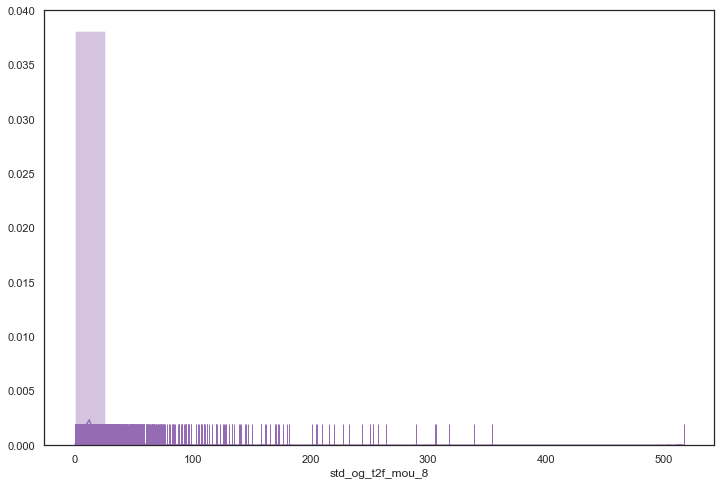

count    30001.000000
mean       349.288022
std        607.602589
min          0.000000
25%          0.860000
50%         56.630000
75%        465.390000
max       8432.990000
Name: std_og_mou_6, dtype: float64


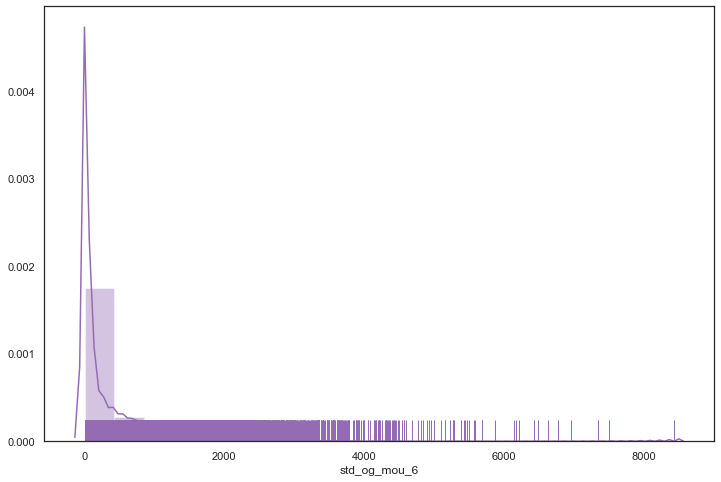

count    30001.000000
mean       366.220469
std        638.740751
min          0.000000
25%          0.610000
50%         55.540000
75%        499.290000
max      10936.730000
Name: std_og_mou_7, dtype: float64


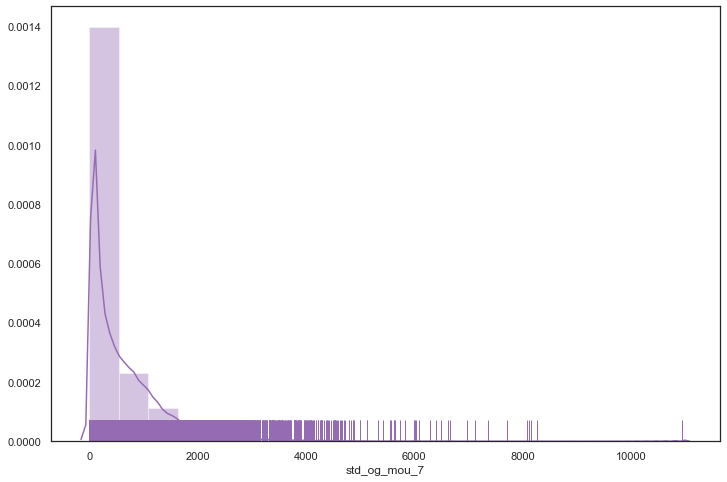

count    30001.000000
mean       312.239946
std        606.996133
min          0.000000
25%          0.050000
50%         41.630000
75%        357.230000
max      13980.060000
Name: std_og_mou_8, dtype: float64


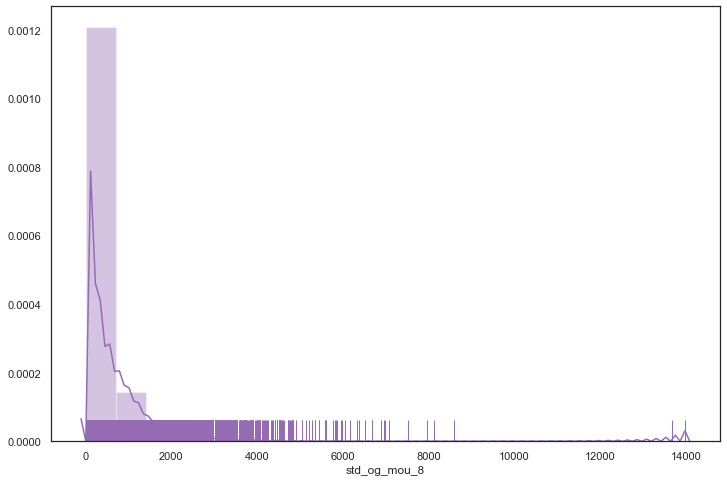

count    30001.000000
mean        -0.015001
std         48.685984
min       -120.384352
25%          0.000000
50%          0.000000
75%          0.000000
max       5900.660000
Name: isd_og_mou_6, dtype: float64


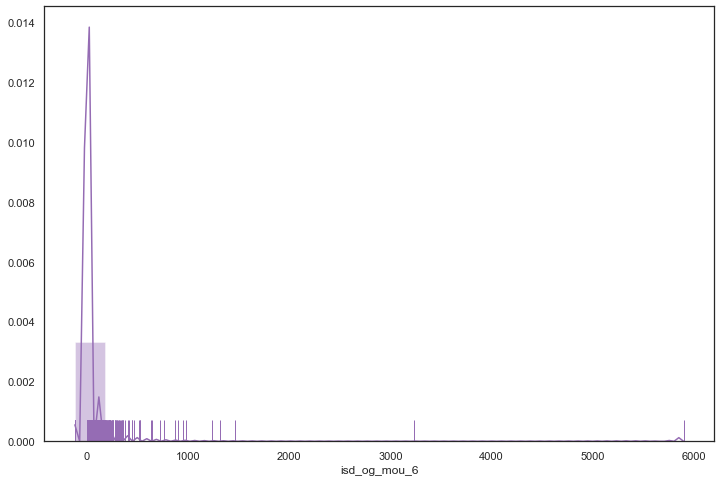

count    30001.000000
mean         0.176592
std         47.819417
min       -107.803848
25%          0.000000
50%          0.000000
75%          0.000000
max       5490.280000
Name: isd_og_mou_7, dtype: float64


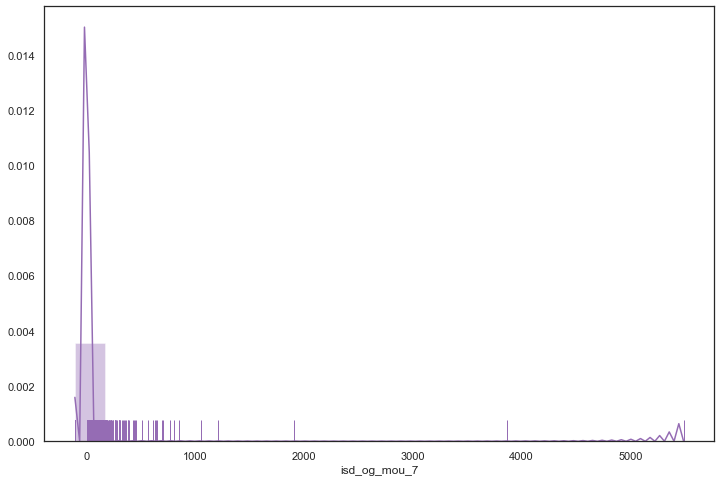

count    30001.000000
mean        -2.115664
std         49.200548
min       -103.896023
25%          0.000000
50%          0.000000
75%          0.000000
max       5681.540000
Name: isd_og_mou_8, dtype: float64


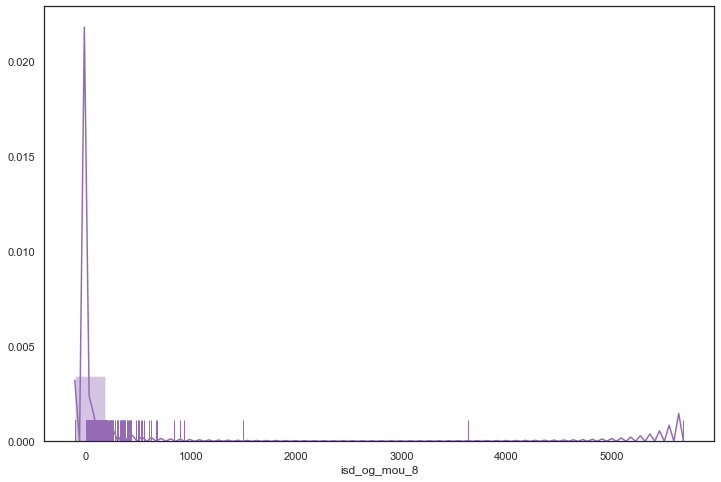

count    30001.000000
mean         5.889304
std         17.551465
min          0.000000
25%          0.000000
50%          0.410000
75%          5.210000
max       1023.210000
Name: spl_og_mou_6, dtype: float64


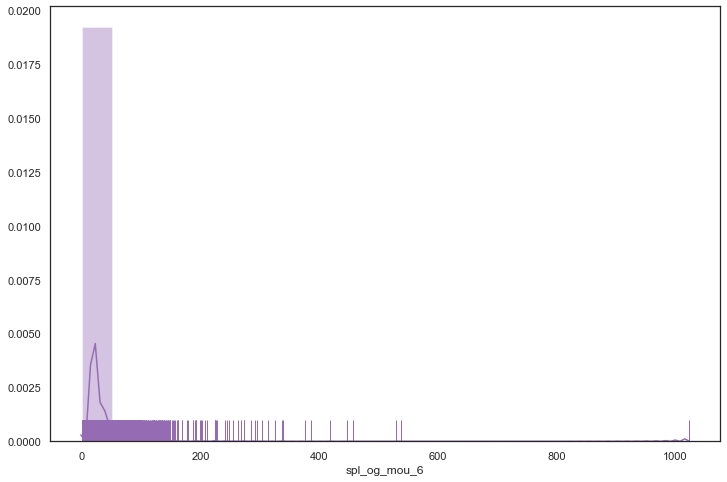

count    30001.00000
mean         7.19766
std         21.76923
min          0.00000
25%          0.00000
50%          0.91000
75%          6.94000
max       1265.79000
Name: spl_og_mou_7, dtype: float64


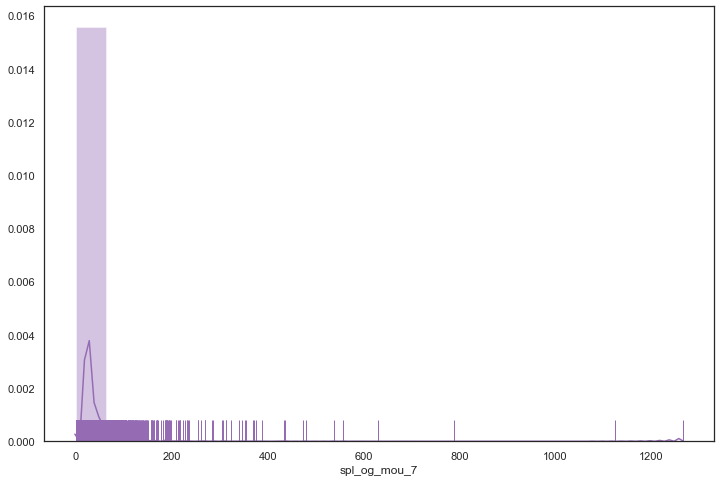

count    30001.000000
mean         6.754774
std         20.271628
min          0.000000
25%          0.000000
50%          0.880000
75%          6.150000
max        954.510000
Name: spl_og_mou_8, dtype: float64


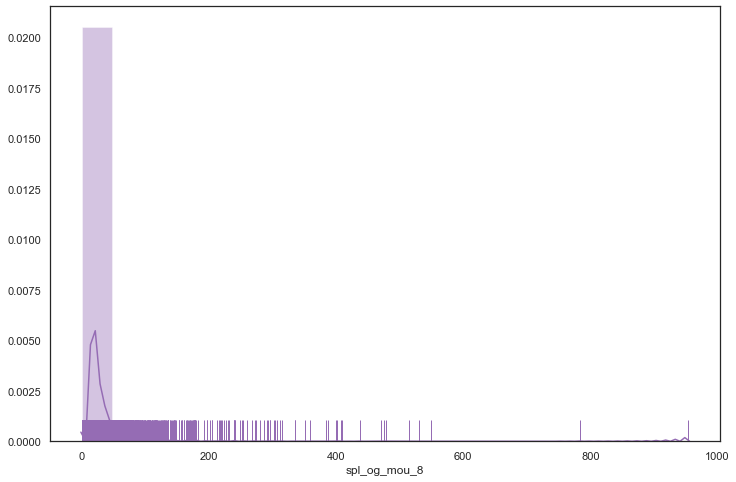

count    30001.000000
mean         0.669137
std          4.107091
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        609.810000
Name: og_others_6, dtype: float64


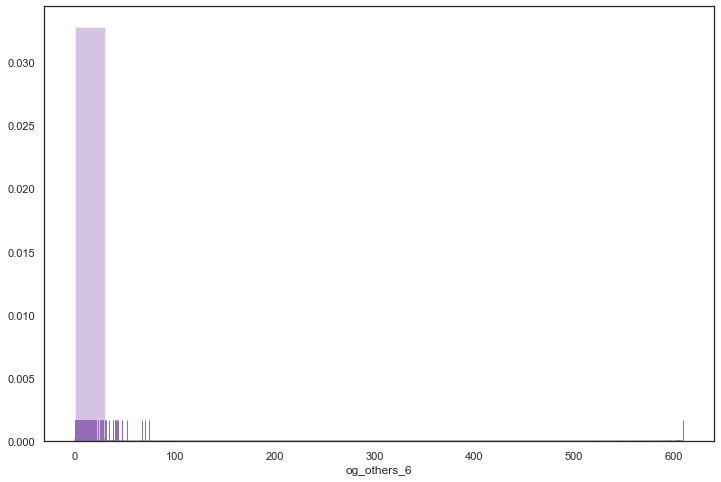

count    30001.000000
mean         0.043767
std          2.676787
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        370.130000
Name: og_others_7, dtype: float64


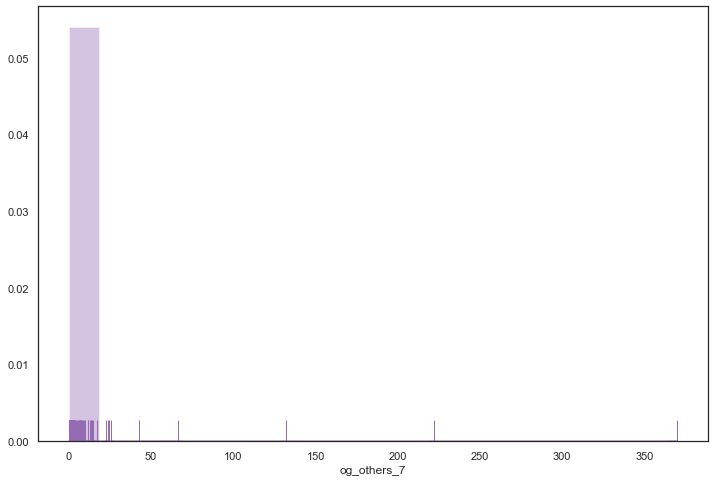

count    30001.000000
mean         0.058766
std          3.315110
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        394.930000
Name: og_others_8, dtype: float64


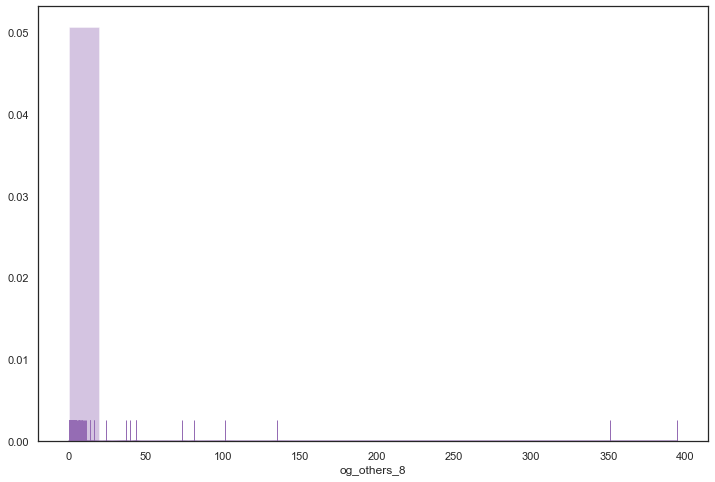

count    30001.000000
mean       609.866251
std        690.873430
min          0.000000
25%        116.580000
50%        410.630000
75%        858.760000
max      10674.030000
Name: total_og_mou_6, dtype: float64


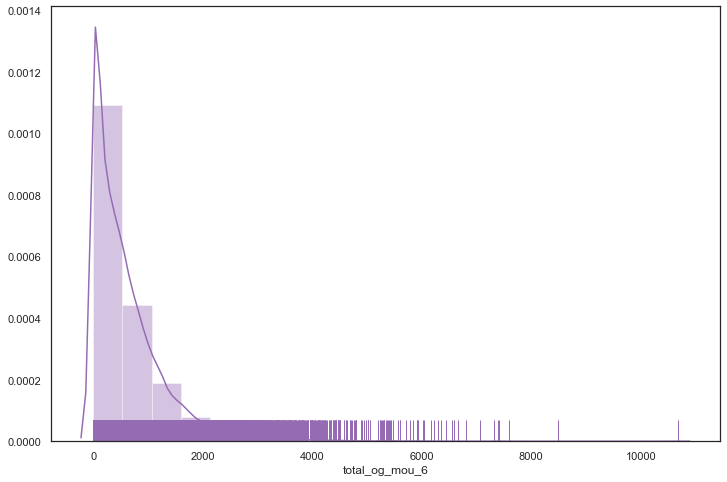

count    30001.000000
mean       628.366047
std        717.219171
min          0.000000
25%        116.490000
50%        425.590000
75%        891.440000
max      11365.310000
Name: total_og_mou_7, dtype: float64


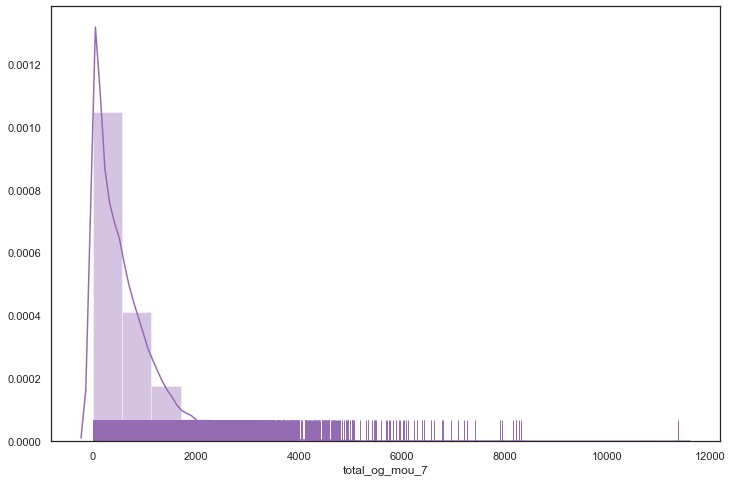

count    30001.000000
mean       551.678812
std        700.478180
min          0.000000
25%         72.360000
50%        333.540000
75%        774.780000
max      14043.060000
Name: total_og_mou_8, dtype: float64


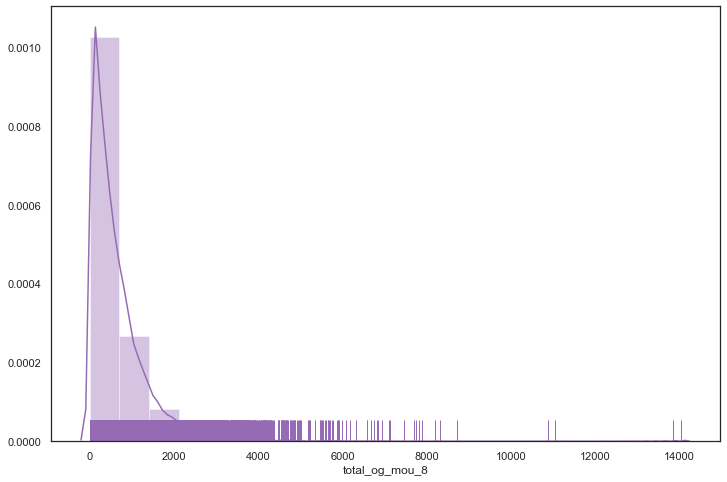

count    30001.000000
mean        64.383216
std        164.354476
min        -58.919858
25%          6.090000
50%         25.080000
75%         67.430000
max       6351.440000
Name: loc_ic_t2t_mou_6, dtype: float64


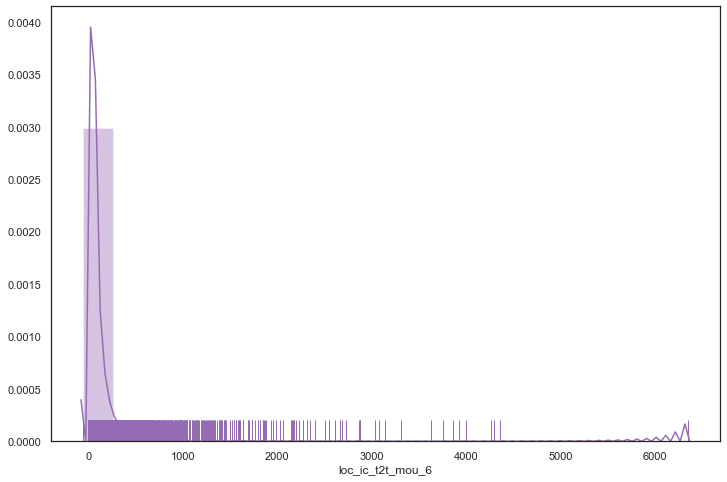

count    30001.000000
mean        65.493151
std        168.072201
min        -63.923616
25%          6.780000
50%         25.780000
75%         68.640000
max       5709.590000
Name: loc_ic_t2t_mou_7, dtype: float64


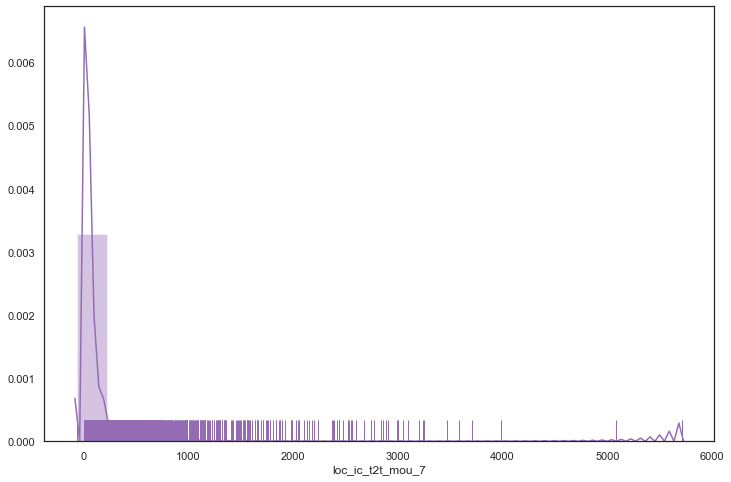

count    30001.000000
mean        60.087822
std        160.398129
min        -64.730504
25%          4.880000
50%         22.610000
75%         65.080000
max       4003.210000
Name: loc_ic_t2t_mou_8, dtype: float64


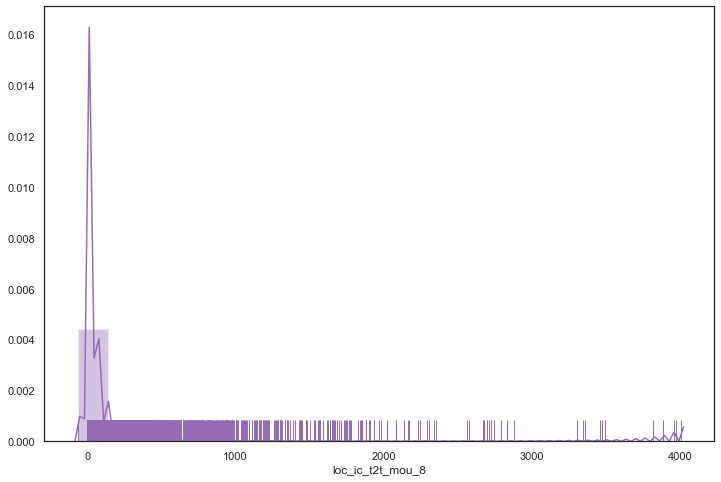

count    30001.000000
mean       152.364775
std        218.327436
min          0.000000
25%         31.440000
50%         89.360000
75%        188.710000
max       4693.860000
Name: loc_ic_t2m_mou_6, dtype: float64


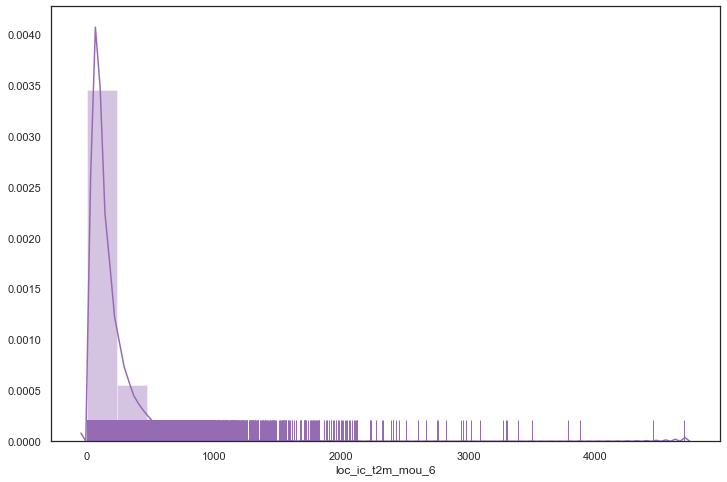

count    30001.000000
mean       153.542541
std        217.371524
min          0.000000
25%         34.230000
50%         91.010000
75%        190.660000
max       4171.510000
Name: loc_ic_t2m_mou_7, dtype: float64


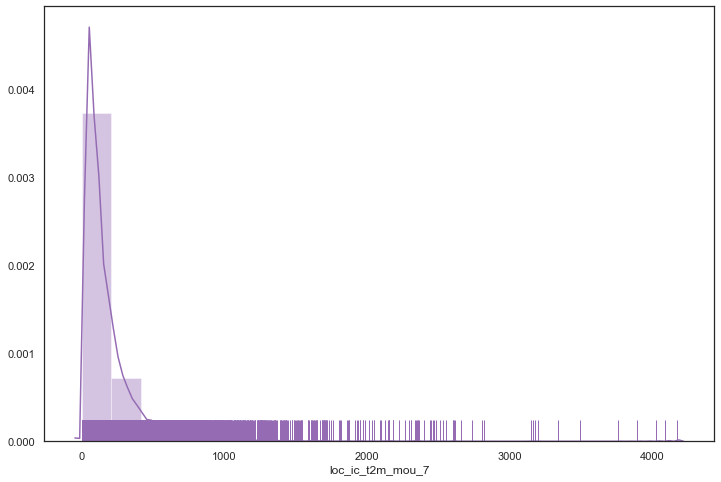

count    30001.000000
mean       150.476973
std        213.015343
min          0.000000
25%         31.390000
50%         91.790000
75%        185.730000
max       4643.490000
Name: loc_ic_t2m_mou_8, dtype: float64


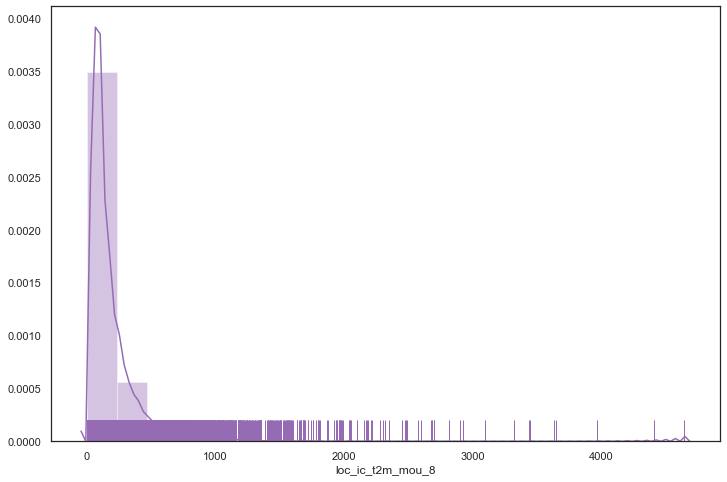

count    30001.000000
mean        15.498003
std         45.707069
min          0.000000
25%          0.000000
50%          2.180000
75%         12.085111
max       1678.410000
Name: loc_ic_t2f_mou_6, dtype: float64


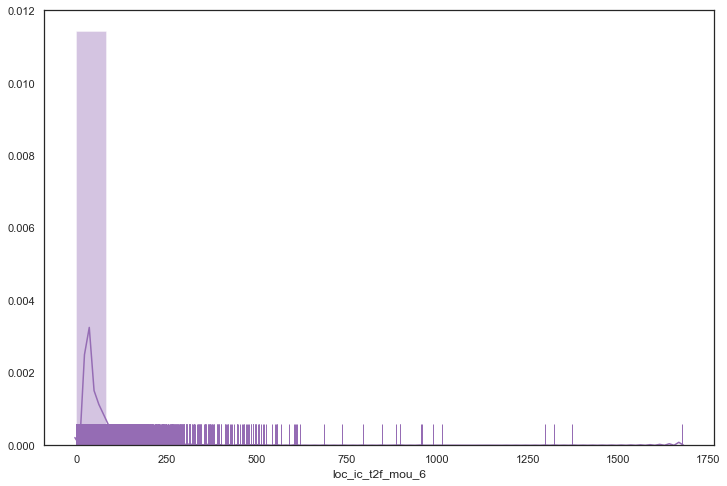

count    30001.000000
mean        16.261121
std         49.120772
min          0.000000
25%          0.000000
50%          2.360000
75%         12.601417
max       1983.010000
Name: loc_ic_t2f_mou_7, dtype: float64


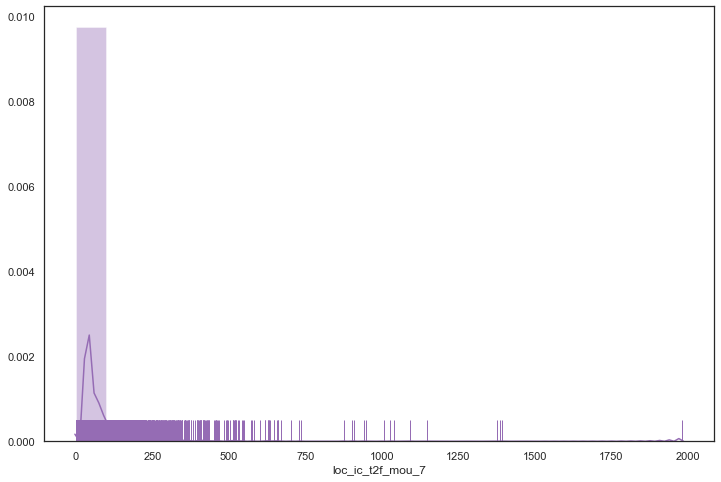

count    30001.000000
mean        14.863080
std         43.212089
min          0.000000
25%          0.000000
50%          2.410000
75%         11.753174
max       1588.530000
Name: loc_ic_t2f_mou_8, dtype: float64


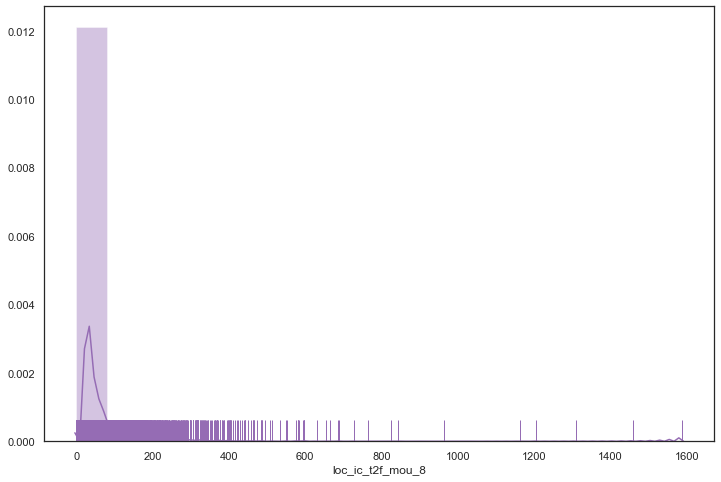

count    30001.000000
mean       232.254234
std        314.116336
min          0.000000
25%         52.640000
50%        134.490000
75%        297.140000
max       7454.630000
Name: loc_ic_mou_6, dtype: float64


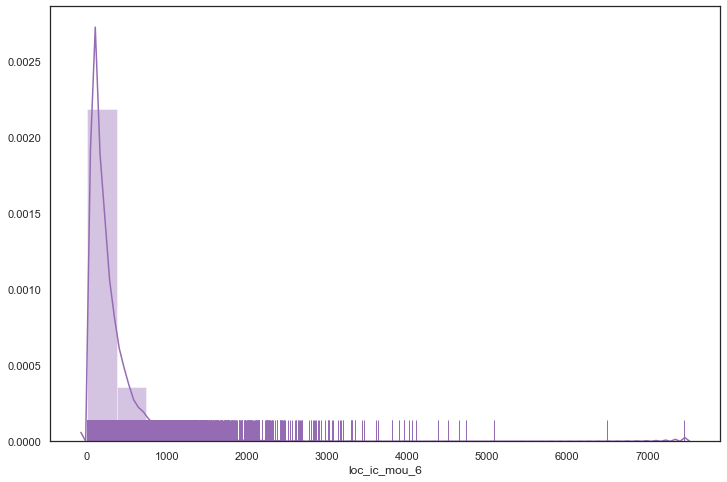

count    30001.000000
mean       235.305884
std        315.340566
min          0.000000
25%         55.782615
50%        137.590000
75%        298.710000
max       6466.740000
Name: loc_ic_mou_7, dtype: float64


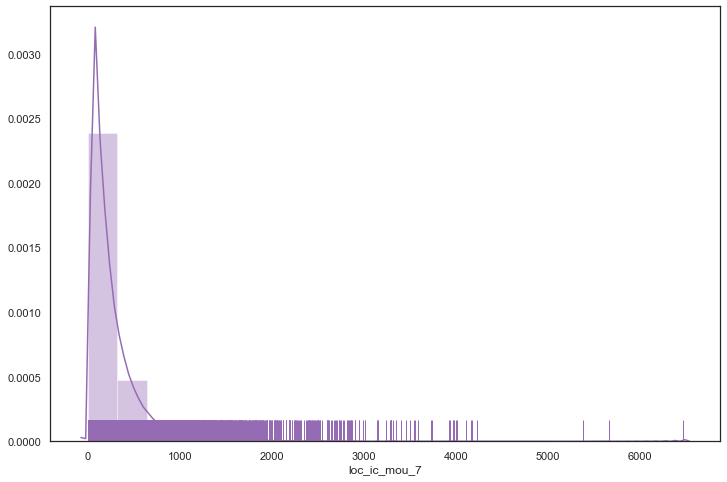

count    30001.000000
mean       225.437375
std        306.926612
min          0.000000
25%         51.780000
50%        128.730000
75%        285.440000
max       5388.740000
Name: loc_ic_mou_8, dtype: float64


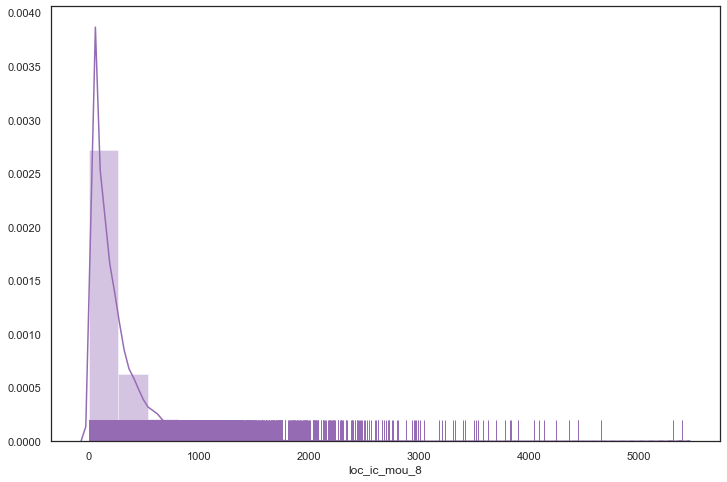

count    30001.000000
mean        14.475923
std         77.836876
min        -23.065996
25%          0.000000
50%          0.380000
75%          8.200000
max       5459.560000
Name: std_ic_t2t_mou_6, dtype: float64


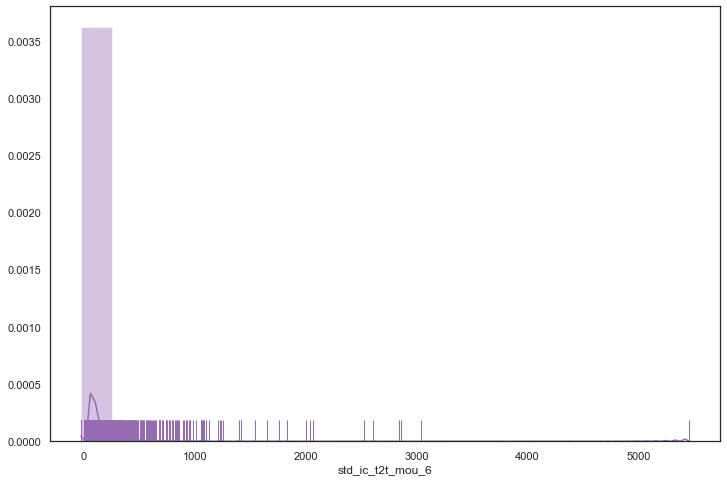

count    30001.000000
mean        15.006179
std         83.176740
min        -23.211752
25%          0.000000
50%          0.450000
75%          8.590000
max       5800.930000
Name: std_ic_t2t_mou_7, dtype: float64


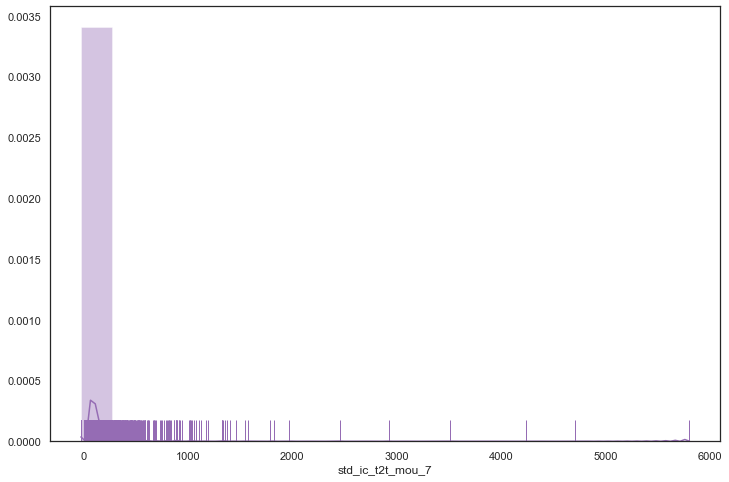

count    30001.000000
mean        12.997909
std         71.660756
min        -23.410559
25%          0.000000
50%          0.110000
75%          7.040000
max       4309.290000
Name: std_ic_t2t_mou_8, dtype: float64


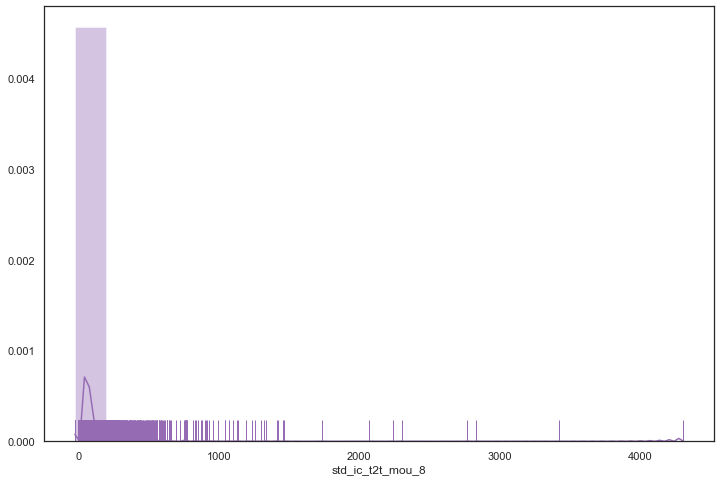

count    30001.000000
mean        29.571661
std         98.137535
min          0.000000
25%          0.000000
50%          5.730000
75%         23.600000
max       4630.230000
Name: std_ic_t2m_mou_6, dtype: float64


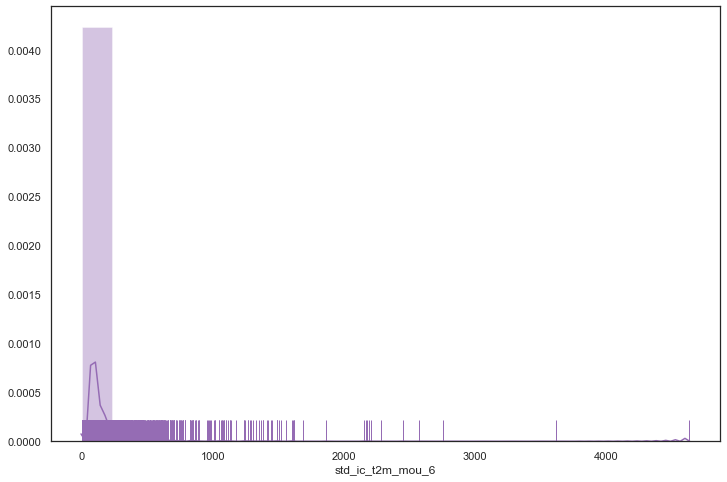

count    30001.000000
mean        31.210164
std        105.590408
min          0.000000
25%          0.000000
50%          5.940000
75%         24.940000
max       3470.380000
Name: std_ic_t2m_mou_7, dtype: float64


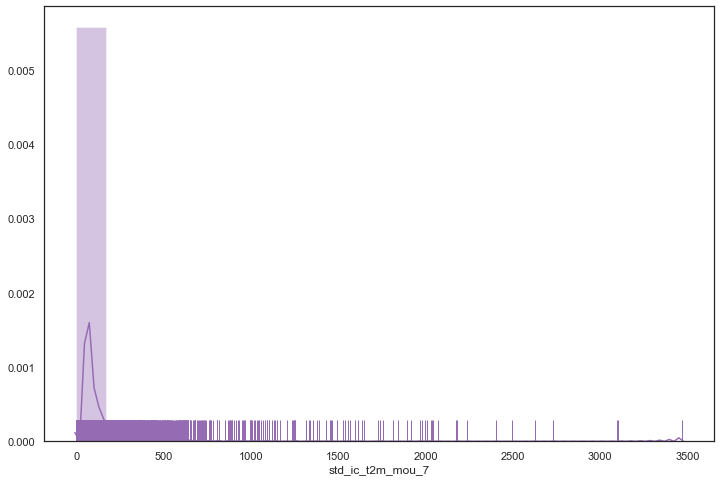

count    30001.000000
mean        28.751523
std        103.199383
min          0.000000
25%          0.000000
50%          5.290000
75%         21.810000
max       5645.860000
Name: std_ic_t2m_mou_8, dtype: float64


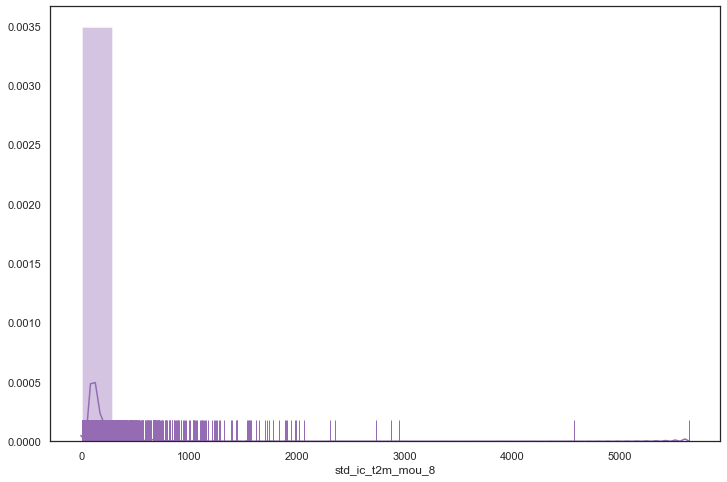

count    30001.000000
mean         2.735005
std         19.096569
min          0.000000
25%          0.000000
50%          0.000000
75%          0.300000
max       1351.110000
Name: std_ic_t2f_mou_6, dtype: float64


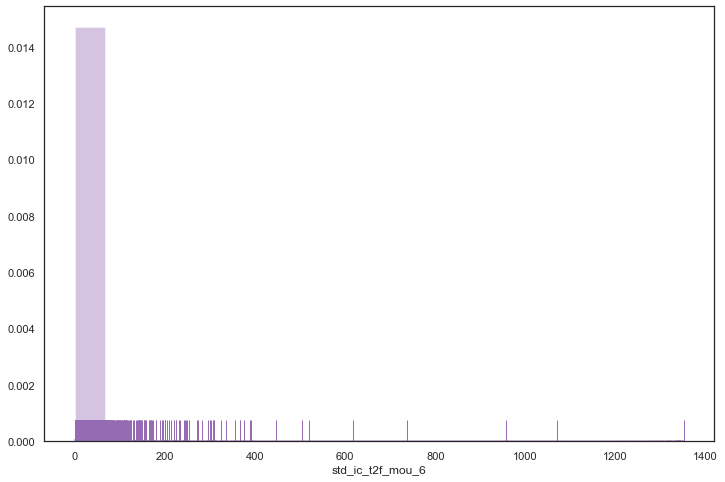

count    30001.000000
mean         2.838112
std         19.511027
min          0.000000
25%          0.000000
50%          0.000000
75%          0.360000
max       1136.080000
Name: std_ic_t2f_mou_7, dtype: float64


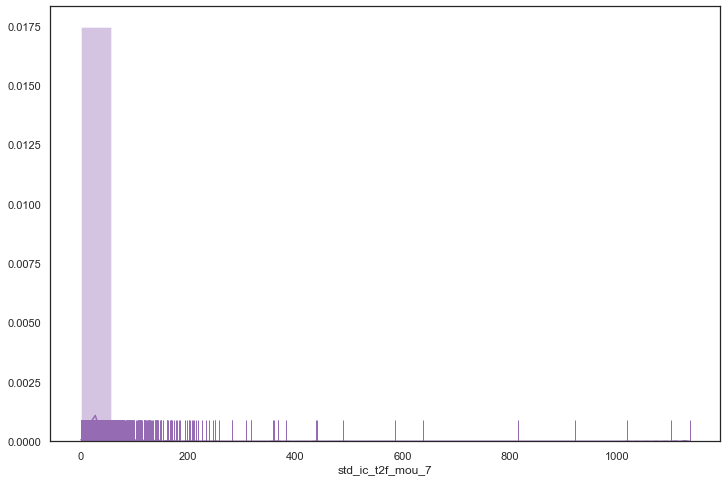

count    30001.000000
mean         2.643533
std         19.890539
min          0.000000
25%          0.000000
50%          0.000000
75%          0.510000
max       1394.890000
Name: std_ic_t2f_mou_8, dtype: float64


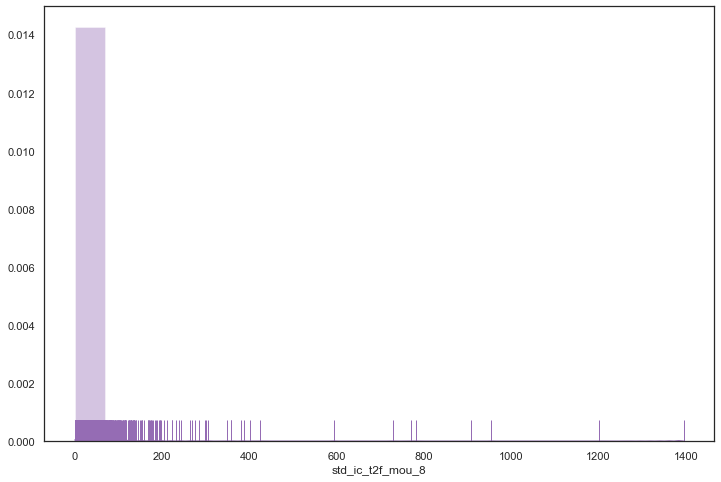

count    30001.000000
mean        46.786076
std        137.502614
min         -0.186367
25%          1.030000
50%         11.410000
75%         41.490000
max       5459.630000
Name: std_ic_mou_6, dtype: float64


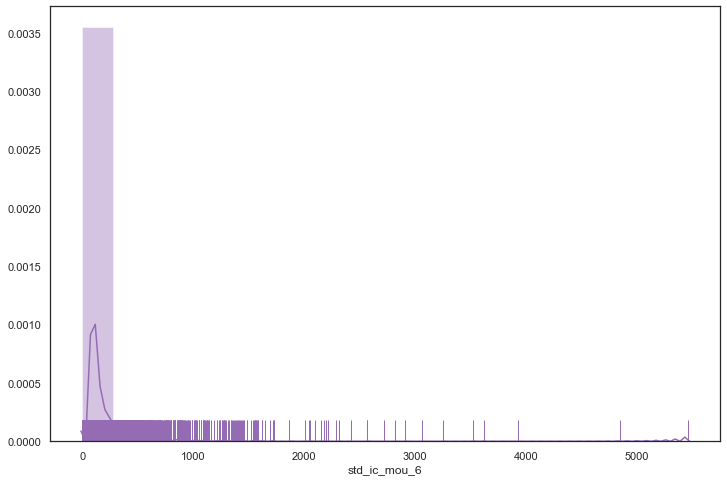

count    30001.000000
mean        49.058085
std        148.157179
min          0.000000
25%          1.050000
50%         12.090000
75%         43.810000
max       6745.760000
Name: std_ic_mou_7, dtype: float64


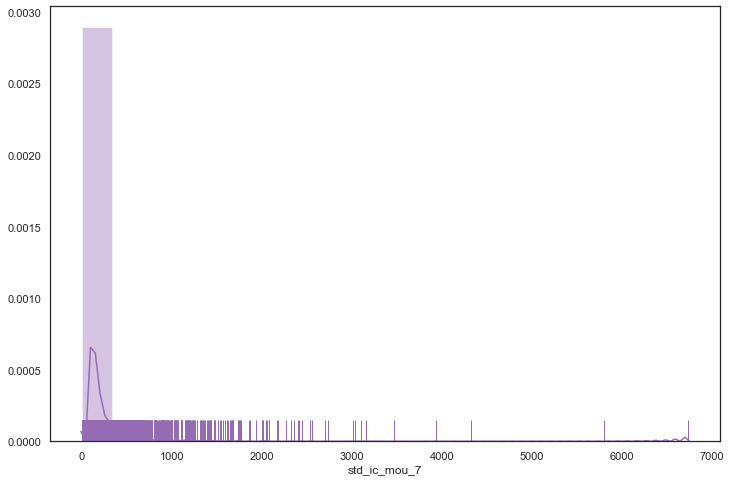

count    30001.000000
mean        44.396953
std        138.814811
min         -0.121865
25%          0.410000
50%          9.290000
75%         38.380000
max       5957.140000
Name: std_ic_mou_8, dtype: float64


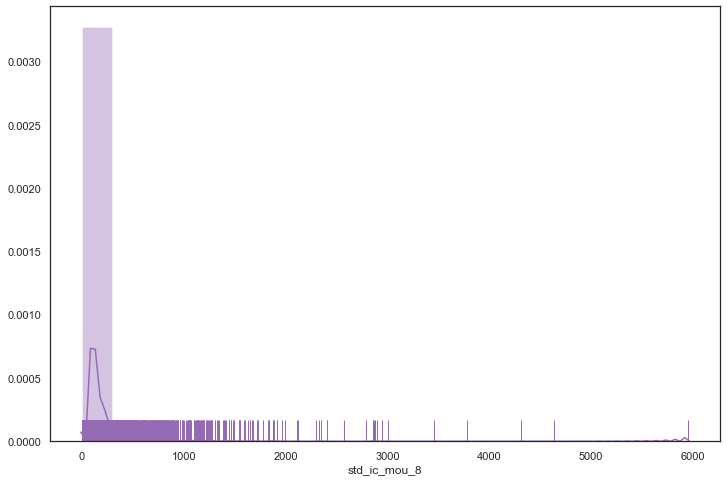

count    30001.000000
mean       289.950496
std        365.523475
min          0.000000
25%         72.880000
50%        183.730000
75%        371.990000
max       7716.140000
Name: total_ic_mou_6, dtype: float64


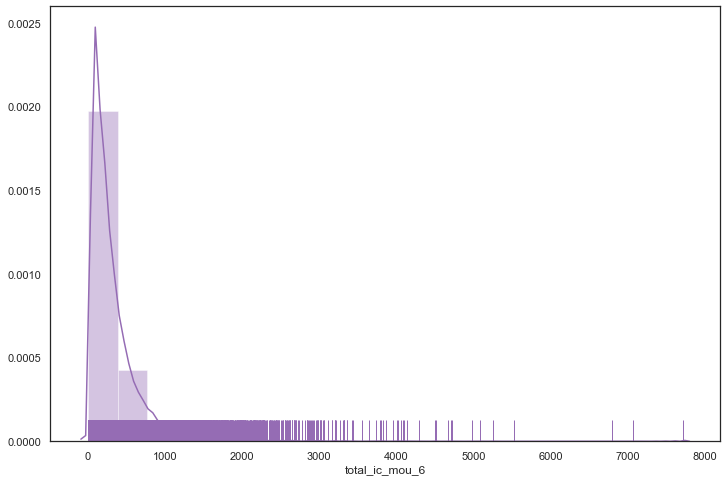

count    30001.000000
mean       296.756987
std        373.747232
min          0.000000
25%         78.990000
50%        187.580000
75%        377.310000
max       7442.860000
Name: total_ic_mou_7, dtype: float64


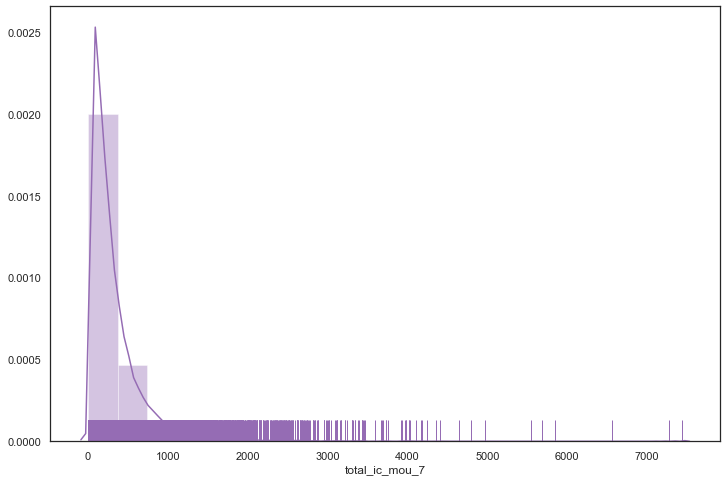

count    30001.000000
mean       279.922931
std        361.175175
min          0.000000
25%         61.360000
50%        173.110000
75%        361.730000
max       6066.630000
Name: total_ic_mou_8, dtype: float64


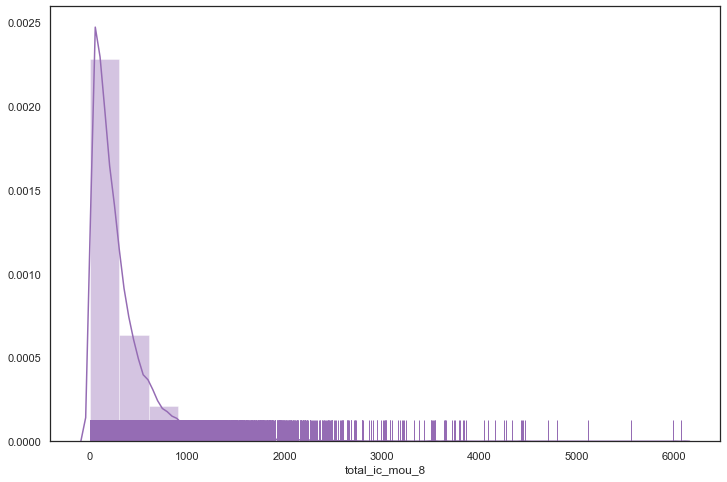

count    30001.00000
mean        -1.16686
std          9.03754
min        -67.59948
25%          0.00000
50%          0.00000
75%          0.00000
max         19.76000
Name: spl_ic_mou_6, dtype: float64


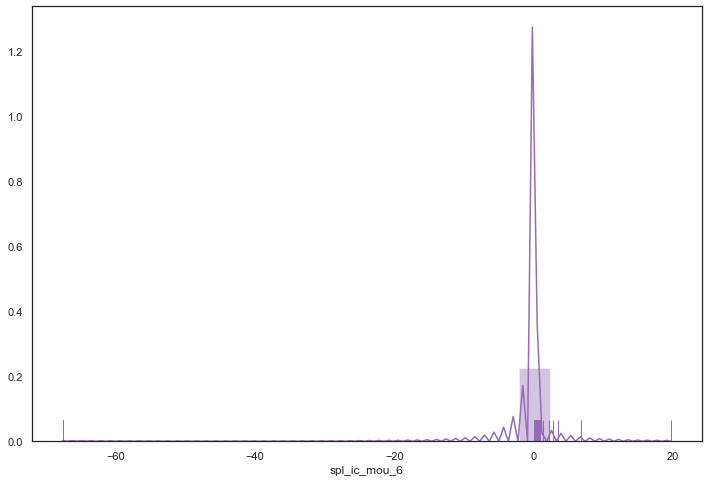

count    30001.000000
mean        -1.134528
std          8.554910
min        -64.490448
25%          0.000000
50%          0.000000
75%          0.000000
max         21.330000
Name: spl_ic_mou_7, dtype: float64


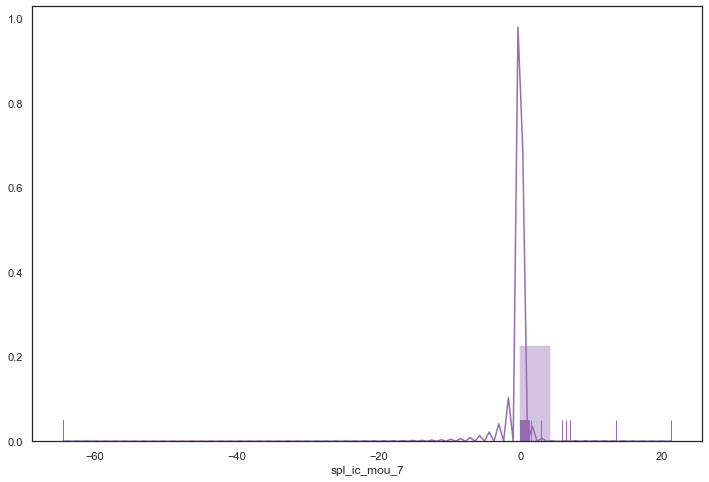

count    30001.000000
mean        -2.450460
std         12.280356
min        -63.302094
25%          0.000000
50%          0.000000
75%          0.000000
max          6.230000
Name: spl_ic_mou_8, dtype: float64


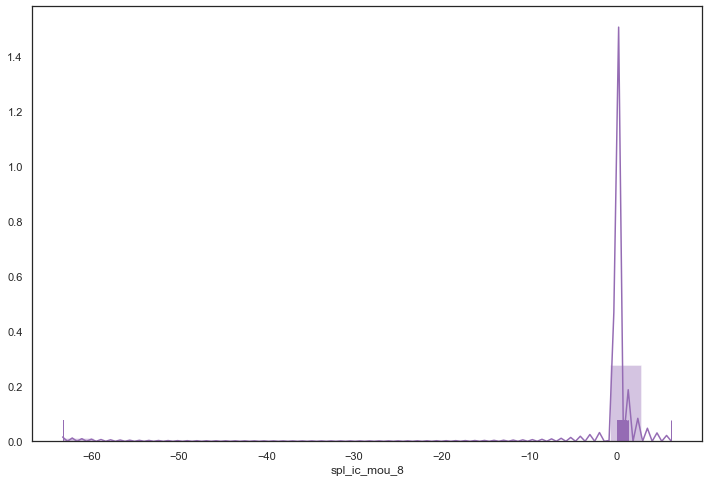

count    30001.000000
mean        10.913131
std         76.717053
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       6789.410000
Name: isd_ic_mou_6, dtype: float64


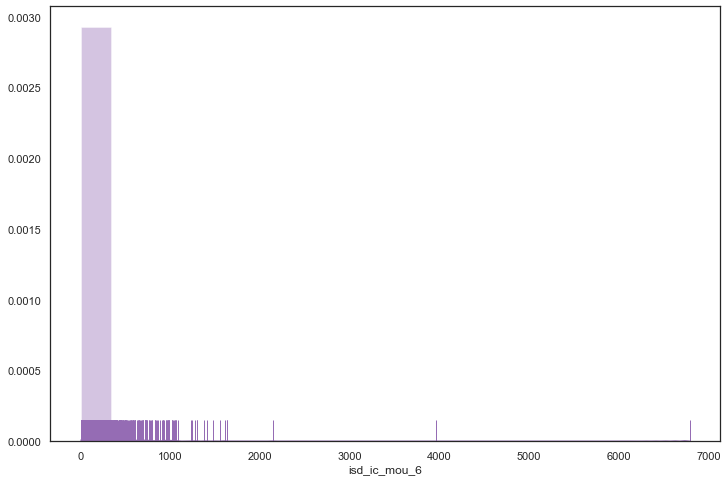

count    30001.000000
mean        12.008349
std         80.165689
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4747.910000
Name: isd_ic_mou_7, dtype: float64


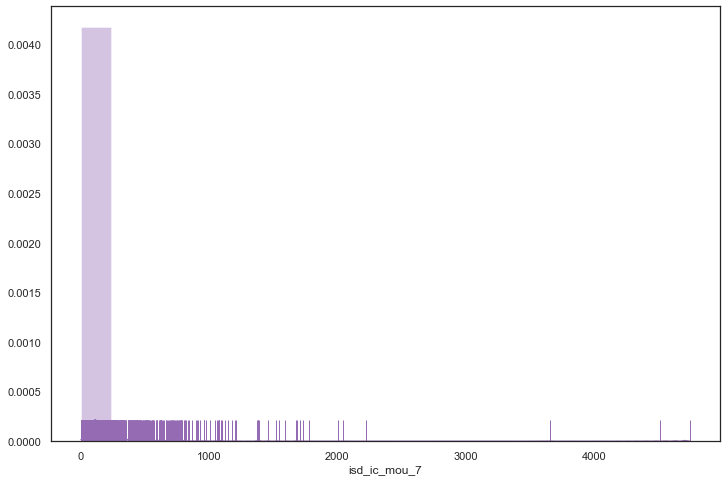

count    30001.000000
mean        11.285813
std         70.570212
min          0.000000
25%          0.000000
50%          0.000000
75%          0.030000
max       3432.880000
Name: isd_ic_mou_8, dtype: float64


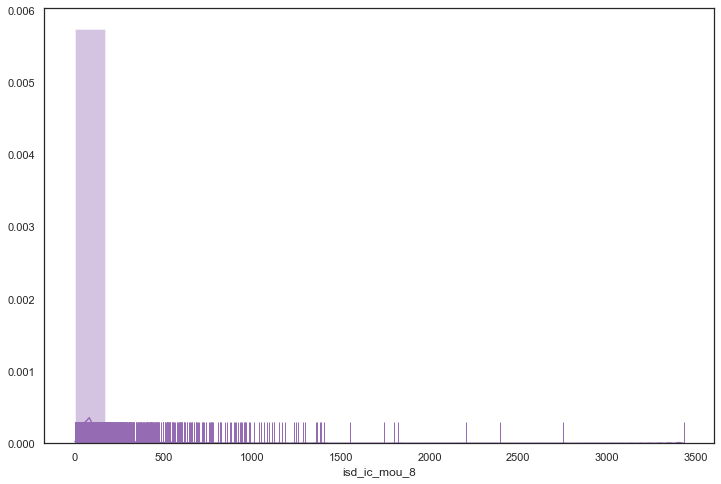

count    30001.000000
mean         1.168955
std         13.985120
min          0.000000
25%          0.000000
50%          0.000000
75%          0.100000
max       1344.140000
Name: ic_others_6, dtype: float64


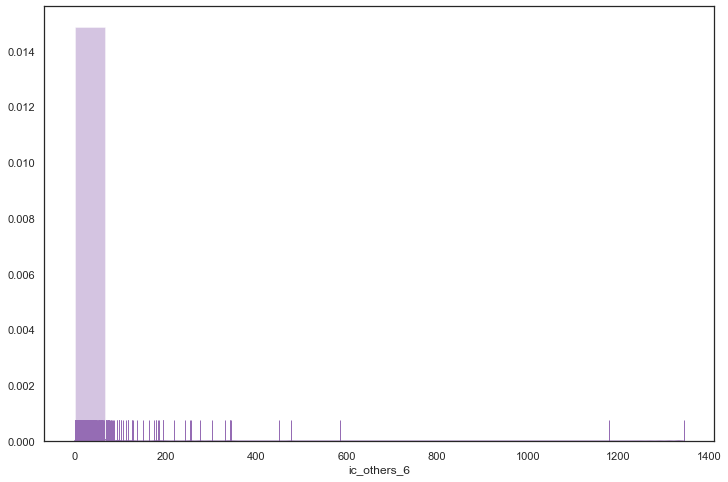

count    30001.000000
mean         1.518458
std         15.996170
min          0.000000
25%          0.000000
50%          0.000000
75%          0.050000
max       1495.940000
Name: ic_others_7, dtype: float64


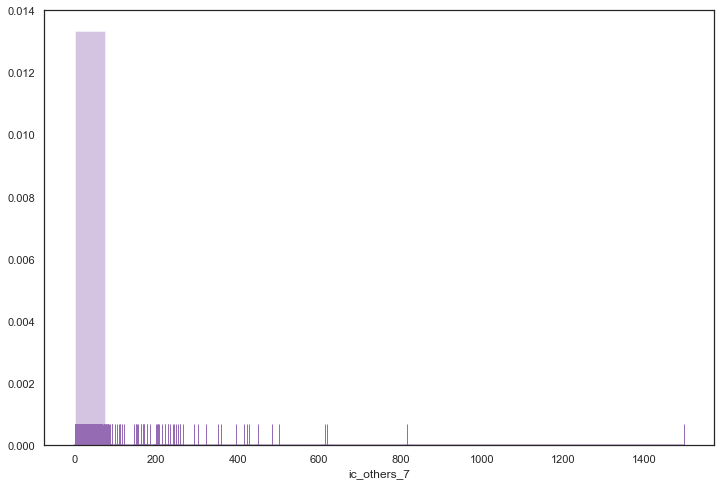

count    30001.000000
mean         1.262484
std         12.780984
min          0.000000
25%          0.000000
50%          0.000000
75%          0.130000
max       1209.860000
Name: ic_others_8, dtype: float64


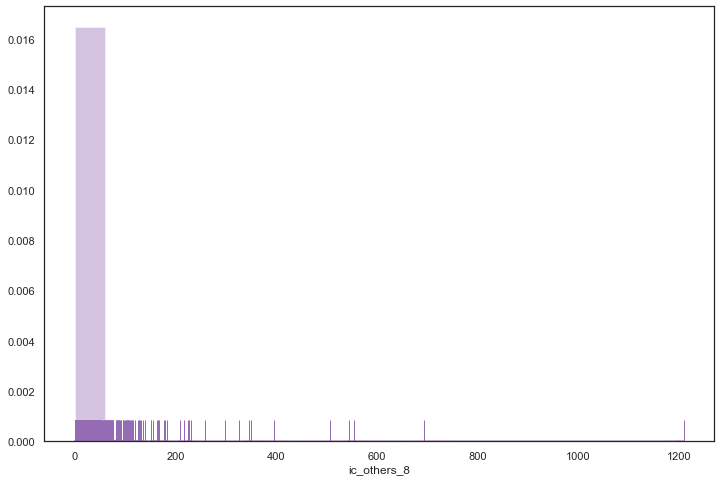

count    30001.000000
mean        11.851005
std          9.429132
min          0.000000
25%          6.000000
50%          9.000000
75%         15.000000
max        307.000000
Name: total_rech_num_6, dtype: float64


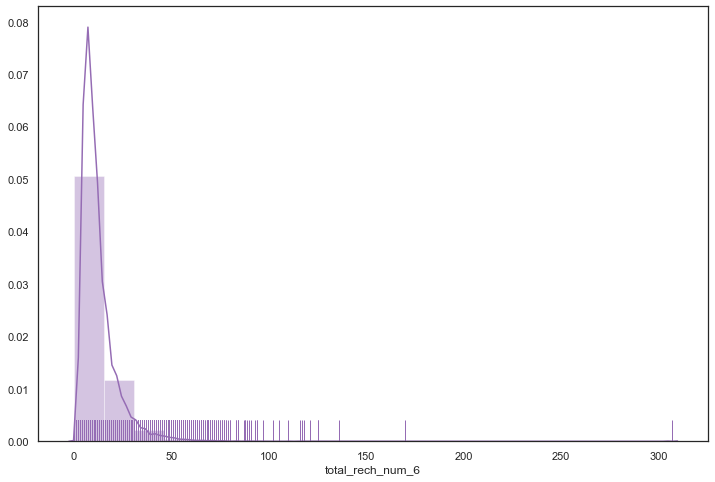

count    30001.000000
mean        11.718843
std          9.432418
min          0.000000
25%          6.000000
50%          9.000000
75%         15.000000
max        138.000000
Name: total_rech_num_7, dtype: float64


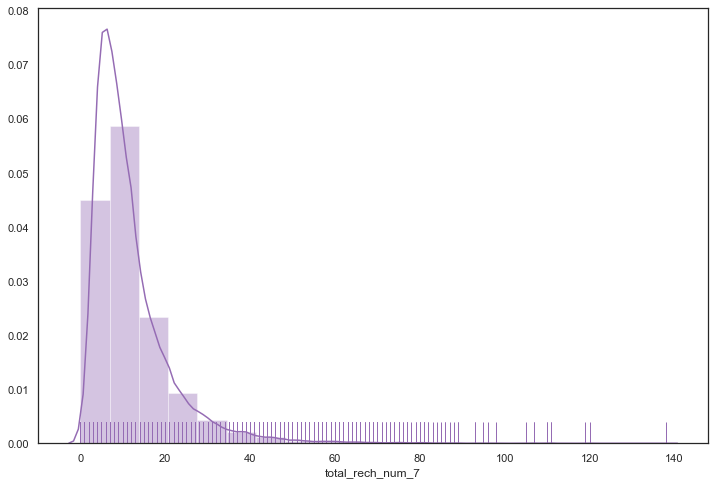

count    30001.000000
mean         9.972868
std          9.274370
min          0.000000
25%          4.000000
50%          8.000000
75%         13.000000
max        196.000000
Name: total_rech_num_8, dtype: float64


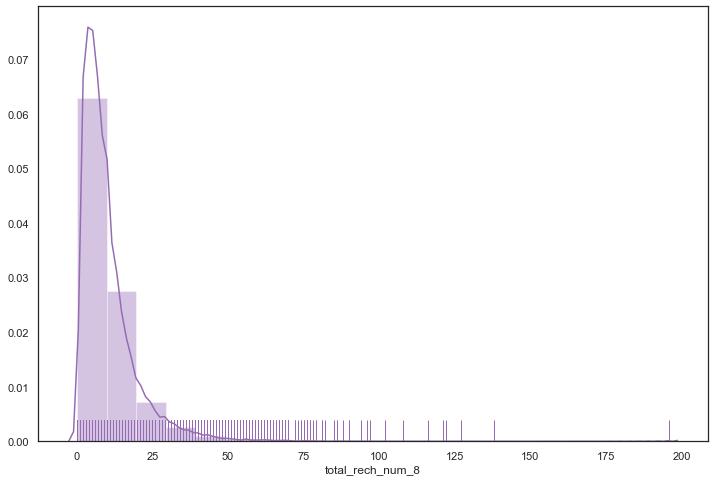

count    30001.000000
mean       660.732342
std        561.032865
min          0.000000
25%        360.000000
50%        566.000000
75%        834.000000
max      35190.000000
Name: total_rech_amt_6, dtype: float64


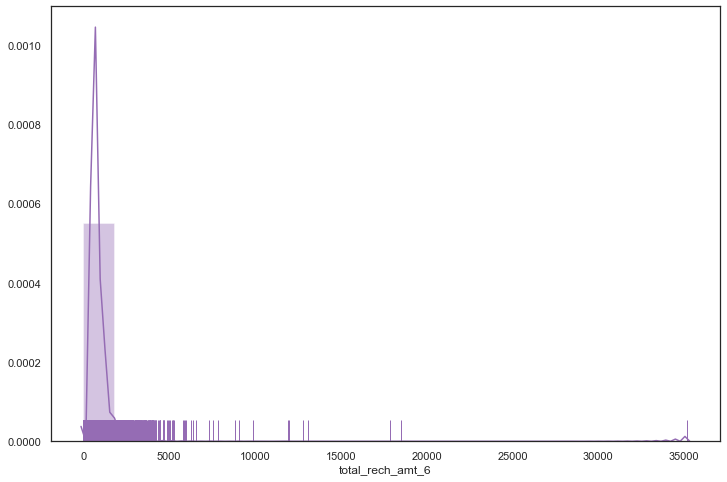

count    30001.000000
mean       660.498017
std        582.430876
min          0.000000
25%        352.000000
50%        562.000000
75%        831.000000
max      40335.000000
Name: total_rech_amt_7, dtype: float64


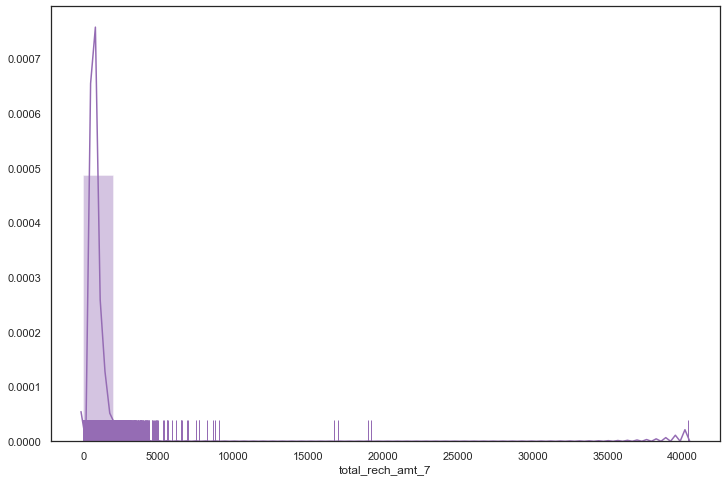

count    30001.000000
mean       584.365454
std        611.245907
min          0.000000
25%        250.000000
50%        490.000000
75%        776.000000
max      45320.000000
Name: total_rech_amt_8, dtype: float64


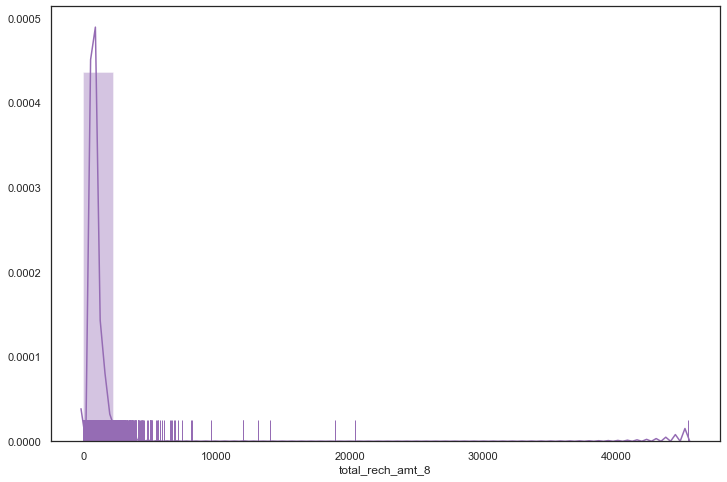

count    30001.000000
mean       169.284824
std        175.315958
min          0.000000
25%        110.000000
50%        120.000000
75%        200.000000
max       4010.000000
Name: max_rech_amt_6, dtype: float64


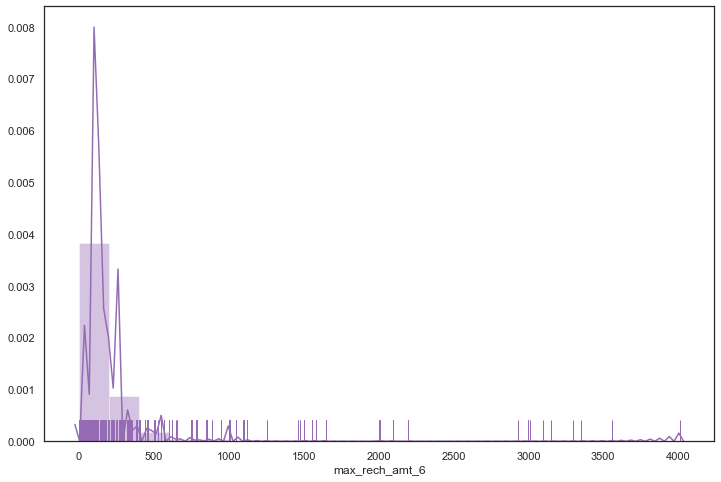

count    30001.000000
mean       172.201727
std        181.390742
min          0.000000
25%        110.000000
50%        128.000000
75%        200.000000
max       4010.000000
Name: max_rech_amt_7, dtype: float64


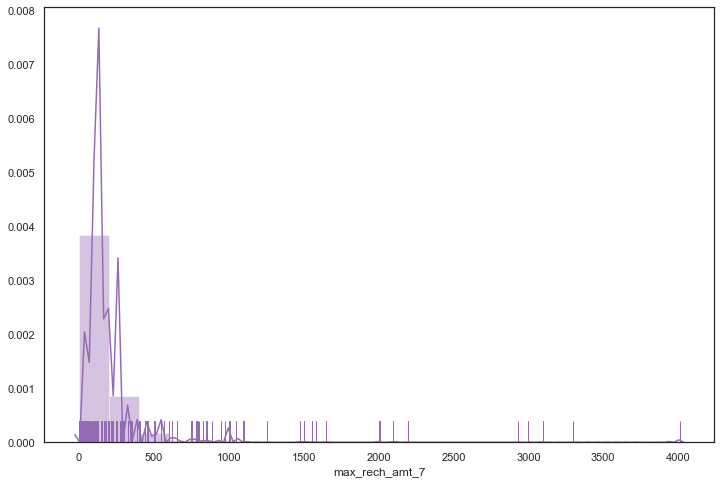

count    30001.000000
mean       160.144462
std        173.207799
min          0.000000
25%         50.000000
50%        130.000000
75%        198.000000
max       4449.000000
Name: max_rech_amt_8, dtype: float64


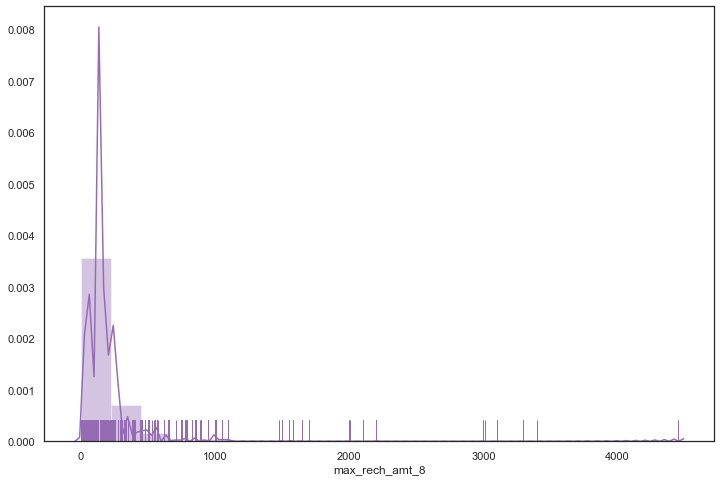

count    30001.000000
mean       100.893604
std        143.737572
min          0.000000
25%         25.000000
50%         67.000000
75%        120.000000
max       4010.000000
Name: last_day_rch_amt_6, dtype: float64


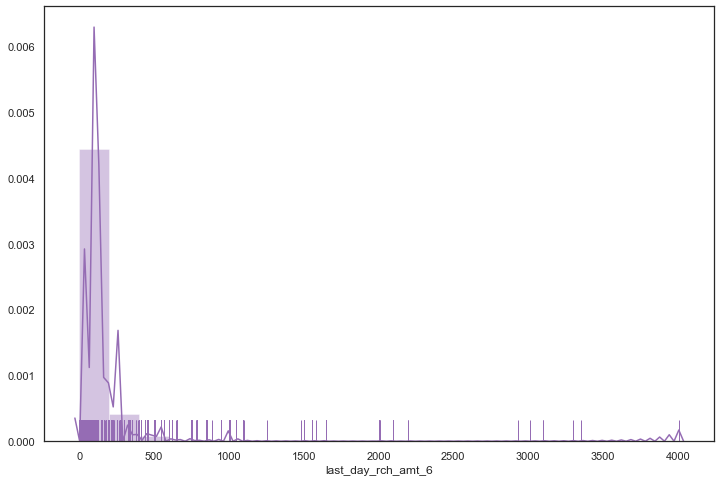

count    30001.000000
mean       100.356021
std        140.925669
min          0.000000
25%         20.000000
50%         50.000000
75%        130.000000
max       4010.000000
Name: last_day_rch_amt_7, dtype: float64


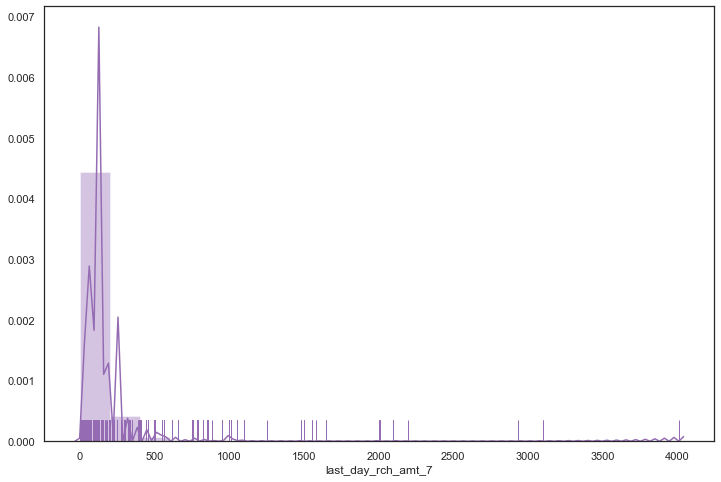

count    30001.000000
mean        92.393654
std        145.182324
min          0.000000
25%          0.000000
50%         50.000000
75%        130.000000
max       4449.000000
Name: last_day_rch_amt_8, dtype: float64


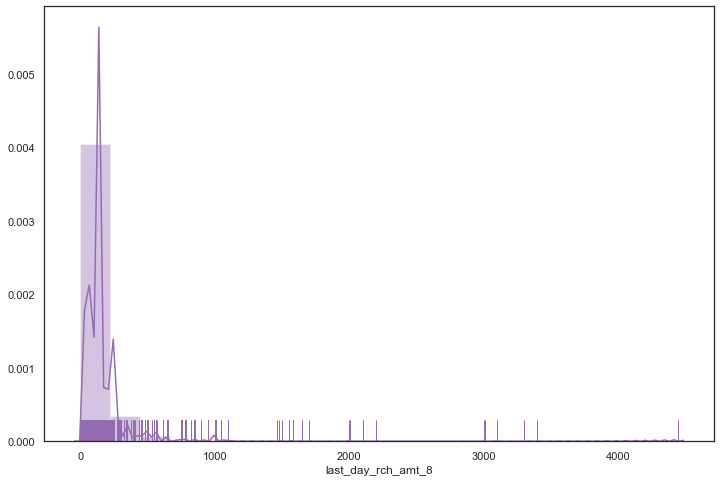

count    30001.000000
mean         1.667711
std          2.831233
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         61.000000
Name: total_rech_data_6, dtype: float64


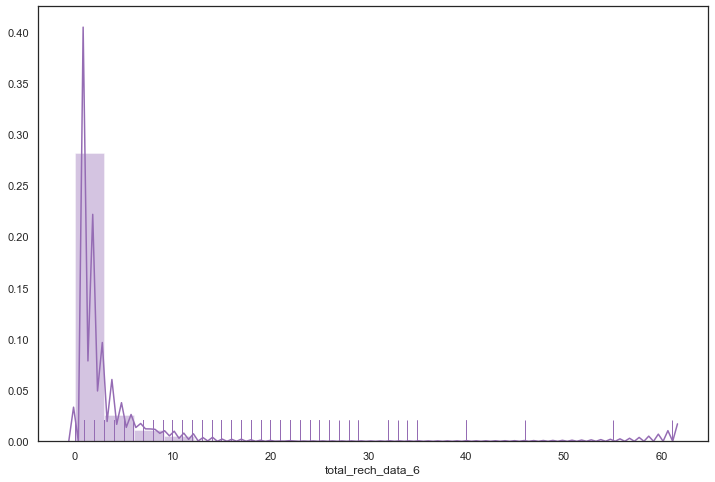

count    30001.000000
mean         1.853805
std          3.091843
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         54.000000
Name: total_rech_data_7, dtype: float64


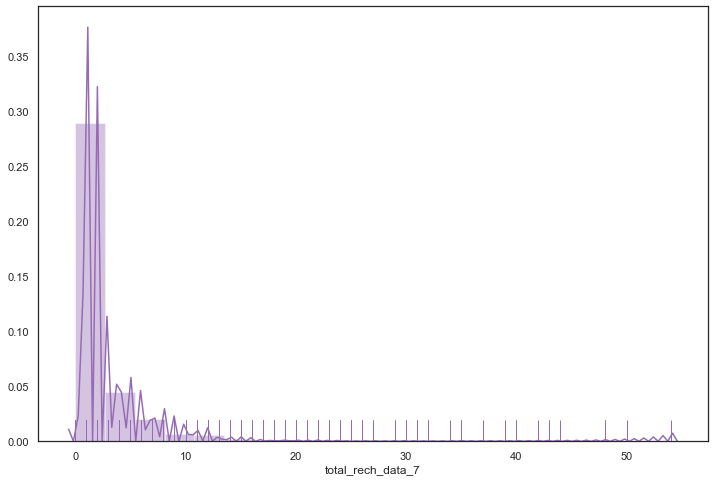

count    30001.000000
mean         1.621913
std          2.996010
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         60.000000
Name: total_rech_data_8, dtype: float64


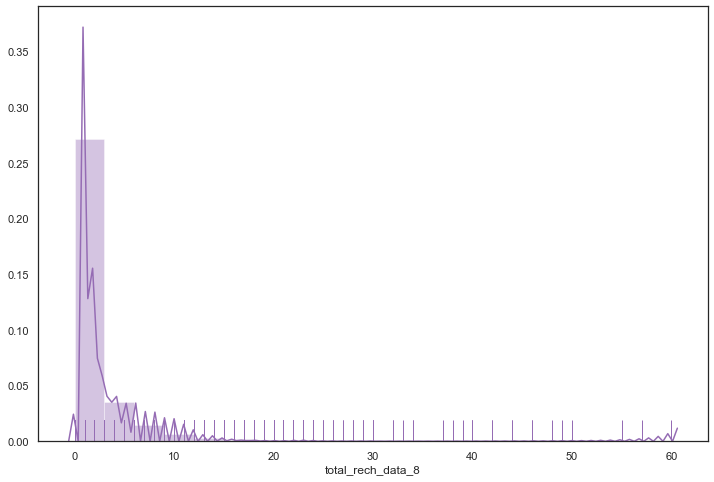

count    30001.000000
mean        78.079564
std        112.731468
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_6, dtype: float64


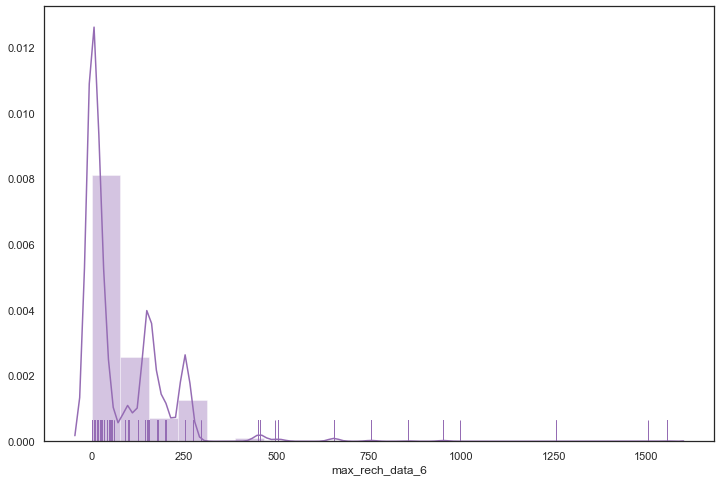

count    30001.000000
mean        79.841805
std        114.273245
min          0.000000
25%          0.000000
50%         25.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_7, dtype: float64


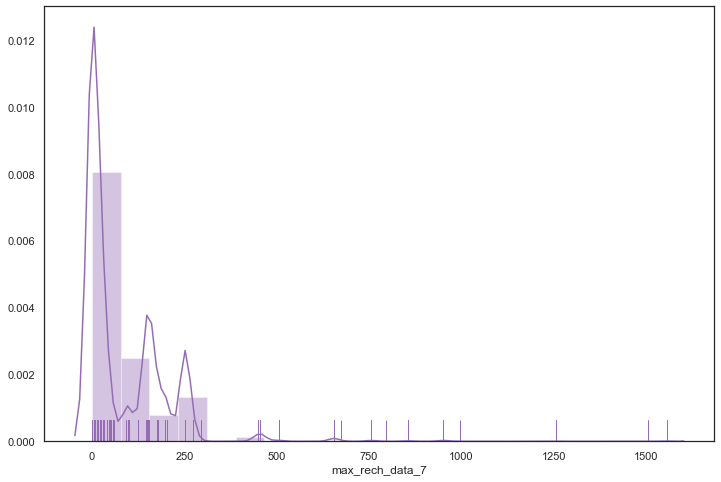

count    30001.000000
mean        72.492917
std        110.567519
min          0.000000
25%          0.000000
50%         23.000000
75%        154.000000
max       1555.000000
Name: max_rech_data_8, dtype: float64


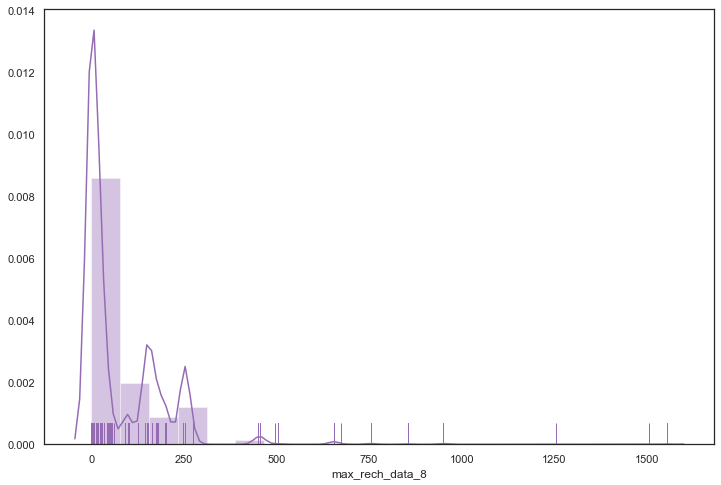

count    30001.000000
mean       130.654329
std        200.328052
min          0.000000
25%          0.000000
50%         50.000000
75%        198.000000
max       7546.000000
Name: av_rech_amt_data_6, dtype: float64


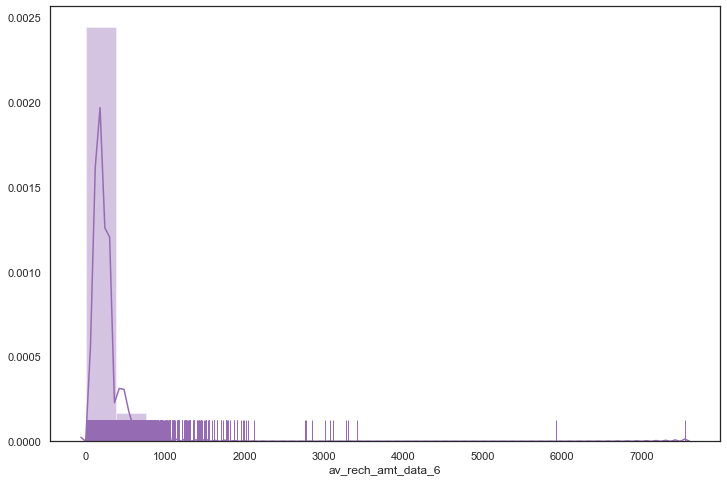

count    30001.000000
mean       139.781778
std        206.808748
min          0.000000
25%          0.000000
50%         69.000000
75%        210.000000
max       4365.000000
Name: av_rech_amt_data_7, dtype: float64


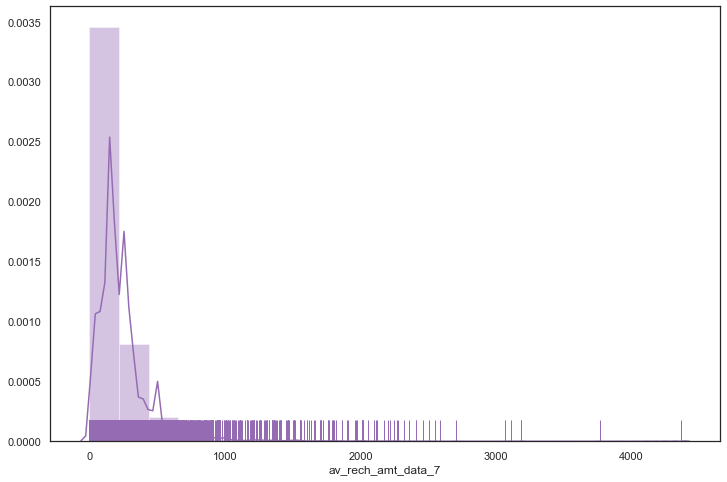

count    30001.000000
mean       122.132258
std        195.586944
min          0.000000
25%          0.000000
50%         25.000000
75%        196.000000
max       4061.000000
Name: av_rech_amt_data_8, dtype: float64


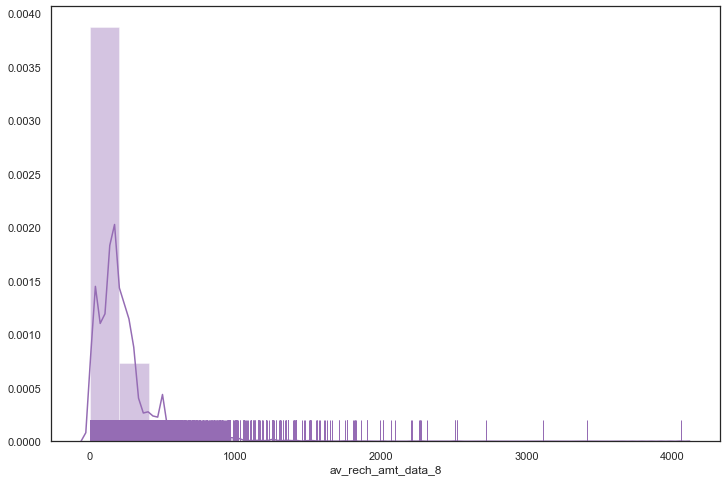

count    30001.000000
mean       126.522185
std        330.530793
min          0.000000
25%          0.000000
50%          0.000000
75%         83.450000
max      10285.900000
Name: vol_2g_mb_6, dtype: float64


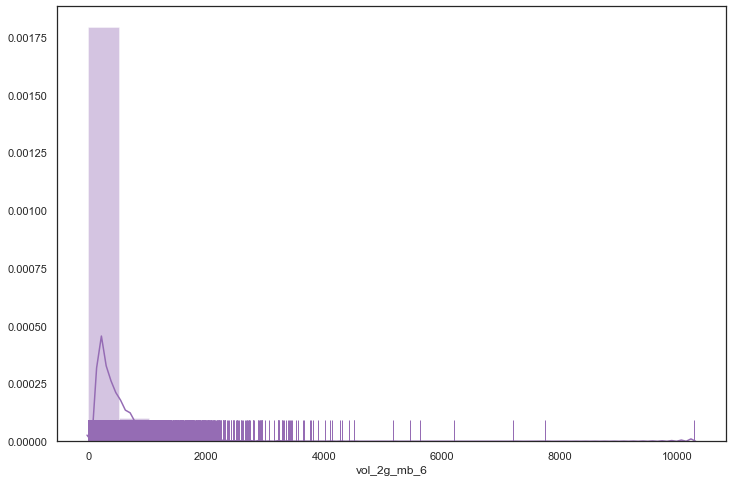

count    30001.000000
mean       125.097326
std        331.548010
min          0.000000
25%          0.000000
50%          0.050000
75%         77.770000
max       7873.550000
Name: vol_2g_mb_7, dtype: float64


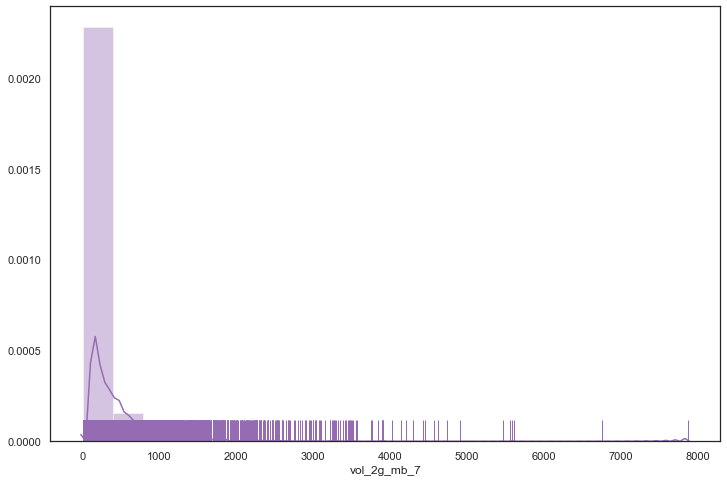

count    30001.000000
mean       105.913072
std        313.384838
min          0.000000
25%          0.000000
50%          0.000000
75%         51.650000
max      11117.610000
Name: vol_2g_mb_8, dtype: float64


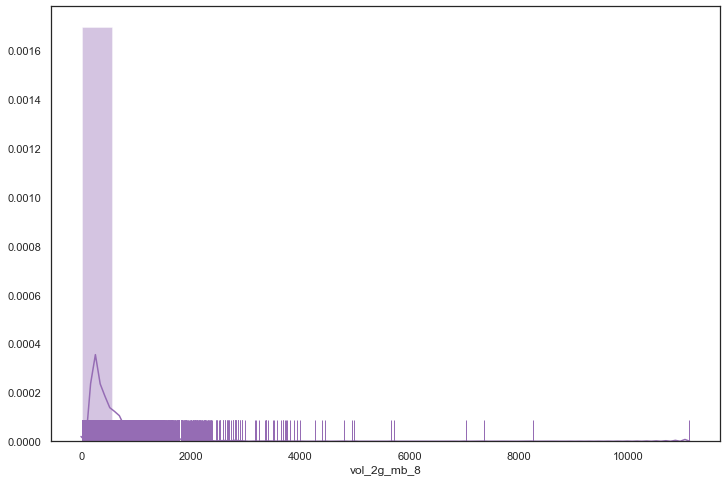

count    30001.000000
mean       344.258568
std        913.747778
min          0.000000
25%          0.000000
50%          0.000000
75%        358.740000
max      45735.400000
Name: vol_3g_mb_6, dtype: float64


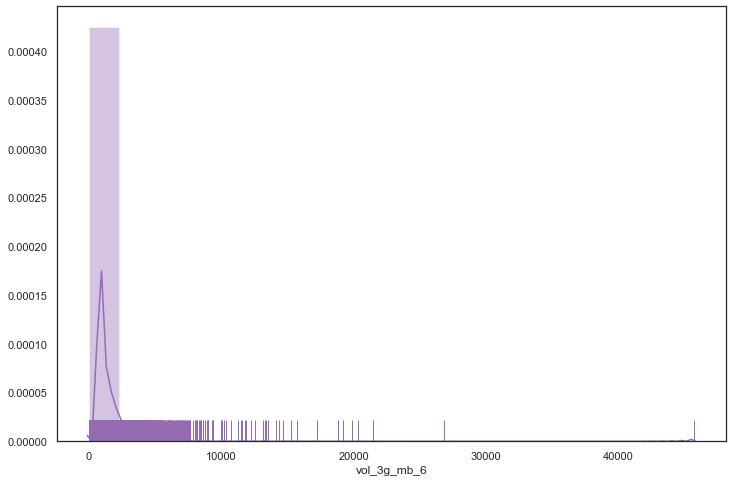

count    30001.000000
mean       370.196701
std        915.525911
min          0.000000
25%          0.000000
50%          0.000000
75%        410.700000
max      28144.120000
Name: vol_3g_mb_7, dtype: float64


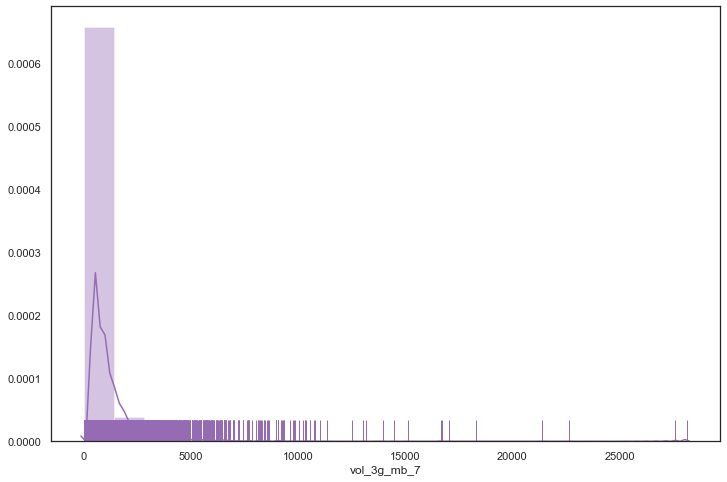

count    30001.000000
mean       351.493998
std        919.021056
min          0.000000
25%          0.000000
50%          0.000000
75%        356.190000
max      30036.060000
Name: vol_3g_mb_8, dtype: float64


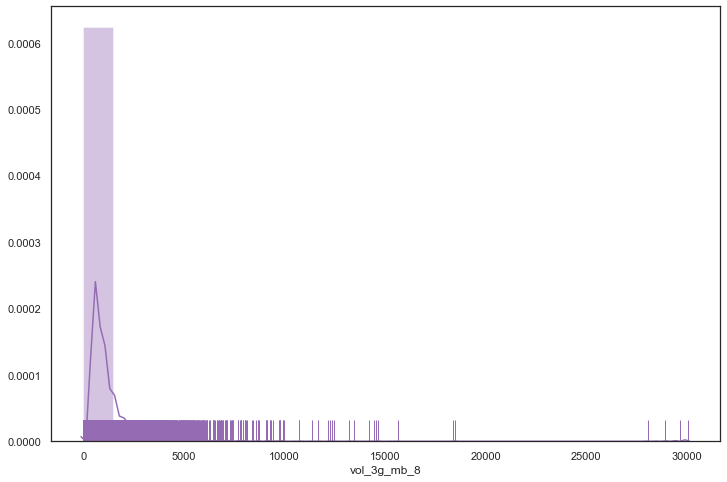

count    30001.000000
mean        -0.427919
std          0.521484
min         -1.000000
25%         -1.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_6, dtype: float64


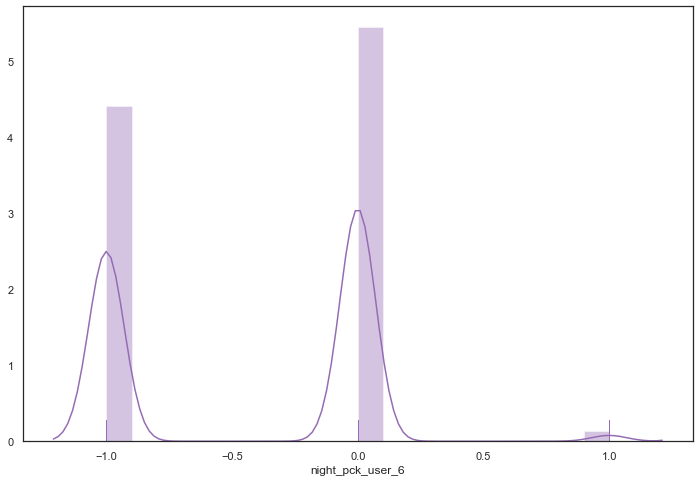

count    30001.000000
mean        -0.418953
std          0.518111
min         -1.000000
25%         -1.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_7, dtype: float64


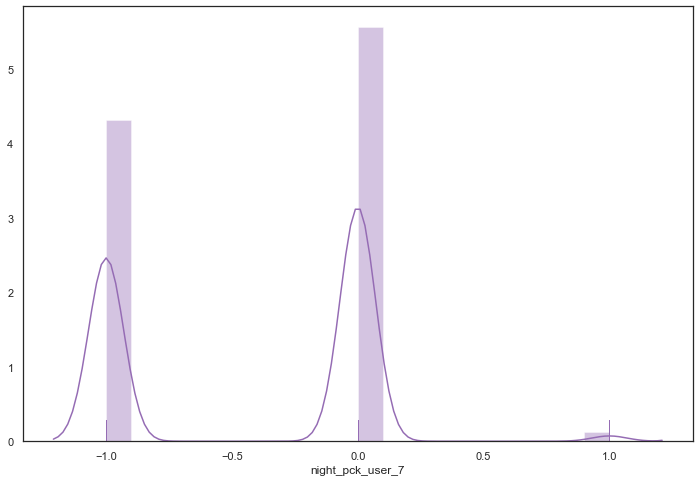

count    30001.000000
mean        -0.456885
std          0.520464
min         -1.000000
25%         -1.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_8, dtype: float64


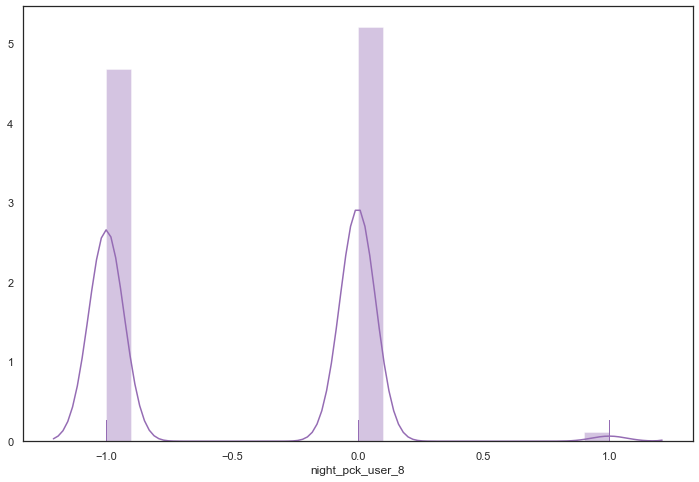

count    30001.000000
mean         0.174494
std          0.434953
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: monthly_2g_6, dtype: float64


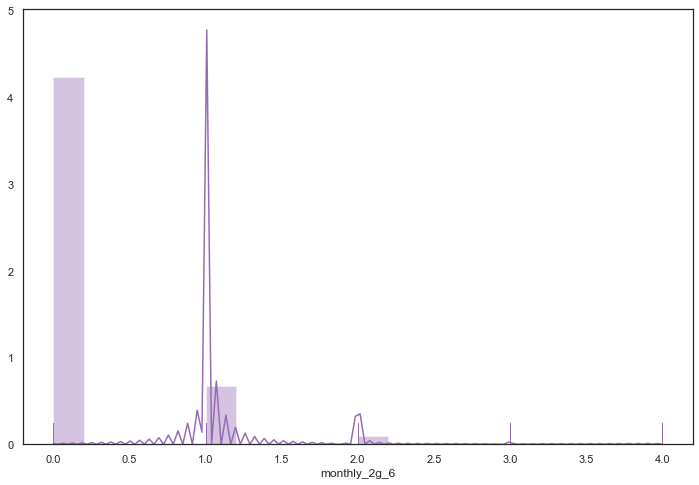

count    30001.000000
mean         0.183261
std          0.450423
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: monthly_2g_7, dtype: float64


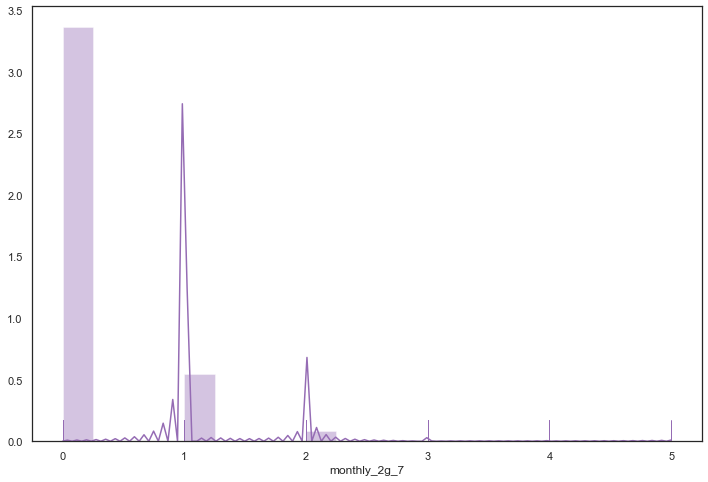

count    30001.000000
mean         0.153628
std          0.406486
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: monthly_2g_8, dtype: float64


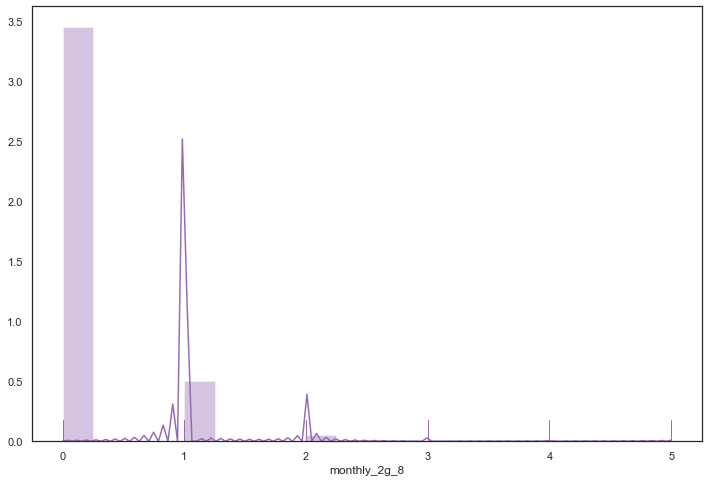

count    30001.000000
mean         1.066064
std          2.507197
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         42.000000
Name: sachet_2g_6, dtype: float64


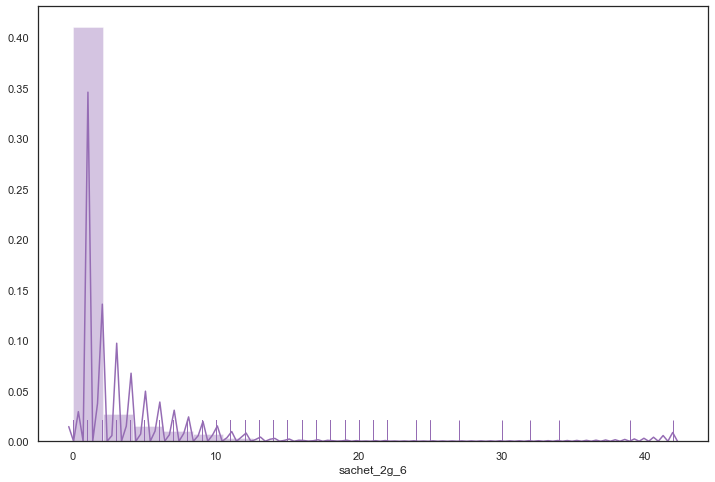

count    30001.000000
mean         1.214026
std          2.736158
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         48.000000
Name: sachet_2g_7, dtype: float64


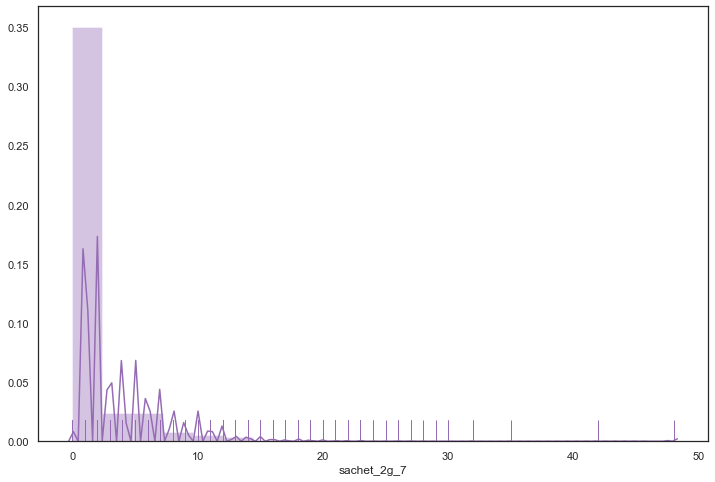

count    30001.000000
mean         1.054865
std          2.535940
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         44.000000
Name: sachet_2g_8, dtype: float64


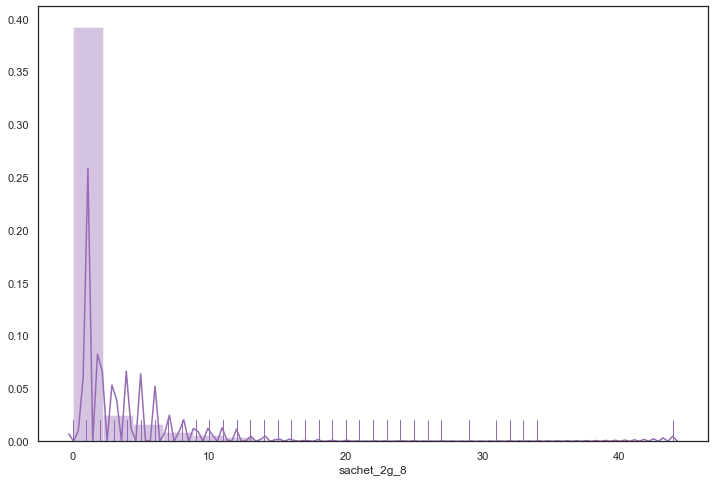

count    30001.000000
mean         0.217759
std          0.613199
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         14.000000
Name: monthly_3g_6, dtype: float64


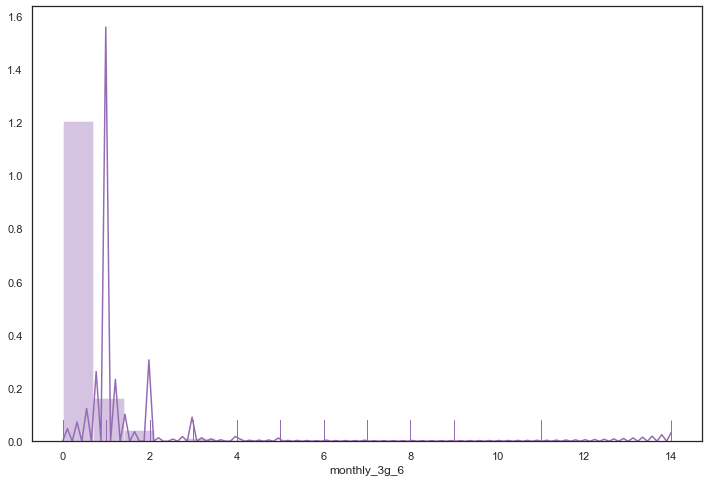

count    30001.000000
mean         0.229026
std          0.659125
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         16.000000
Name: monthly_3g_7, dtype: float64


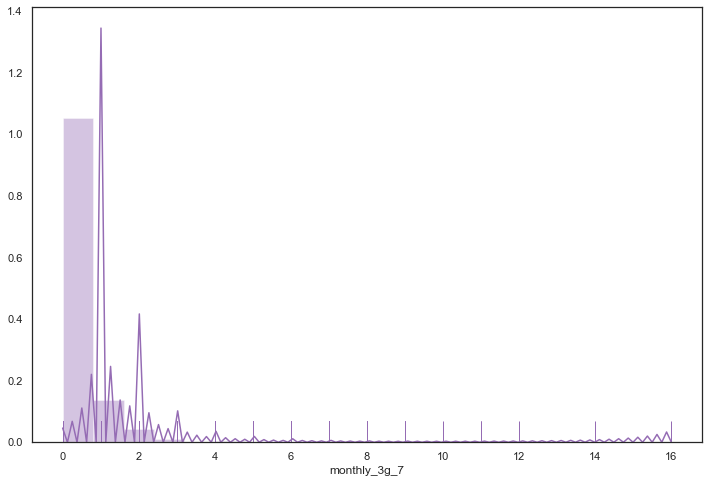

count    30001.000000
mean         0.211026
std          0.617549
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         16.000000
Name: monthly_3g_8, dtype: float64


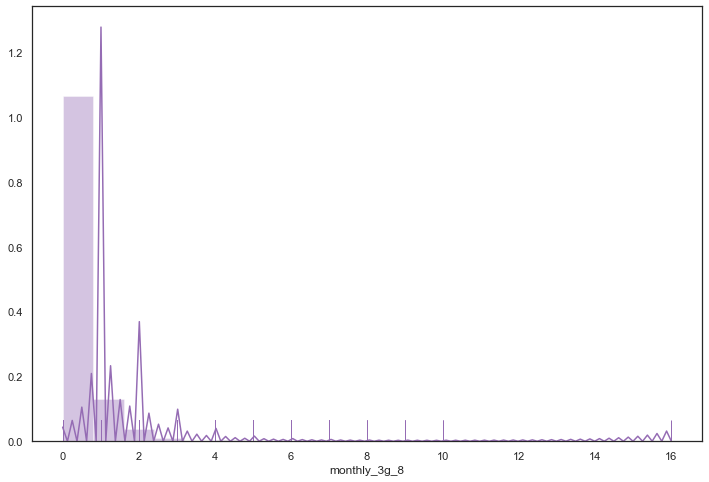

count    30001.000000
mean         0.209393
std          0.985674
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         29.000000
Name: sachet_3g_6, dtype: float64


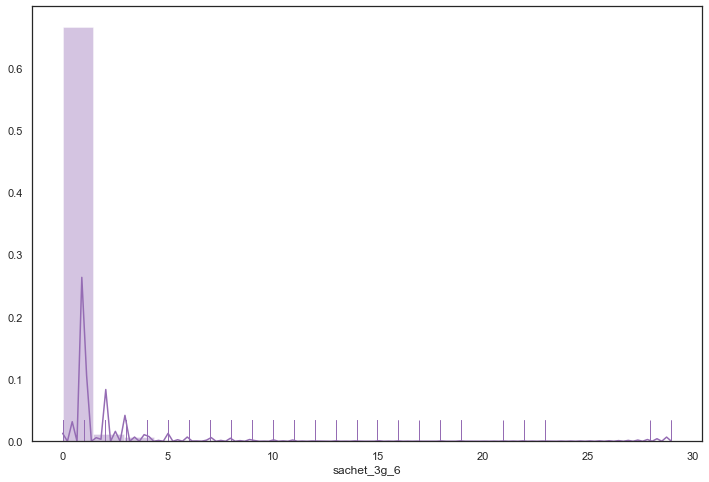

count    30001.000000
mean         0.227492
std          1.089929
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         35.000000
Name: sachet_3g_7, dtype: float64


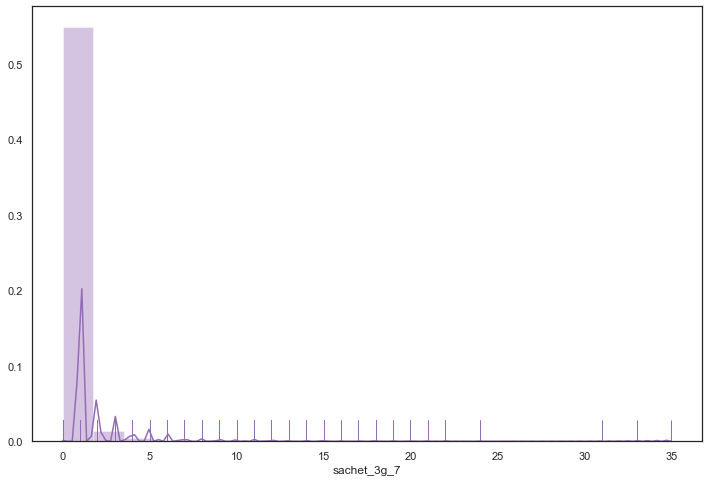

count    30001.000000
mean         0.202393
std          1.100107
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         41.000000
Name: sachet_3g_8, dtype: float64


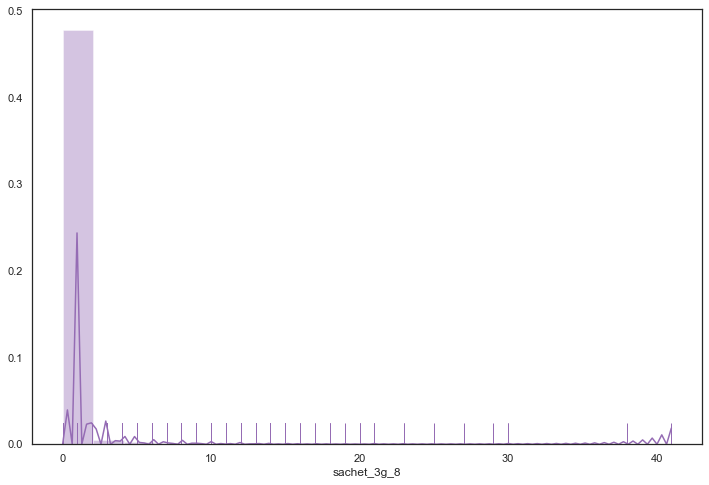

count    30001.000000
mean         0.075997
std          0.976332
min         -1.000000
25%         -1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: fb_user_6, dtype: float64


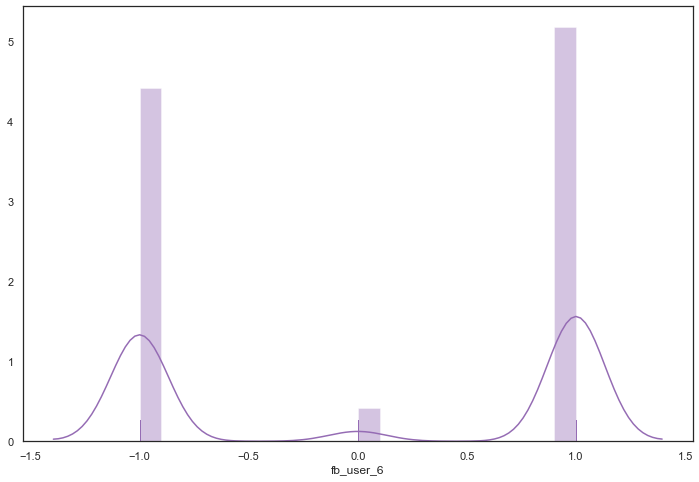

count    30001.000000
mean         0.092597
std          0.973118
min         -1.000000
25%         -1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: fb_user_7, dtype: float64


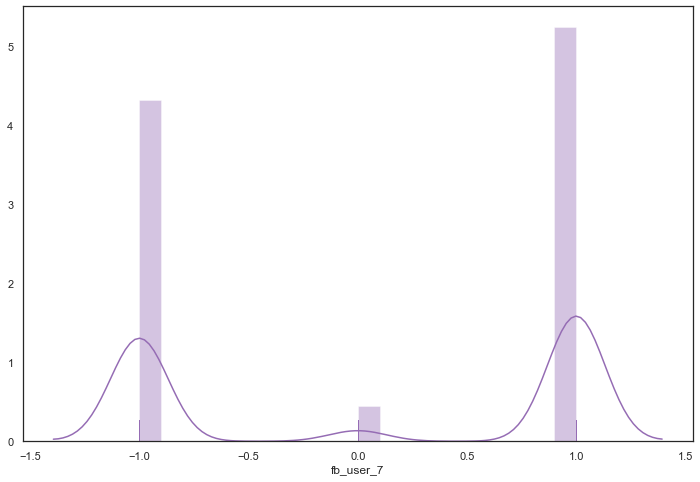

count    30001.000000
mean         0.008833
std          0.972260
min         -1.000000
25%         -1.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: fb_user_8, dtype: float64


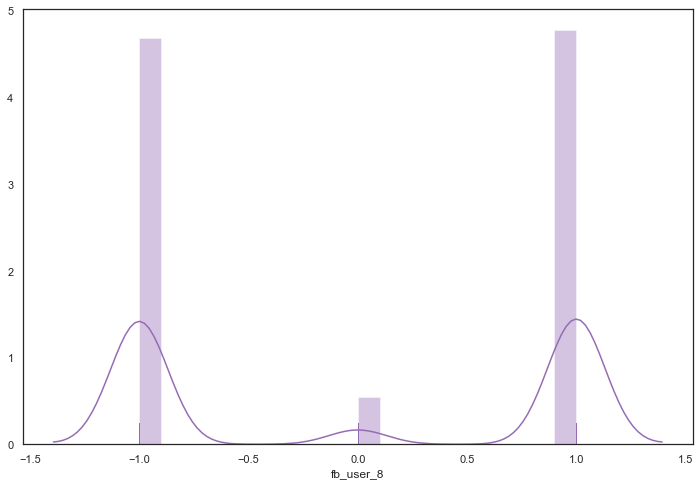

count    30001.000000
mean      1209.368754
std        957.677989
min        180.000000
25%        460.000000
50%        846.000000
75%       1756.000000
max       4321.000000
Name: aon, dtype: float64


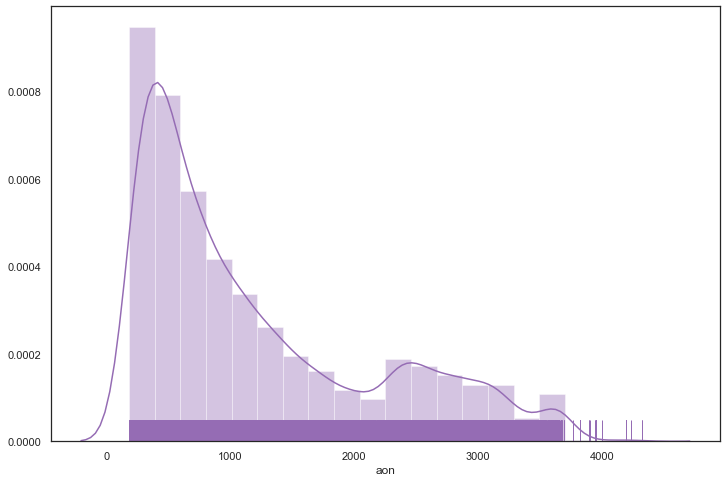

count    30001.000000
mean       169.138860
std        420.974354
min          0.000000
25%          0.000000
50%          0.000000
75%        128.800000
max      12916.220000
Name: aug_vbc_3g, dtype: float64


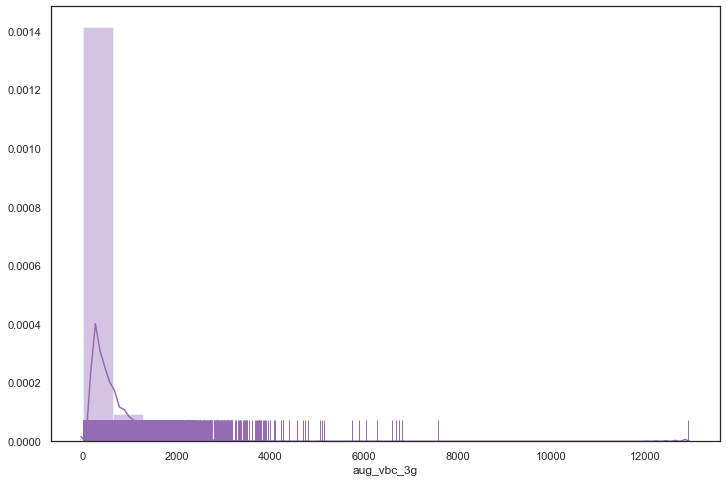

count    30001.000000
mean       178.872765
std        443.544138
min          0.000000
25%          0.000000
50%          0.000000
75%        137.290000
max       9165.600000
Name: jul_vbc_3g, dtype: float64


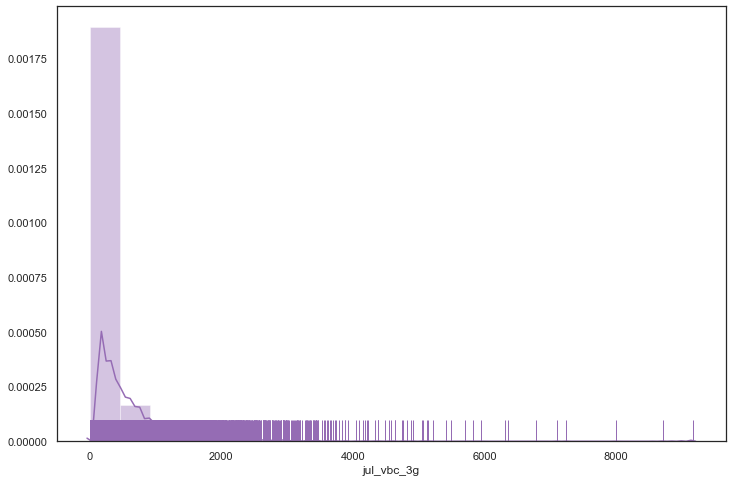

count    30001.000000
mean       158.523962
std        416.734860
min          0.000000
25%          0.000000
50%          0.000000
75%         98.440000
max      11166.210000
Name: jun_vbc_3g, dtype: float64


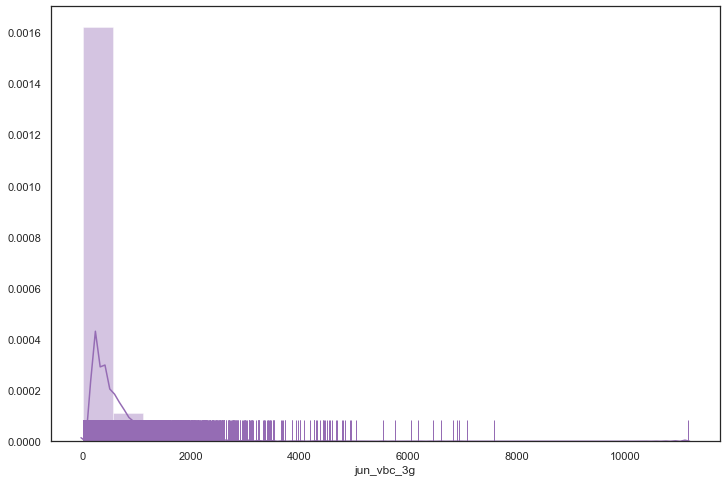

count    30001.000000
mean         8.029788
std         52.378232
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2618.570000
Name: sep_vbc_3g, dtype: float64


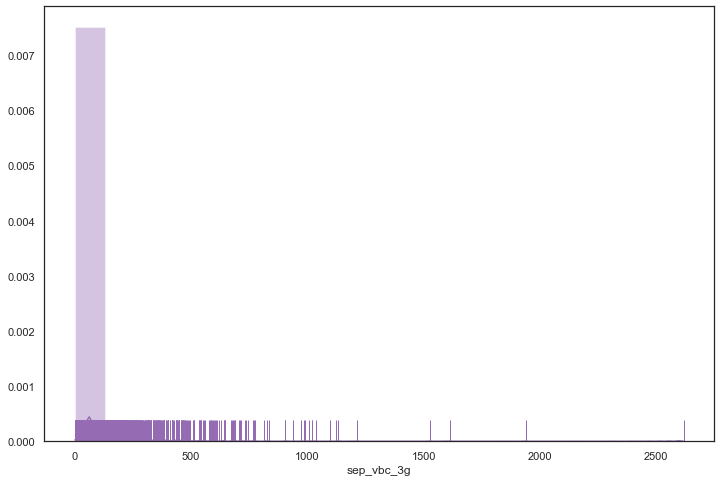

count     30001
unique        2
top           0
freq      27560
Name: churn, dtype: int64


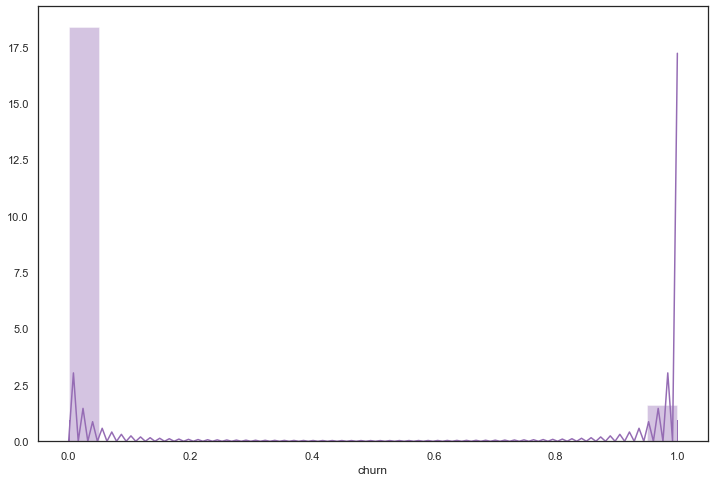

count    30001.000000
mean       -51.038557
std        334.872321
min      -5811.052500
25%       -180.179500
50%        -40.754500
75%         83.239000
max      12808.617000
Name: arpu_diff, dtype: float64


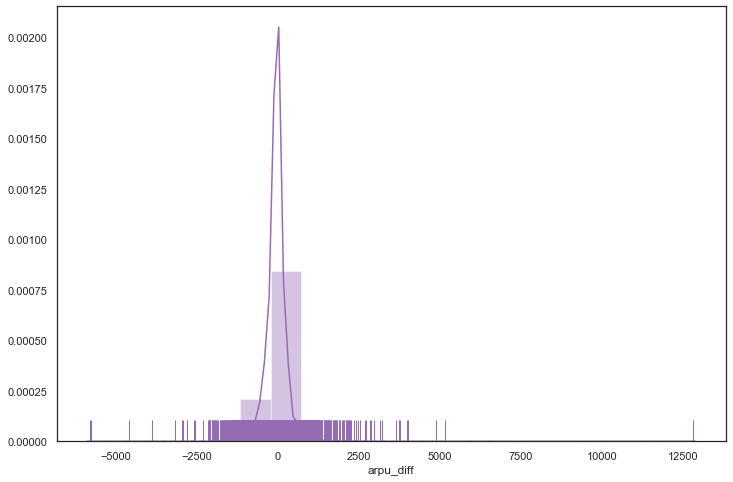

count    30001.000000
mean       -31.761887
std        310.467082
min      -5295.315000
25%        -58.430000
50%         -3.850000
75%         20.060000
max       6359.920000
Name: onnet_mou_diff, dtype: float64


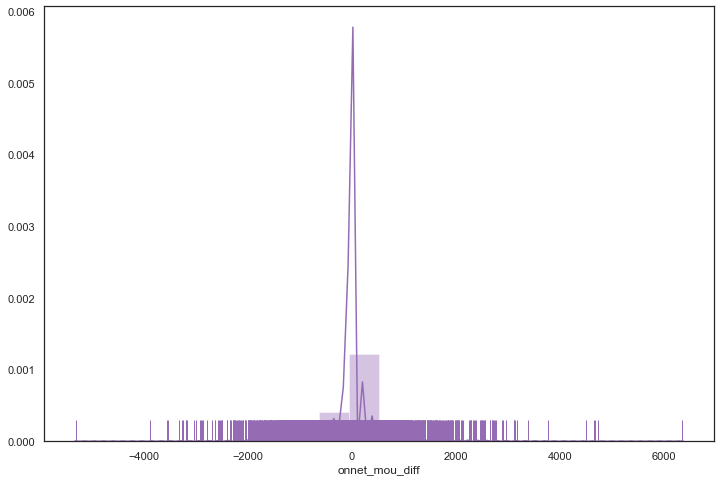

count    30001.000000
mean       -37.915419
std        346.847571
min      -7094.390000
25%        -99.120000
50%        -10.535158
75%         46.125000
max      12604.240000
Name: offnet_mou_diff, dtype: float64


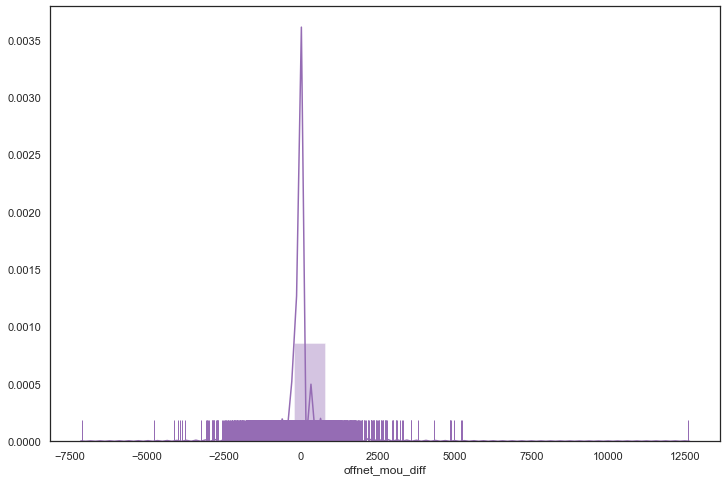

count    30001.000000
mean        -1.173296
std         65.274611
min      -1296.985000
25%          0.000000
50%          0.000000
75%          0.000000
max       2330.200000
Name: roam_ic_mou_diff, dtype: float64


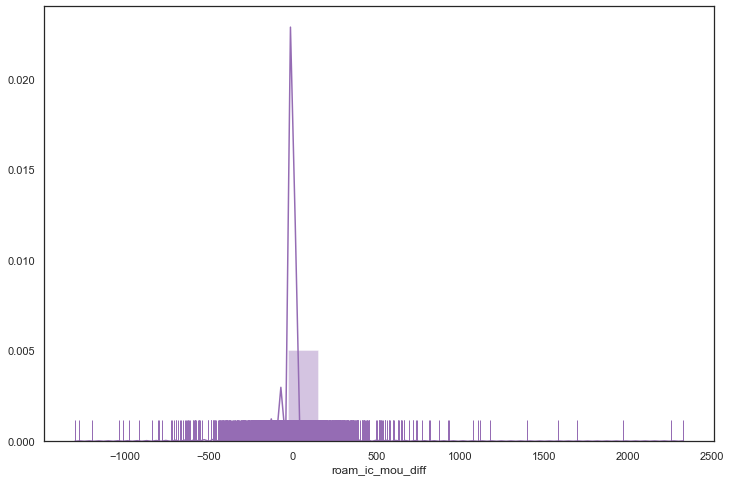

count    30001.000000
mean        -1.923576
std         94.202411
min      -2410.835000
25%          0.000000
50%          0.000000
75%          0.000000
max       3057.150000
Name: roam_og_mou_diff, dtype: float64


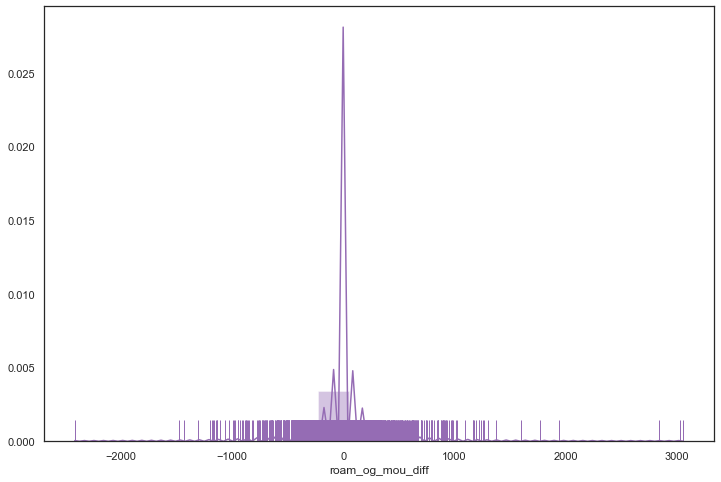

count    30001.000000
mean       -19.638217
std        214.219557
min      -3867.830000
25%        -59.810000
50%         -7.030000
75%         30.165000
max       4619.975000
Name: loc_og_mou_diff, dtype: float64


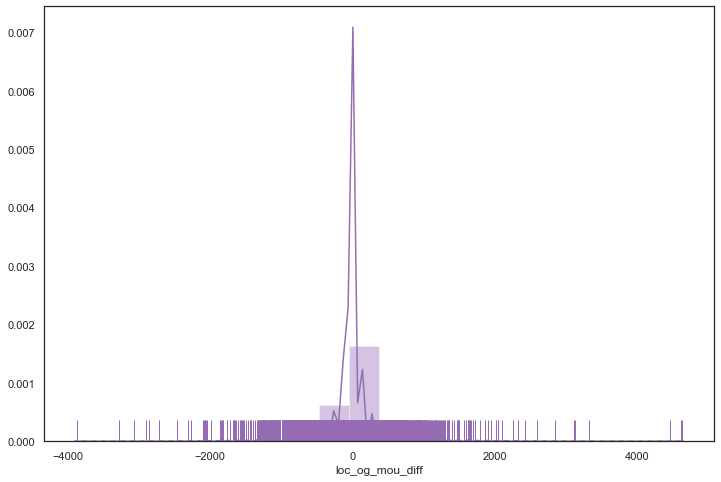

count    30001.000000
mean       -45.514299
std        425.777302
min      -7127.425000
25%        -57.605000
50%         -0.375000
75%         12.010000
max      12715.480000
Name: std_og_mou_diff, dtype: float64


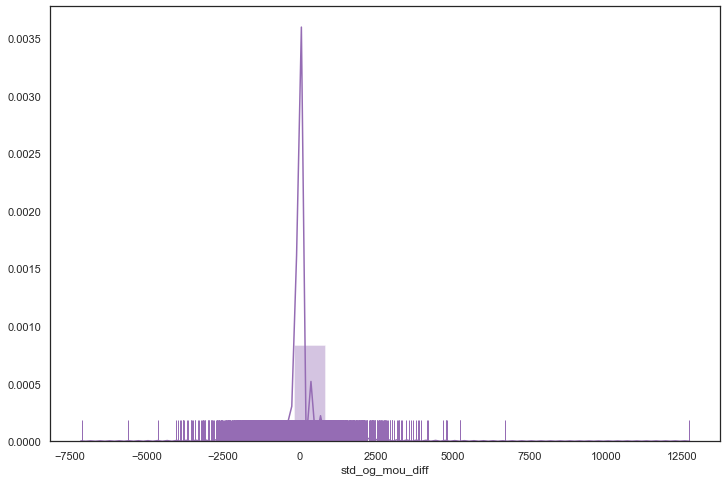

count    30001.000000
mean        -2.196459
std         23.372941
min       -723.524109
25%          0.000000
50%          0.000000
75%          0.000000
max        544.780000
Name: isd_og_mou_diff, dtype: float64


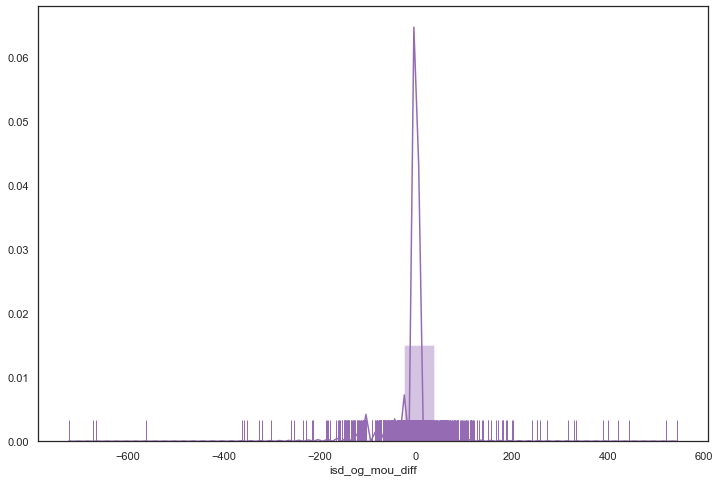

count    30001.000000
mean         0.211292
std         18.054927
min      -1081.910000
25%         -2.685000
50%          0.000000
75%          1.800000
max        747.620000
Name: spl_og_mou_diff, dtype: float64


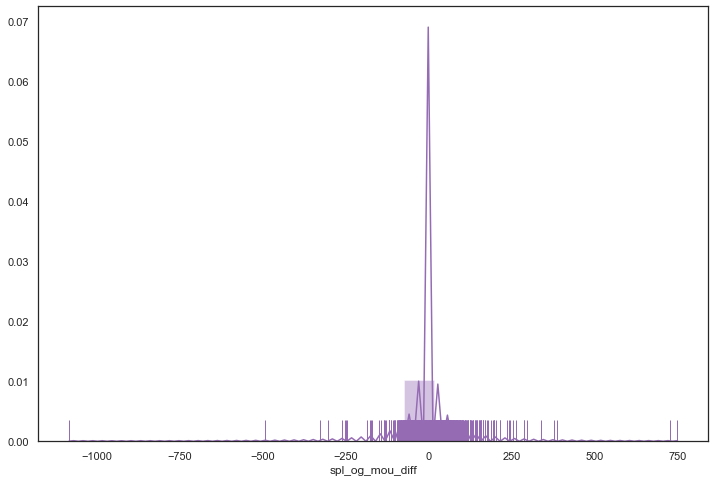

count    30001.000000
mean       -67.437337
std        502.630069
min      -7213.410000
25%       -168.025000
50%        -14.625000
75%         67.915000
max      12768.705000
Name: total_og_mou_diff, dtype: float64


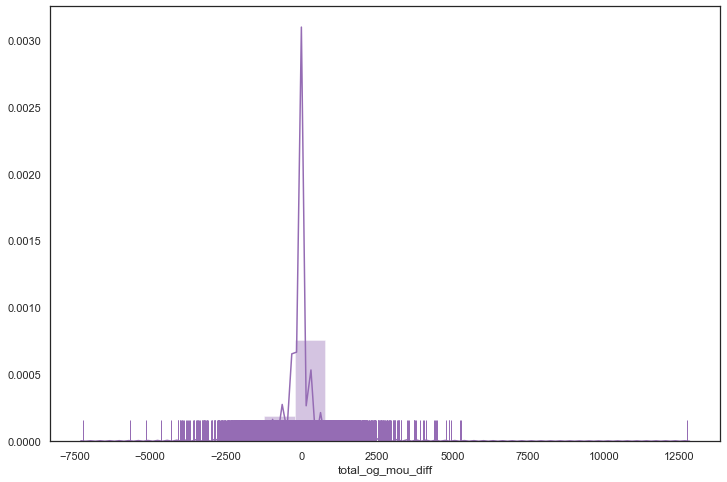

count    30001.000000
mean        -8.342684
std        179.817385
min      -3785.552998
25%        -48.845000
50%         -3.615000
75%         36.075000
max       3485.370000
Name: loc_ic_mou_diff, dtype: float64


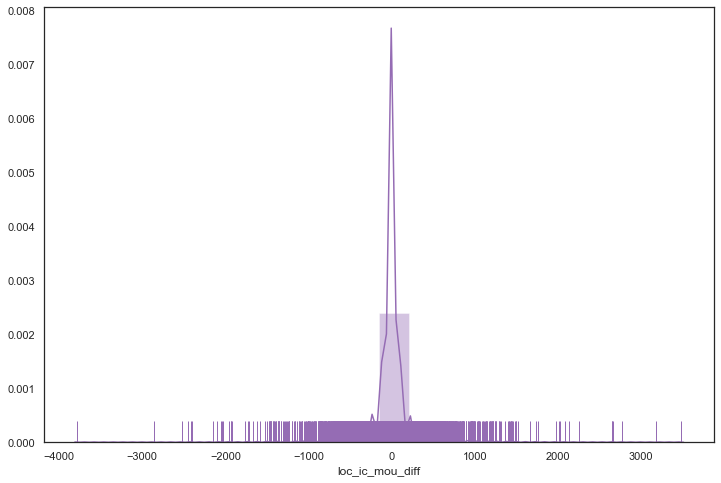

count    30001.000000
mean        -3.525128
std         98.257693
min      -2777.350000
25%        -11.915000
50%         -0.640000
75%          4.995000
max       3321.395000
Name: std_ic_mou_diff, dtype: float64


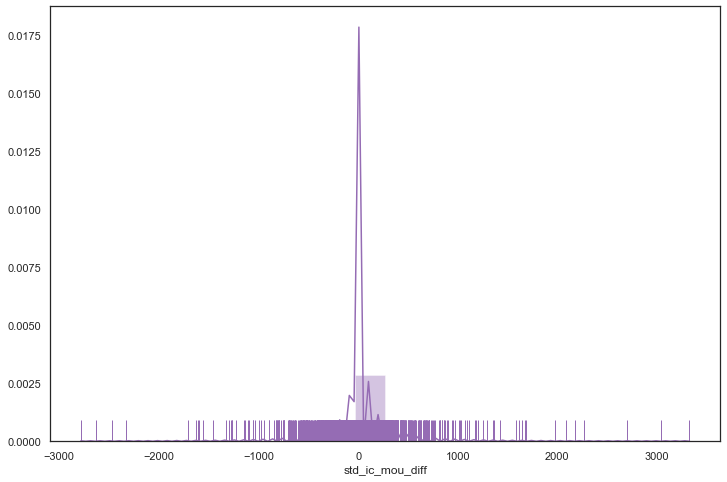

count    30001.000000
mean        -0.174927
std         56.701029
min      -5534.595000
25%          0.000000
50%          0.000000
75%          0.000000
max       3163.690000
Name: isd_ic_mou_diff, dtype: float64


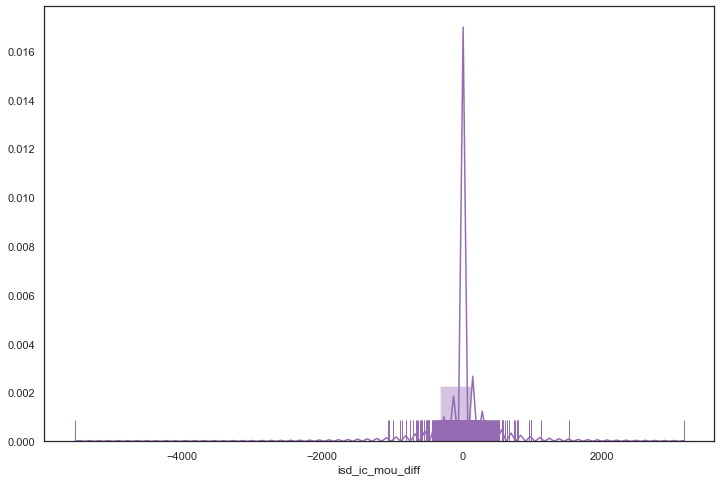

count    30001.000000
mean        -1.299766
std         10.834308
min        -63.998509
25%          0.000000
50%          0.000000
75%          0.000000
max         66.269494
Name: spl_ic_mou_diff, dtype: float64


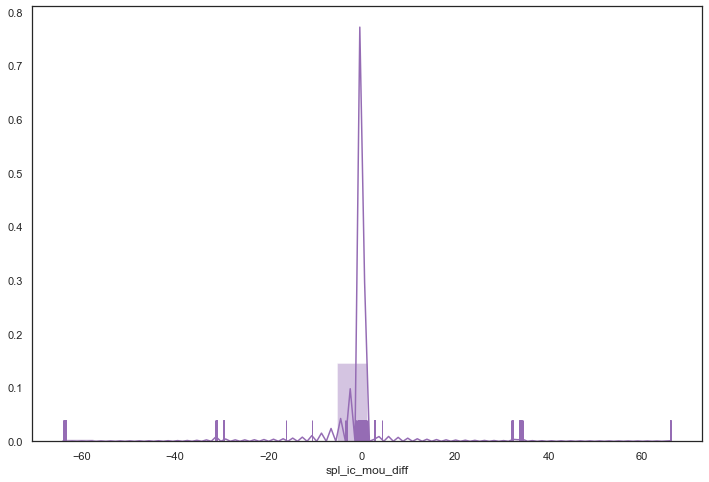

count    30001.000000
mean       -13.430810
std        221.899902
min      -5710.150000
25%        -67.230000
50%         -5.610000
75%         44.280000
max       3485.370000
Name: total_ic_mou_diff, dtype: float64


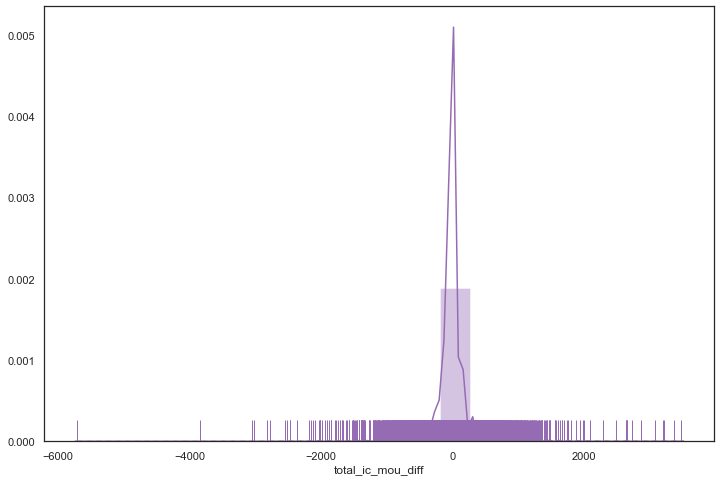

count    30001.000000
mean        -1.812056
std          6.755899
min       -147.500000
25%         -4.000000
50%         -1.500000
75%          1.000000
max        130.500000
Name: total_rech_num_diff, dtype: float64


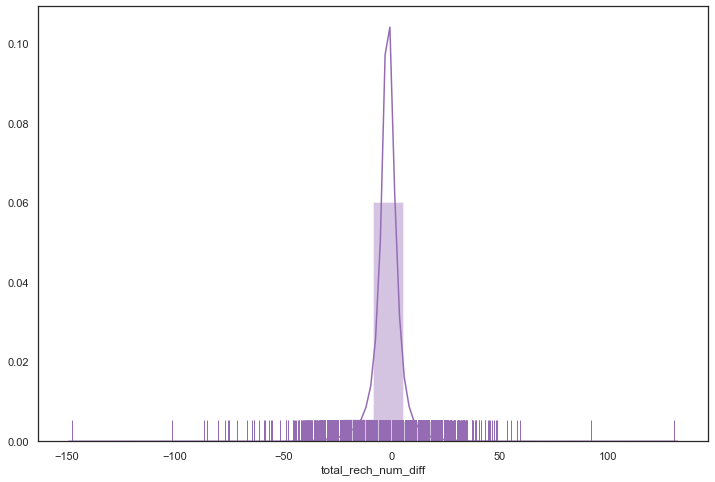

count    30001.000000
mean       -76.249725
std        418.479122
min      -6950.000000
25%       -245.000000
50%        -57.500000
75%         99.500000
max      14344.500000
Name: total_rech_amt_diff, dtype: float64


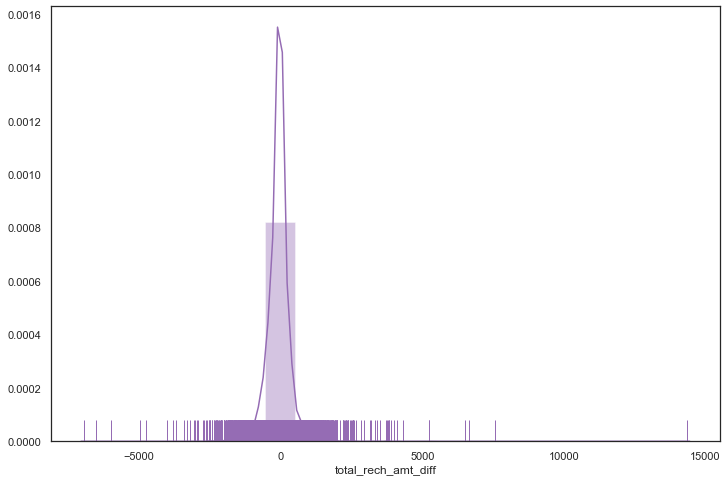

count    30001.000000
mean       -10.598813
std        136.893018
min      -3010.000000
25%        -33.000000
50%          0.000000
75%         25.000000
max       3949.000000
Name: max_rech_amt_diff, dtype: float64


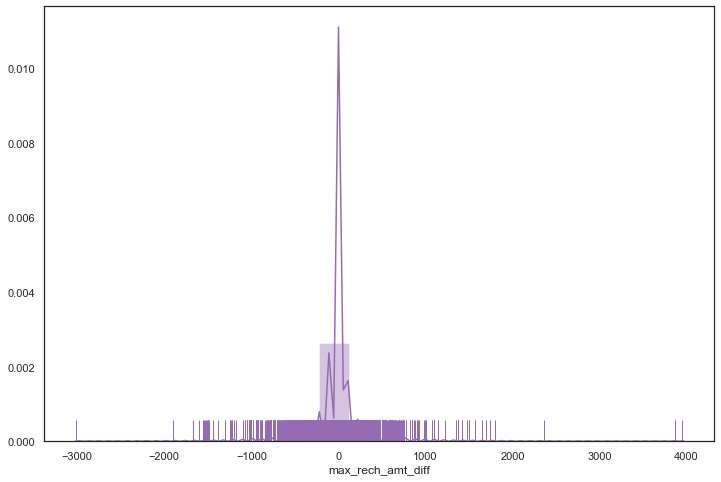

count    30001.000000
mean        -0.138845
std          2.214561
min        -30.500000
25%         -0.500000
50%          0.000000
75%          0.000000
max         52.500000
Name: total_rech_data_diff, dtype: float64


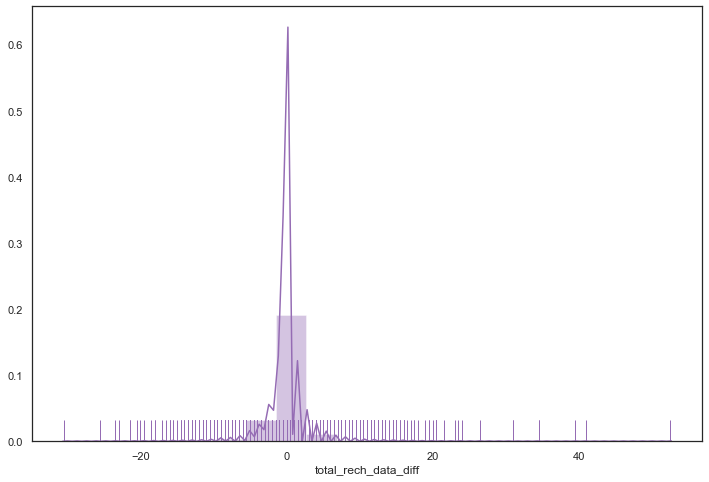

count    30001.000000
mean        -6.467768
std         78.343307
min      -1303.000000
25%         -7.000000
50%          0.000000
75%          0.000000
max       1352.000000
Name: max_rech_data_diff, dtype: float64


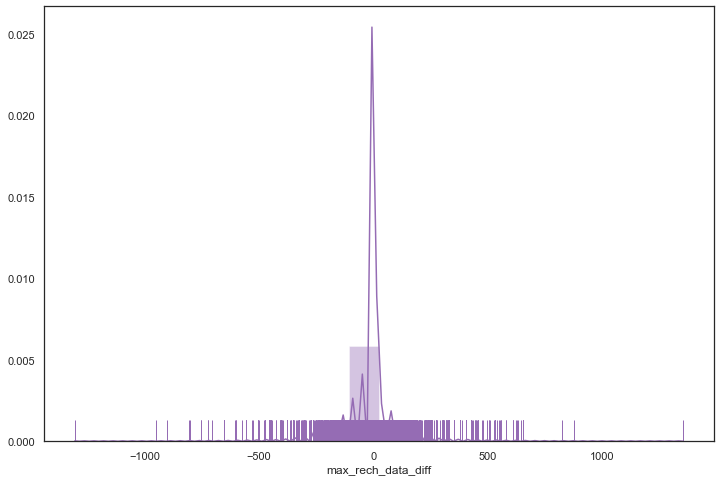

count    30001.000000
mean       -13.085795
std        148.249896
min      -3486.500000
25%        -59.000000
50%          0.000000
75%          9.500000
max       1805.000000
Name: av_rech_amt_data_diff, dtype: float64


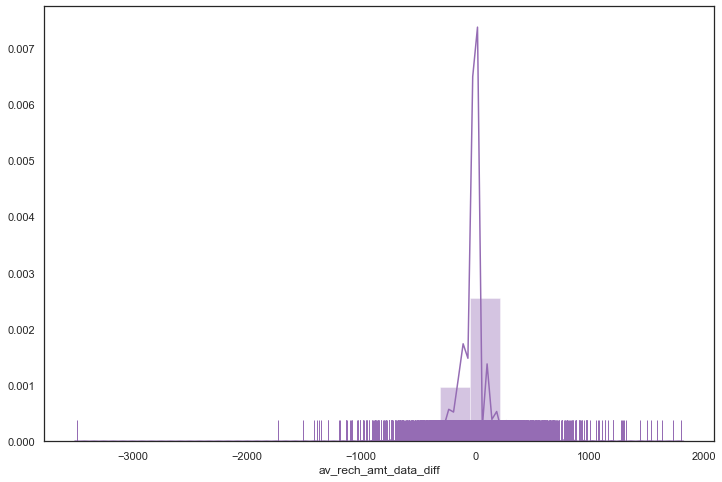

count    30001.000000
mean       -19.896683
std        256.114926
min      -4740.925000
25%        -21.120000
50%          0.000000
75%          0.000000
max       8062.295000
Name: vol_2g_mb_diff, dtype: float64


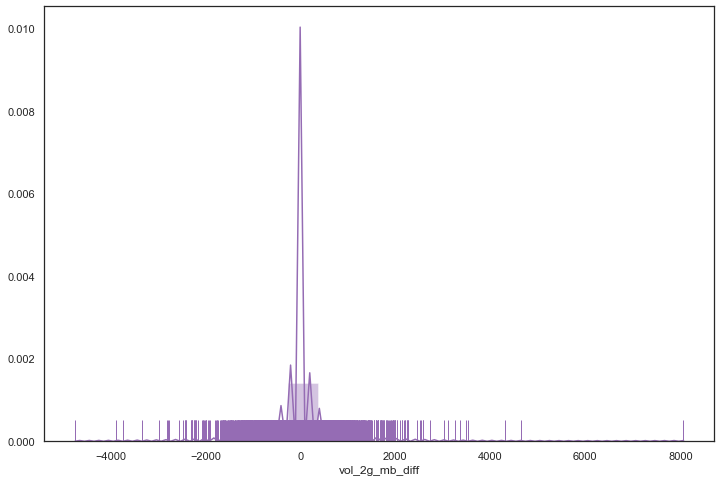

count    30001.000000
mean        -5.733637
std        624.877555
min     -12385.505000
25%         -2.270000
50%          0.000000
75%          0.000000
max      15646.390000
Name: vol_3g_mb_diff, dtype: float64


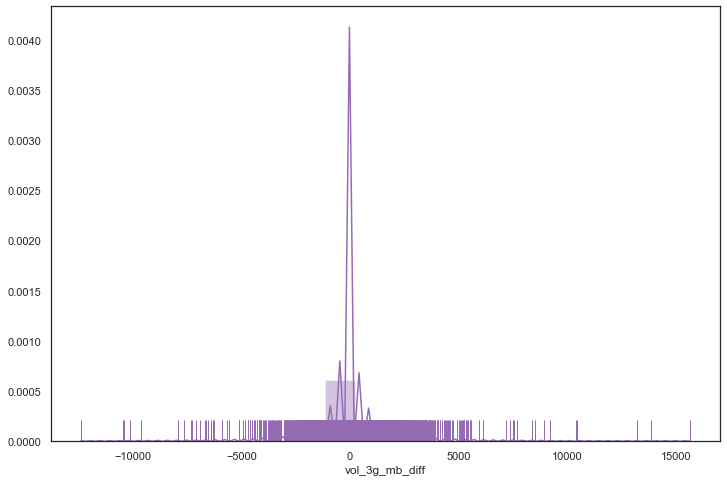

In [39]:
# creating list of cols required Bin
bincols = dfchurn_filtered.columns


# Set Graph background white
sns.set(style="white", palette="muted", color_codes=True)

# Histrogram chart in loop
for col in bincols:
    print(dfchurn_filtered[col].describe())
    plt.subplots(figsize=(12, 8), sharex=True)
    sns.distplot(dfchurn_filtered[col], color="m",  kde=True, rug=True, bins=20)
    plt.show()


> ## 3.2. Bivariate Analysis

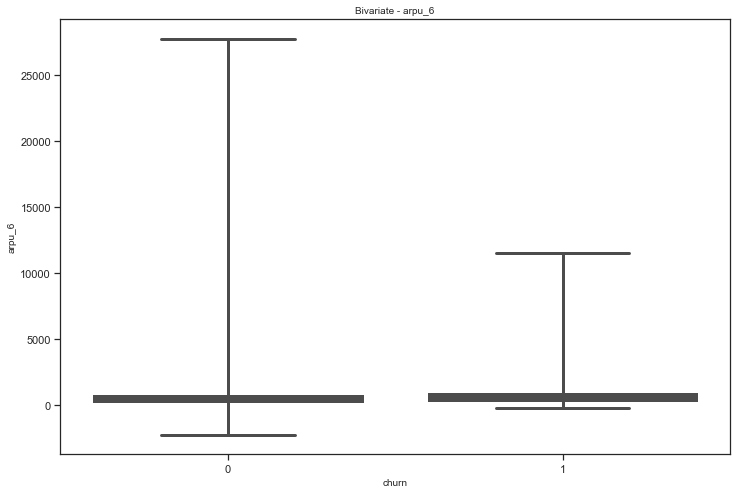

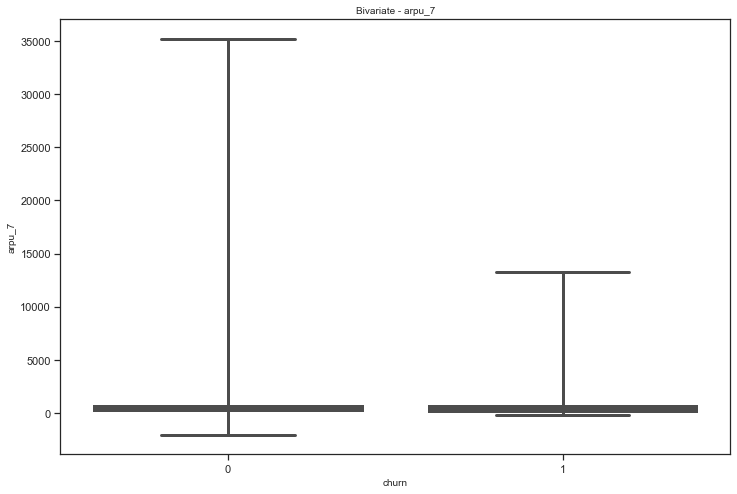

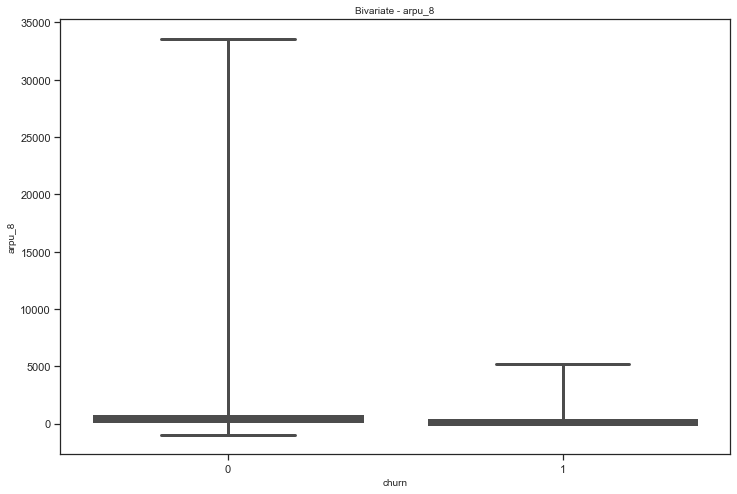

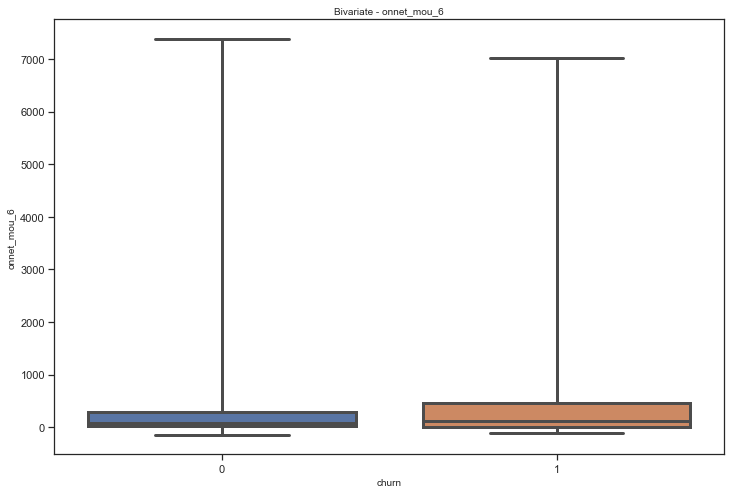

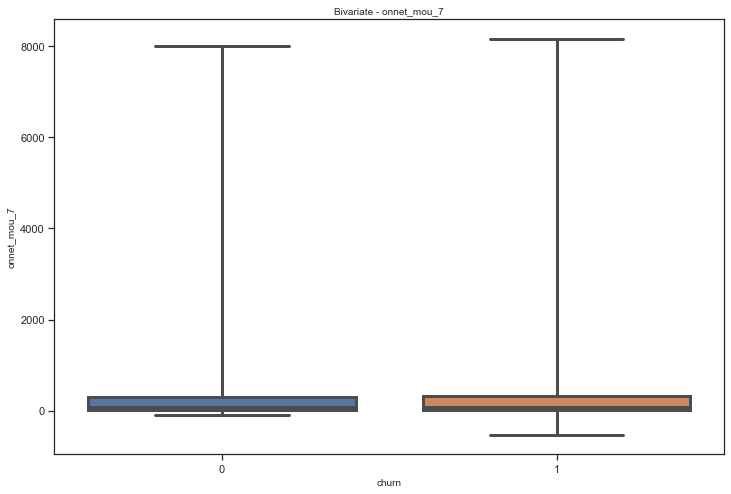

...

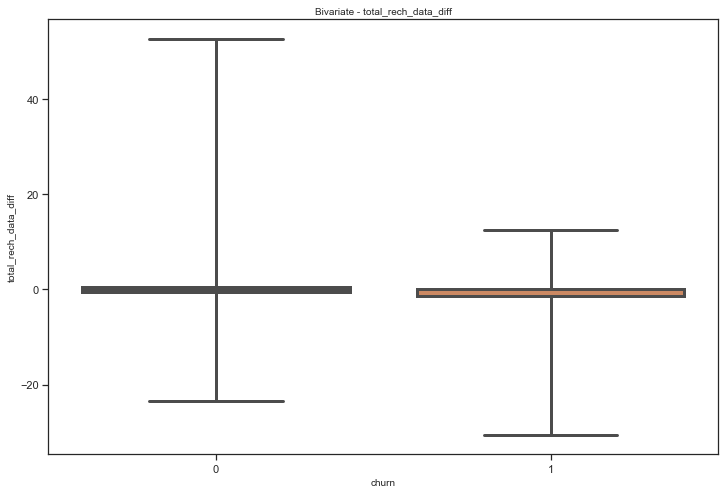

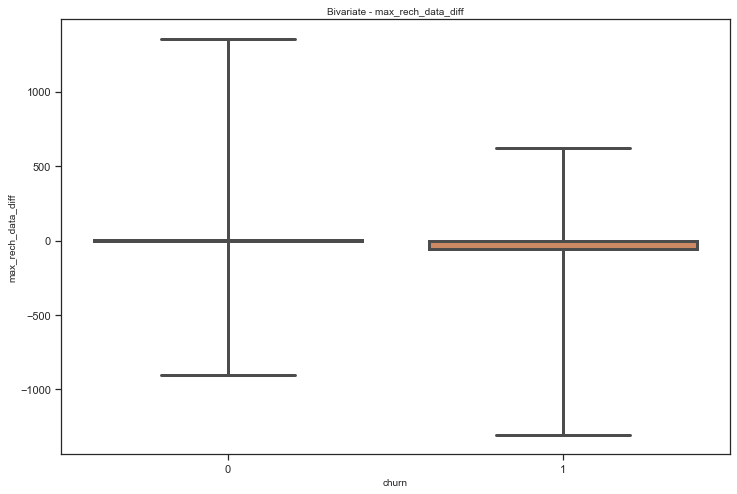

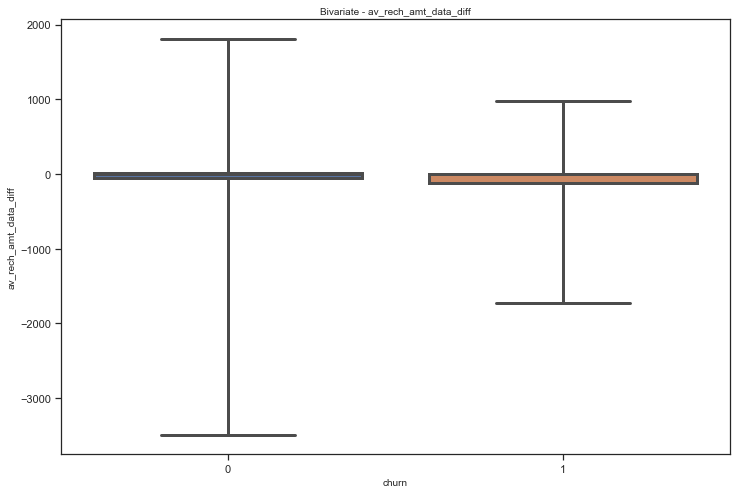

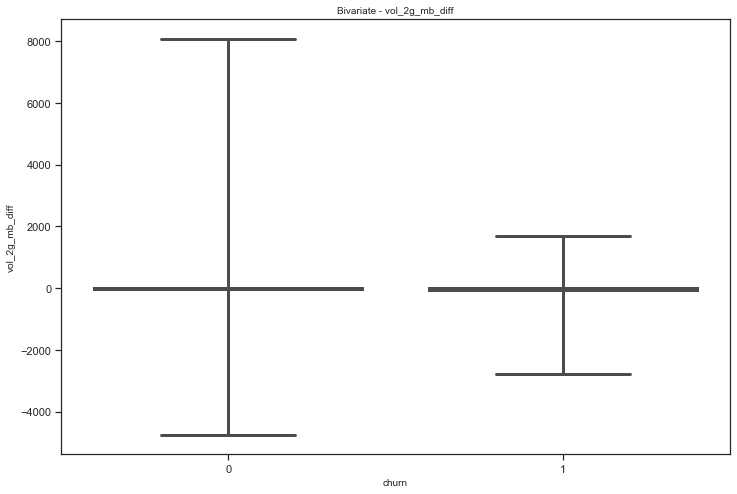

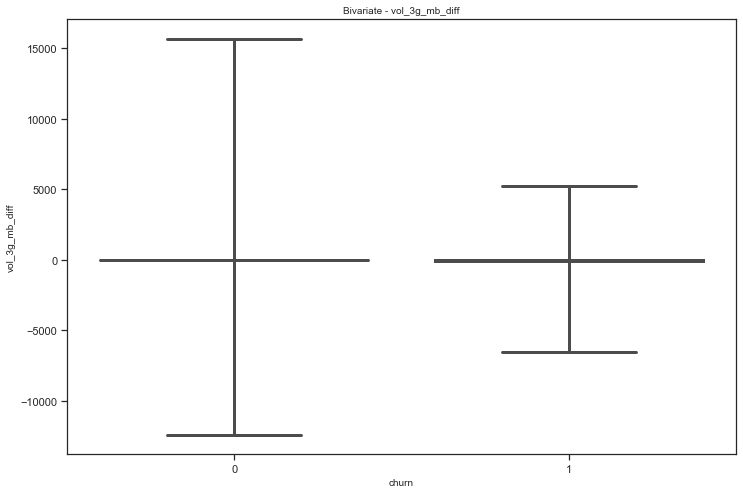

In [40]:
#Creating list of Segmented Variables
segmented =  list(dfchurn_filtered.columns)
segmented.remove('churn')

#Box Plot
sns.set(style="ticks", rc={"axes.labelsize":10})

for col in segmented:
    plt.subplots(figsize=(12, 8), sharex=True)
    sns.boxplot(x=dfchurn_filtered.churn, y=dfchurn_filtered[col], whis="range", 
                color="y", linewidth=3, palette="deep")
    plt.title("Bivariate - "+col, fontsize=10)
    plt.show()

> ## 3.3. BiVariate Categorical CrossTab Analsis

In [41]:
pd.crosstab(dfchurn_filtered.night_pck_user_6,dfchurn_filtered.churn, margins=False)

churn,0,1
night_pck_user_6,,
-1.0,11937,1308
0.0,15254,1095
1.0,369,38


In [42]:
pd.crosstab(dfchurn_filtered.night_pck_user_7,dfchurn_filtered.churn, margins=False)

churn,0,1
night_pck_user_7,,
-1.0,11458,1486
0.0,15750,932
1.0,352,23


In [43]:
pd.crosstab(dfchurn_filtered.night_pck_user_8,dfchurn_filtered.churn, margins=False)

churn,0,1
night_pck_user_8,,
-1.0,12066,1982
0.0,15162,450
1.0,332,9


In [44]:
pd.crosstab(dfchurn_filtered.monthly_2g_6,dfchurn_filtered.churn, margins=False)

churn,0,1
monthly_2g_6,,
0.0,23148,2246
1.0,3854,167
2.0,526,25
3.0,27,1
4.0,5,2


In [45]:
pd.crosstab(dfchurn_filtered.monthly_2g_7,dfchurn_filtered.churn, margins=False)

churn,0,1
monthly_2g_7,,
0.0,22957,2284
1.0,3930,141
2.0,633,16
3.0,33,0
4.0,5,0
5.0,2,0


In [46]:
pd.crosstab(dfchurn_filtered.monthly_2g_8,dfchurn_filtered.churn, margins=False)

churn,0,1
monthly_2g_8,,
0.0,23466,2388
1.0,3687,50
2.0,367,3
3.0,30,0
4.0,8,0
5.0,2,0


In [47]:
pd.crosstab(dfchurn_filtered.sachet_3g_6,dfchurn_filtered.churn, margins=False)



churn,0,1
sachet_3g_6,,
0.0,24591,2177
1.0,2019,165
2.0,472,35
3.0,174,18
4.0,88,14
5.0,54,8
6.0,35,6
7.0,37,7
8.0,19,1


In [48]:
pd.crosstab(dfchurn_filtered.sachet_3g_7,dfchurn_filtered.churn, margins=False)



churn,0,1
sachet_3g_7,,
0.0,24585,2222
1.0,1898,129
2.0,484,37
3.0,193,16
4.0,111,9
5.0,92,9
6.0,60,4
7.0,28,3
8.0,18,1


In [49]:
pd.crosstab(dfchurn_filtered.sachet_3g_8,dfchurn_filtered.churn, margins=False)

churn,0,1
sachet_3g_8,,
0.0,24972,2369
1.0,1609,48
2.0,399,5
3.0,184,8
4.0,106,4
5.0,86,2
6.0,43,1
7.0,35,0
8.0,28,2


In [50]:
pd.crosstab(dfchurn_filtered.fb_user_6,dfchurn_filtered.churn, margins=False)

churn,0,1
fb_user_6,,
-1.0,11937,1308
0.0,1136,95
1.0,14487,1038


In [51]:
pd.crosstab(dfchurn_filtered.fb_user_7,dfchurn_filtered.churn, margins=False)

churn,0,1
fb_user_7,,
-1.0,11458,1486
0.0,1247,88
1.0,14855,867


In [52]:
pd.crosstab(dfchurn_filtered.fb_user_8,dfchurn_filtered.churn, margins=False)

churn,0,1
fb_user_8,,
-1.0,12066,1982
0.0,1529,111
1.0,13965,348


> ## 3.4. Continous Variable

In [53]:
#check Correlation relationship between Continous variable list
dfchurn_filtered.corr()


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
arpu_6,1.000000,0.671732,0.612617,0.344087,0.215114,0.184371,0.507408,0.339523,0.287303,0.122550,0.084082,0.093775,0.192967,0.141871,0.125482,0.171840,0.127412,0.120350,0.328742,0.245604,0.221120,0.137472,0.114303,0.105137,0.042749,0.014644,0.011599,0.329041,0.246068,0.222638,0.273317,0.161550,0.134240,0.299381,0.181471,0.140900,0.065629,0.053505,0.044264,0.384134,0.230605,0.183360,0.469619,0.402543,0.368261,0.120159,0.068368,0.045557,0.053489,0.024333,0.015521,0.554510,0.363276,0.301856,0.086879,0.063014,0.060819,0.183356,0.149423,0.127090,0.048363,0.039040,0.038414,0.179942,0.142669,0.125397,0.091526,0.061722,0.055461,0.096295,0.065596,0.063692,0.033093,0.032498,0.023338,0.125141,0.085685,0.079330,0.225987,0.169024,0.150749,0.091100,0.005296,-0.018466,0.101992,0.063130,0.071055,0.015445,0.023819,0.012557,0.349709,0.136098,0.119406,0.946125,0.650611,0.603673,0.337983,0.261993,0.284518,0.266656,0.207282,0.199304,-0.108914,-0.175490,-0.122114,0.072714,-0.021877,0.025203,0.115368,-0.026426,0.029159,-0.062580,-0.098980,-0.077949,0.152507,0.070184,0.084675,-0.110288,-0.192870,-0.120593,-0.039073,-0.084189,-0.061430,-0.158359,-0.193927,-0.152069,0.176436,0.081091,0.103661,-0.002555,-0.025233,-0.017509,-0.122195,-0.203611,-0.137702,0.041451,0.058547,0.055172,0.112462,0.045053,-0.250695,-0.148586,-0.198400,-0.013426,-0.051693,-0.128015,-0.185660,-0.125699,-0.048470,-0.219602,-0.068226,-0.040087,-0.025191,-0.061017,-0.083105,-0.175133,-0.205217,-0.030006,0.026922,-0.000790,-0.021047,0.009069,-0.038385
arpu_7,0.671732,1.000000,0.759858,0.211824,0.322358,0.272460

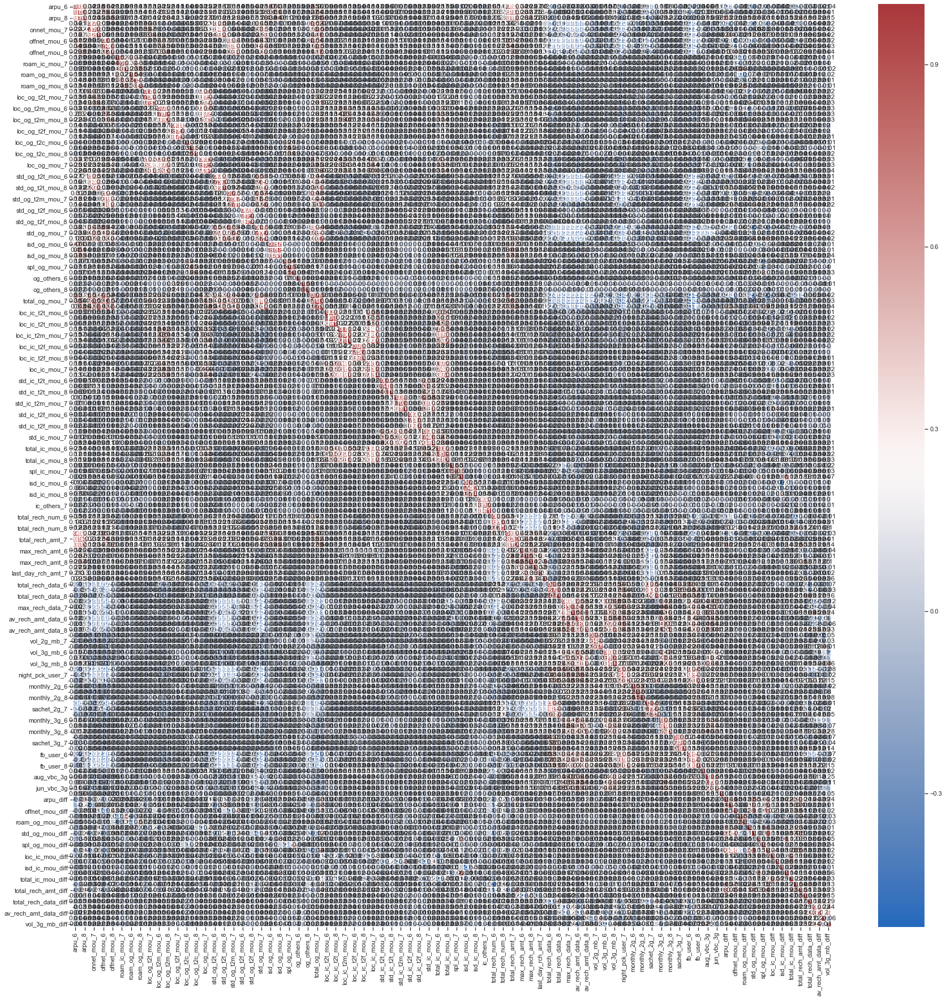

In [54]:
f, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(round(dfchurn_filtered.corr(),2),cmap="vlag", annot=True, linewidths=.5, ax=ax)
plt.show()

> ## 3.5. Cap outliers for all numeric variables with k-sigma technique

In [55]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [56]:
# example of capping
sample_array = list(range(100))

# add outliers to the data
sample_array[0] = -9999
sample_array[99] = 9999

# cap outliers
sample_array = np.array(sample_array)
print("Array after capping outliers: \n", cap_outliers(sample_array, k=2))

Array after capping outliers: 
 [-2780     1     2     3     4     5     6     7     8     9    10    11
    12    13    14    15    16    17    18    19    20    21    22    23
    24    25    26    27    28    29    30    31    32    33    34    35
    36    37    38    39    40    41    42    43    44    45    46    47
    48    49    50    51    52    53    54    55    56    57    58    59
    60    61    62    63    64    65    66    67    68    69    70    71
    72    73    74    75    76    77    78    79    80    81    82    83
    84    85    86    87    88    89    90    91    92    93    94    95
    96    97    98  2877]


In [57]:
# cap outliers in the numeric columns
dfchurn_filtered[num_cols] = dfchurn_filtered[num_cols].apply(cap_outliers, axis=0)

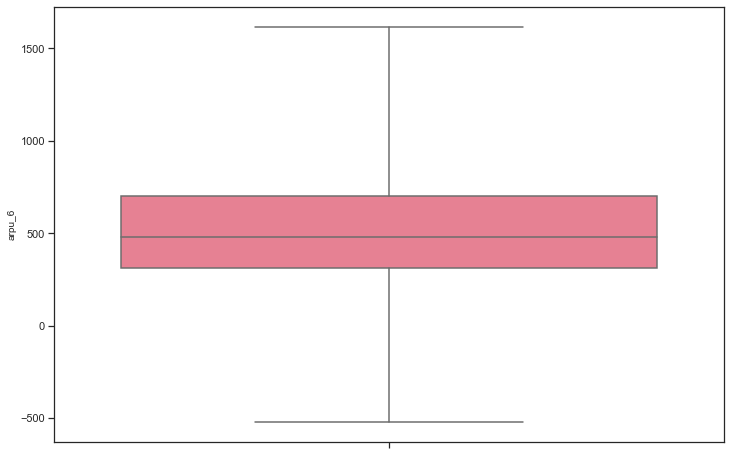

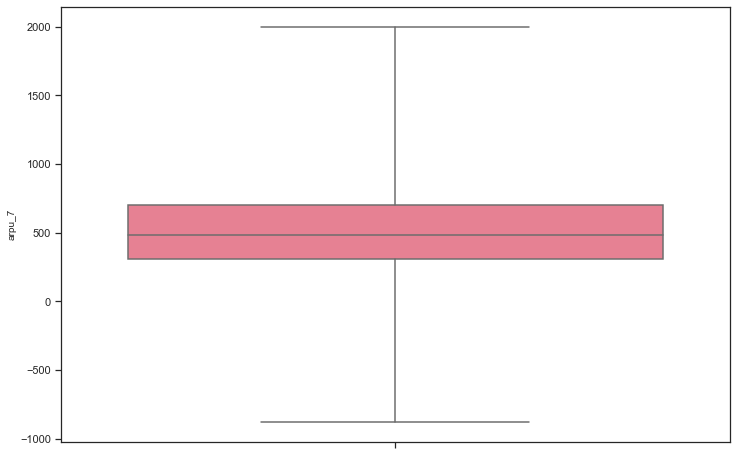

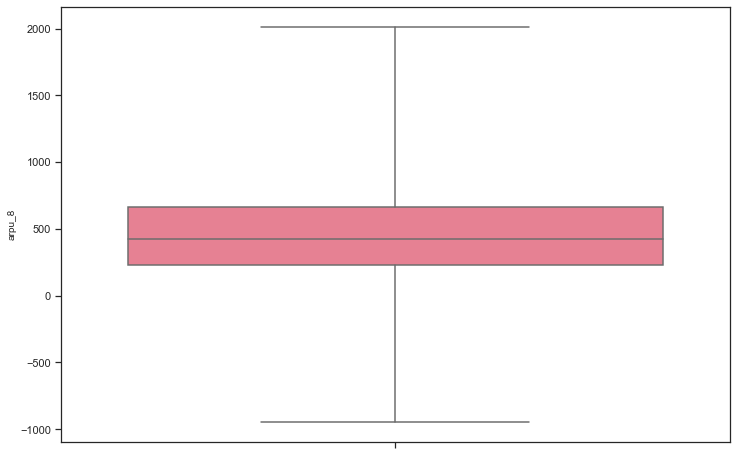

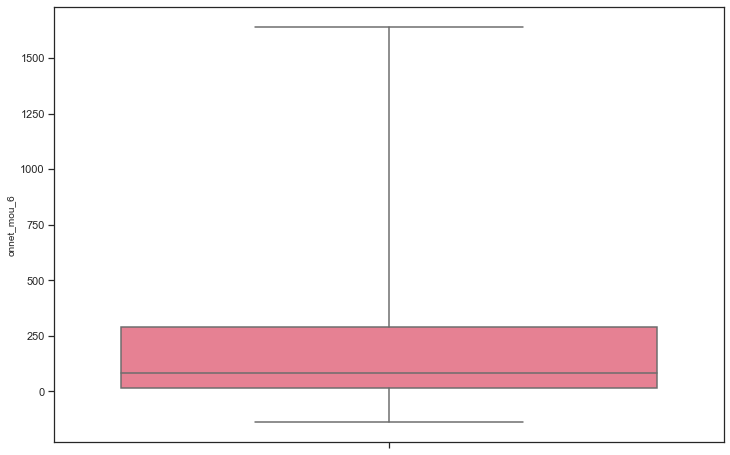

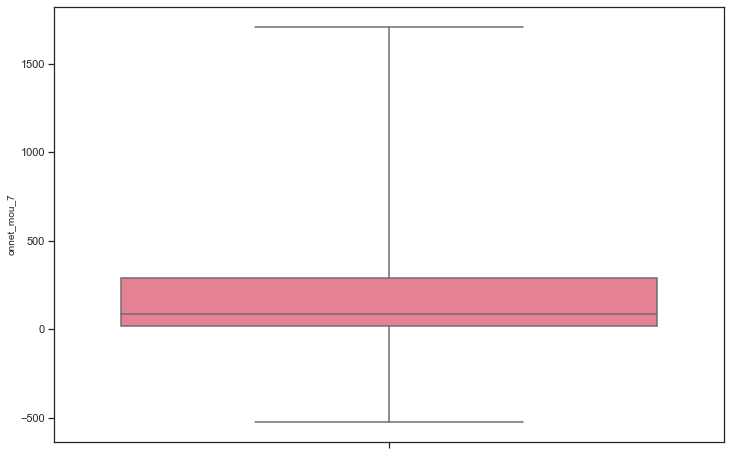

...

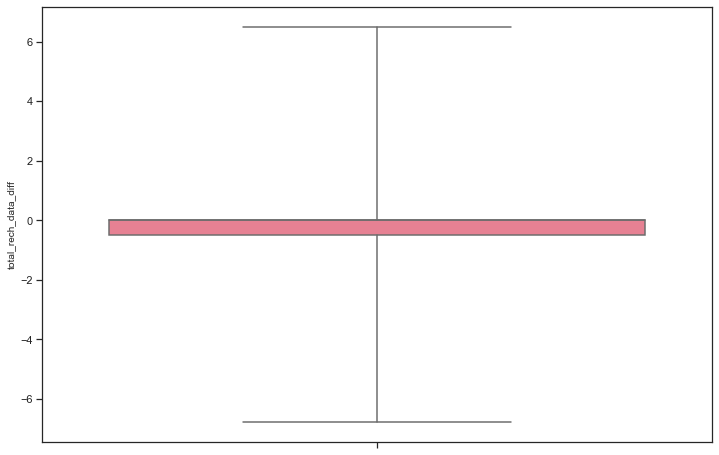

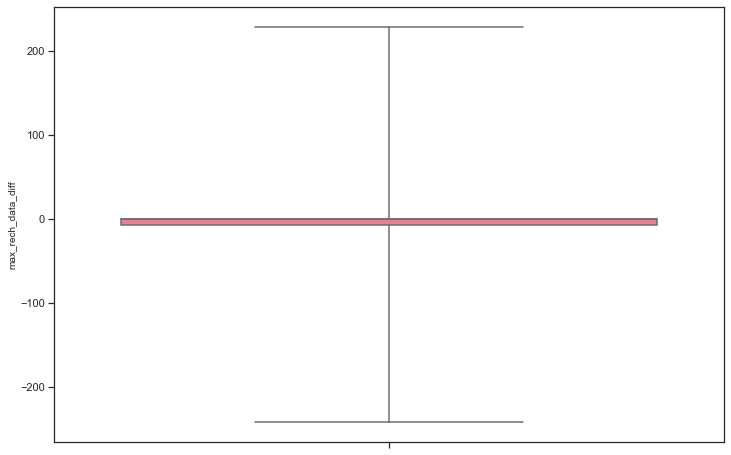

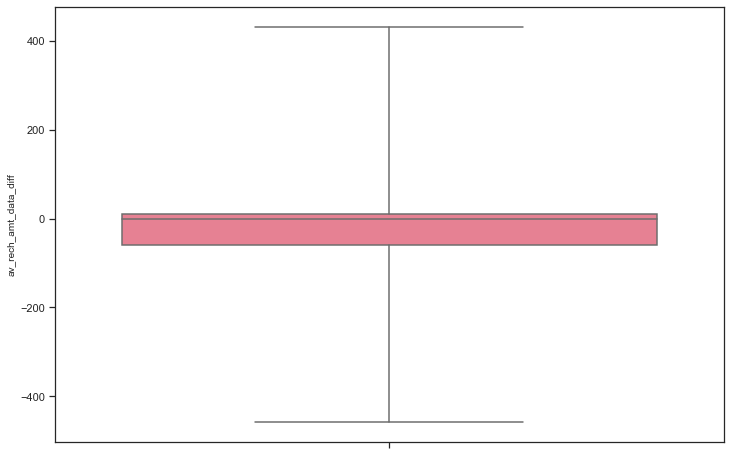

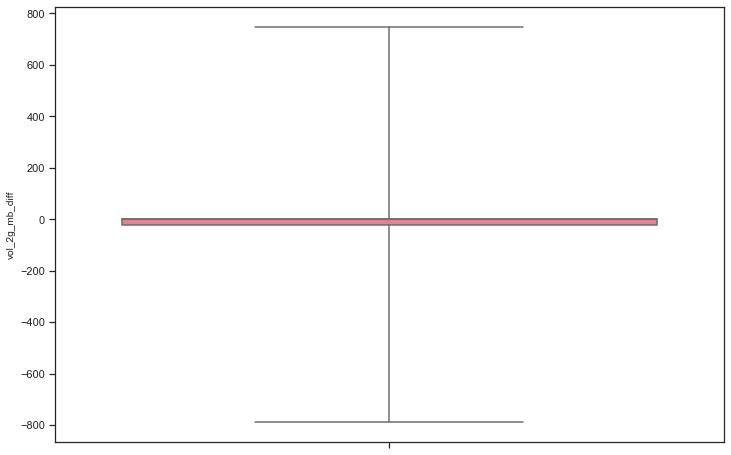

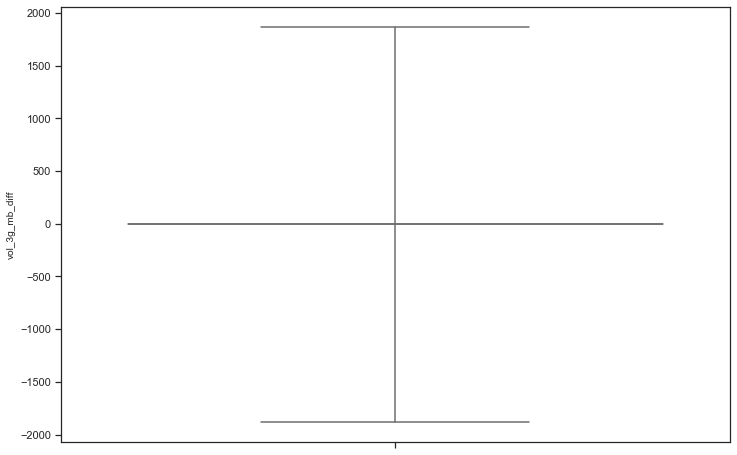

In [58]:
#Box Plot
for col in num_cols:
    plt.subplots(figsize=(12, 8), sharex=True)
    sns.boxplot(y=dfchurn_filtered[col],whis="range", palette="husl")
    plt.show()


> # <font color=blue> 4. Modelling </font>

> ## 4.1. Making Predictions and preprocessing data

In [59]:
#Change churn into numeric
dfchurn_filtered['churn'] = pd.to_numeric(dfchurn_filtered['churn'])

> ## 4.2. Train Test split

In [60]:
# divide data into train and test
y = dfchurn_filtered.churn
X = dfchurn_filtered.drop("churn", axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 4, stratify = y)

In [61]:
# print shapes of train and test sets
print("X_Train :",X_train.shape)
print("y_Train :",y_train.shape)
print("X_Test :",X_test.shape)
print("y_Test :",y_test.shape)

X_Train : (22500, 163)
y_Train : (22500,)
X_Test : (7501, 163)
y_Test : (7501,)


> ## 4.3. Aggregate Categorical columns

In [62]:
train = pd.concat([X_train, y_train], axis=1)

# aggregate the categorical variables
print(train.groupby('night_pck_user_6').churn.mean())
print(train.groupby('night_pck_user_7').churn.mean())
print(train.groupby('night_pck_user_8').churn.mean())
print(train.groupby('fb_user_6').churn.mean())
print(train.groupby('fb_user_7').churn.mean())
print(train.groupby('fb_user_8').churn.mean())

night_pck_user_6
-1.0    0.099165
 0.0    0.066797
 1.0    0.087838
Name: churn, dtype: float64
night_pck_user_7
-1.0    0.115746
 0.0    0.055494
 1.0    0.051282
Name: churn, dtype: float64
night_pck_user_8
-1.0    0.141108
 0.0    0.029023
 1.0    0.016194
Name: churn, dtype: float64
fb_user_6
-1.0    0.099165
 0.0    0.069460
 1.0    0.067124
Name: churn, dtype: float64
fb_user_7
-1.0    0.115746
 0.0    0.059305
 1.0    0.055082
Name: churn, dtype: float64
fb_user_8
-1.0    0.141108
 0.0    0.066887
 1.0    0.024463
Name: churn, dtype: float64


In [63]:
# replace categories with aggregated values in each categorical column
mapping = {'night_pck_user_6' : {-1: 0.099165, 0: 0.066797, 1: 0.087838},
           'night_pck_user_7' : {-1: 0.115746, 0: 0.055494, 1: 0.051282},
           'night_pck_user_8' : {-1: 0.141108, 0: 0.029023, 1: 0.016194},
           'fb_user_6'        : {-1: 0.099165, 0: 0.069460, 1: 0.067124},
           'fb_user_7'        : {-1: 0.115746, 0: 0.059305, 1: 0.055082},
           'fb_user_8'        : {-1: 0.141108, 0: 0.066887, 1: 0.024463}
          }
X_train.replace(mapping, inplace = True)
X_test.replace(mapping, inplace = True)

In [64]:
# check data type of categorical columns - make sure they are numeric
X_train[[col for col in cat_cols if col not in ['churn']]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22500 entries, 4525 to 22754
Data columns (total 6 columns):
night_pck_user_6    22500 non-null float64
night_pck_user_7    22500 non-null float64
night_pck_user_8    22500 non-null float64
fb_user_6           22500 non-null float64
fb_user_7           22500 non-null float64
fb_user_8           22500 non-null float64
dtypes: float64(6)
memory usage: 1.2 MB


> ## 4.4. PCA

In [65]:
# PCA Model
pca=PCA(svd_solver='randomized', random_state=42)

In [66]:
#performing PCA and object instanciate
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='randomized', tol=0.0, whiten=False)

In [67]:
#PCA components
pca.components_

array([[ 1.20064374e-01,  1.41625470e-01,  1.34419763e-01, ...,
         9.38569582e-03,  9.16859739e-03,  1.79291343e-02],
       [ 9.43464099e-02,  1.40193975e-01,  2.04749947e-01, ...,
         1.25712699e-02,  9.60378091e-03,  3.56679458e-02],
       [ 1.13375779e-02,  2.96073651e-02,  1.73713993e-02, ...,
        -5.02476269e-03, -8.05463641e-04, -1.65246803e-02],
       ...,
       [-4.36832557e-07, -3.47546800e-07,  2.52192174e-06, ...,
        -2.92597942e-06, -1.64431523e-06,  3.77464677e-07],
       [ 1.08431894e-07, -5.52194498e-09, -1.14333896e-07, ...,
        -5.17124190e-07,  3.94950279e-07, -9.44579312e-08],
       [-4.56938023e-08,  5.18459248e-08,  1.07449081e-07, ...,
         1.23355689e-07,  3.75876107e-08, -4.92110866e-08]])

In [68]:
#Variance explained by the PCA
pca.explained_variance_ratio_

array([2.72284764e-01, 1.40089063e-01, 1.16311081e-01, 9.27420633e-02,
       6.74556091e-02, 5.05753931e-02, 4.07131752e-02, 2.67792439e-02,
       2.45883246e-02, 2.05582819e-02, 1.46710466e-02, 1.38079580e-02,
       1.34760845e-02, 1.10216165e-02, 1.04577334e-02, 9.09578966e-03,
       7.44039667e-03, 6.26525750e-03, 5.68347086e-03, 4.70664760e-03,
       3.88717765e-03, 3.73134207e-03, 3.30648890e-03, 3.01431994e-03,
       2.68806665e-03, 2.60974559e-03, 2.05725261e-03, 1.84661593e-03,
       1.82588694e-03, 1.66143776e-03, 1.63740293e-03, 1.53091710e-03,
       1.45653871e-03, 1.30109750e-03, 1.13068465e-03, 1.09134379e-03,
       1.03223531e-03, 9.82247304e-04, 9.36735769e-04, 8.78905496e-04,
       8.43674331e-04, 7.08508950e-04, 6.78751652e-04, 5.99198251e-04,
       5.66955860e-04, 5.52624642e-04, 5.21491637e-04, 5.03146529e-04,
       4.57612524e-04, 4.01196933e-04, 3.84794639e-04, 3.56091444e-04,
       3.55655634e-04, 3.32098693e-04, 3.20772877e-04, 3.08605442e-04,
      

> ### 4.4.1. Scree Plot

<BarContainer object of 163 artists>

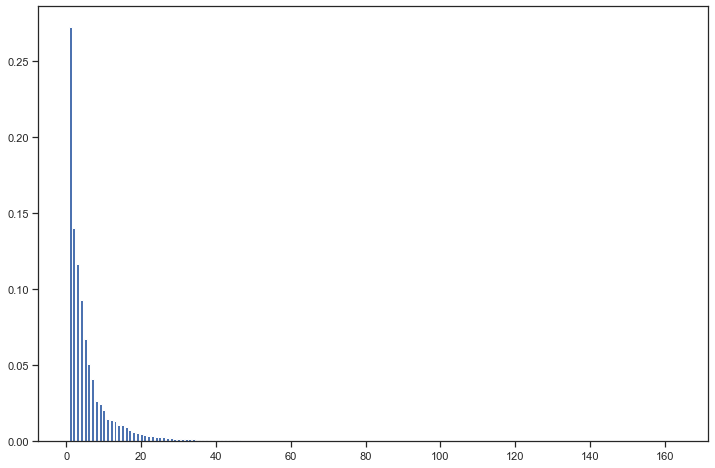

In [69]:
#Bar chart of Variance Explained by PCA
fig = plt.figure(figsize=[12,8])
plt.bar(range(1,len(pca.explained_variance_ratio_)+1),pca.explained_variance_ratio_)

In [70]:
#Cumulative Calcuation
var_cumu = np.cumsum(pca.explained_variance_ratio_)

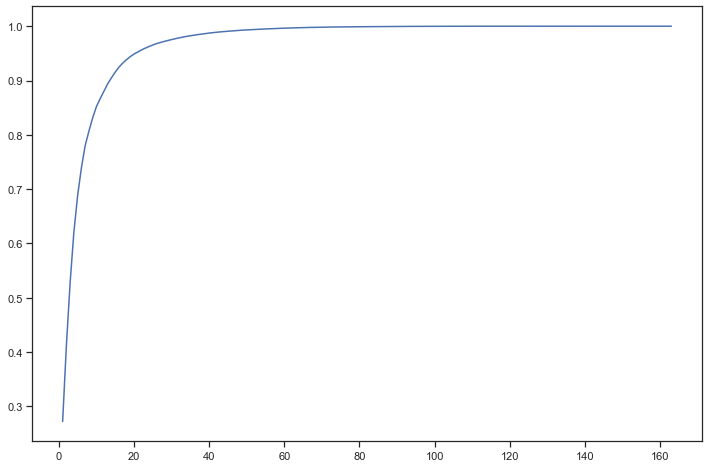

In [71]:
#Plotting the Scree Plot
fig = plt.figure(figsize=[12,8])
plt.plot(range(1,len(var_cumu)+1),var_cumu)

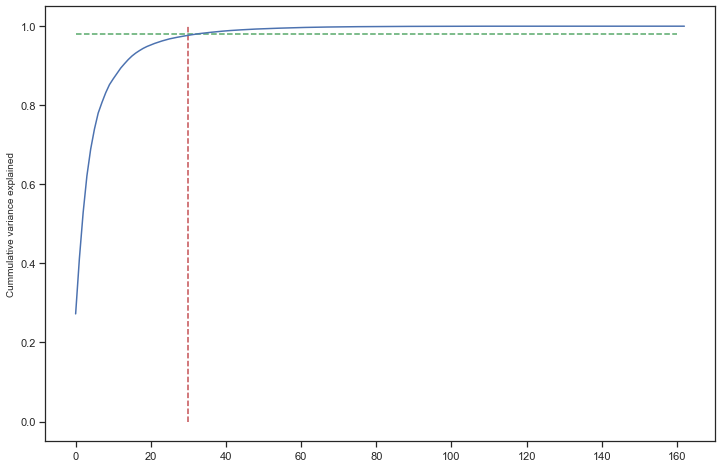

In [72]:
#Scree Plot with axis
fig = plt.figure(figsize=[12,8])
plt.plot(var_cumu)
plt.hlines(y=0.98, xmax=160, xmin=0, colors="g", linestyles="--")
plt.vlines(x=30, ymax=1, ymin=0.0, colors="r", linestyles="--")
plt.ylabel("Cummulative variance explained")
plt.show()

In [73]:

# apply pca to train data
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])

In [74]:
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)

In [75]:
# extract pca model from pipeline
pca = pca.named_steps['pca']

# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       11.60
1       21.02
2       26.91
3       31.93
4       36.04
5       39.73
6       42.49
7       45.09
8       47.41
9       49.66
10      51.72
11      53.64
12      55.48
13      57.21
14      58.90
15      60.54
16      62.14
17      63.56
18      64.89
19      66.21
20      67.50
21      68.69
22      69.84
23      70.92
24      71.95
25      72.92
26      73.88
27      74.83
28      75.73
29      76.60
30      77.42
31      78.23
32      79.01
33      79.79
34      80.52
35      81.24
36      81.94
37      82.62
38      83.25
39      83.82
40      84.37
41      84.91
42      85.44
43      85.96
44      86.46
45      86.95
46      87.42
47      87.86
48      88.29
49      88.68
50      89.07
51      89.43
52      89.79
53      90.13
54      90.47
55      90.80
56      91.13
57      91.45
58      91.76
59      92.06
60      92.35
61      92.63
62      92.91
63      93.19
64      93.45
65      93.70
66      93.94
67      94.18
68      94.40
69      94.61
70      94.82
71    

~ 60 components explain 90% variance

~ 80 components explain 95% variance

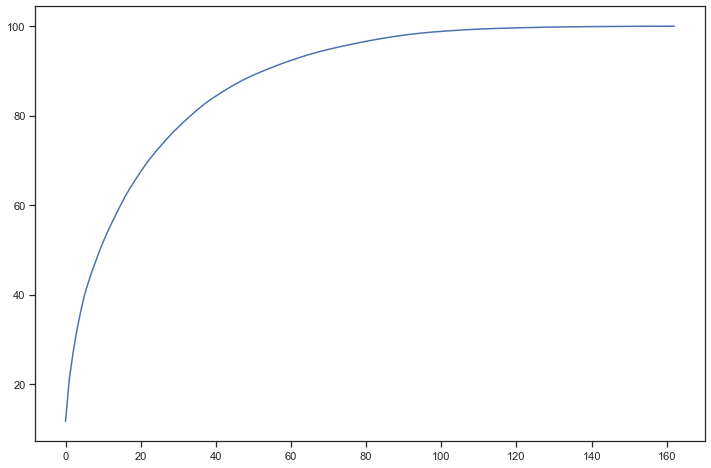

In [76]:
# plot feature variance
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)
fig = plt.figure(figsize=[12,8]) # 100 elements on y-axis; 175 elements on x-axis; 20 is normalising factor
plt.plot(cumulative_variance)

> ### 4.4.2. PCA and Logistic Regression

In [77]:
# create pipeline
PCA_VARS = 60
steps = [('scaler', StandardScaler()),
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [78]:
# fit model
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.8440444444444445

> ### 4.4.3. Evaluate on Test data

In [79]:
# predict churn on test data
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[5807 1084]
 [  98  512]]
Sensitivity: 	0.84
Specificity: 	0.84
AUC:    	 0.91


In [80]:
#Check for overall accuracy
print("Accuracy: ",metrics.accuracy_score(y_test, y_pred))
print("Precision: ",metrics.precision_score(y_test, y_pred))
print("Recall: ",metrics.recall_score(y_test, y_pred))



Accuracy:  0.8424210105319291
Precision:  0.3208020050125313
Recall:  0.839344262295082


> ### 4.4.4. Plot ROC

In [81]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(12, 8))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

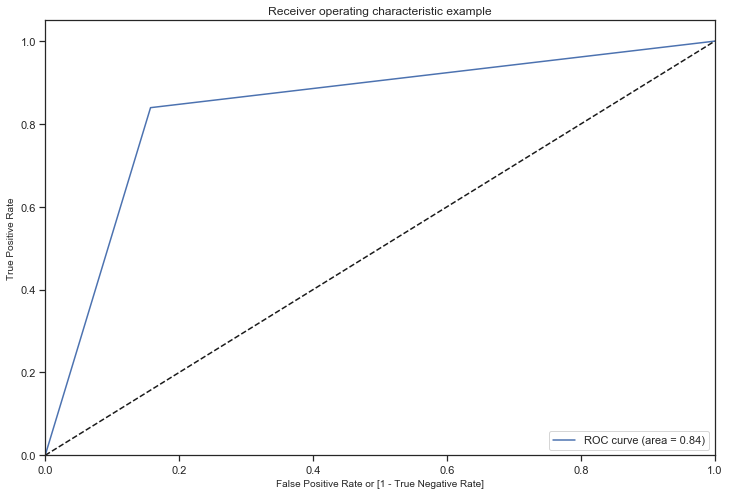

(array([0.        , 0.15730663, 1.        ]),
 array([0.        , 0.83934426, 1.        ]),
 array([2, 1, 0]))

In [82]:
draw_roc(y_test, y_pred)

In [83]:
"{:2.2f}".format(metrics.roc_auc_score(y_test, y_pred))

'0.84'

> ### 4.4.5. PCA and Logistic Regression - Hyperparameter tunning

In [84]:
# class imbalance
y_train.value_counts()/y_train.shape

0    0.918622
1    0.081378
Name: churn, dtype: float64

In [85]:
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression(class_weight={0:0.1, 1: 0.9})

# create pipeline
steps = [("scaler", StandardScaler()), 
         ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)

# hyperparameter space
params = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 
          'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [86]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  1.0min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('logistic',
                                        LogisticRegression(C=1.0,
                                                           c...
                          

In [87]:
# cross validation results
pd.DataFrame(model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.225997,0.027481,0.000000,0.000000,0.1,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,32
1,4.038654,0.065818,0.000000,0.000000,0.1,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,29
2,3.920274,0.069060,0.072915,0.011809,0.1,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.899337,0.890666,0.899793,0.916607,0.896176,0.900516,0.008680,9
3,4.974029,0.059494,0.091608,0.017456,0.1,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.898502,0.894086,0.902603,0.916932,0.899800,0.902385,0.007776,1
4,3.382372,0.059913,0.000000,0.000000,0.5,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,17
5,4.167999,0.133263,0.000000,0.000000,0.5,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,30
6,4.010712,0.103170,0.083168,0.011072,0.5,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.898919,0.890045,0.898828,0.915736,0.896286,0.899963,0.008521,14
7,5.350180,0.217925,0.078169,0.015173,0.5,l2,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.898610,0.894778,0.902241,0.915917,0.899955,0.902300,0.007227,2
8,3.367924,0.038252,0.000000,0.000000,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,28
9,3.703716,0.272058,0.000000,0.000000,1,l1,80,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,27


In [88]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9023846569875861
Best hyperparameters:  {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 80}


In [89]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[5994  897]
 [ 118  492]]
Sensitivity: 	0.81
Specificity: 	0.87
AUC:    	 0.92


> ## 4.5. Random Forest

In [90]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [91]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 out of  20 | elapsed:  1.6min remaining:   10.5s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.6min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                   

In [92]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9319941355288307
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 0.4}


In [93]:

# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6800   91]
 [ 313  297]]
Sensitivity: 	0.49
Specificity: 	0.99
AUC:    	 0.94


> #### Poor sensitivity. The best model is PCA along with Logistic regression.

> ## 4.6. Choosing best feature

In [94]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, 
                                  oob_score=True, random_state=4, verbose=1)

13


In [95]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.7s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 0.1, 1: 0.9}, criterion='gini',
                       max_depth=None, max_features=13, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=True,
                       random_state=4, verbose=1, warm_start=False)

In [96]:
# OOB score
rf_model.oob_score_

0.9457777777777778

In [97]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[[6805   86]
 [ 316  294]]
Sensitivity: 	0.48
Specificity: 	0.99
ROC:    	 0.93


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


<Table>
    <tr>
        <td><b> Predicted <br> Actual </b></td>
        <td><b> Churn </b> </td>
        <td><b> Not churn </b></td>
        <td><b> _ALL_ </b></td>
    </tr>
    <tr>
        <td><b> Churn  </b></td>
        <td> 6805  </td>
        <td> 86 </td>
        <td> 6891 </td>
    </tr>
    <tr>
        <td><b> Not churn </b></td>
        <td> 316  </td>
        <td> 294 </td>
        <td> 610 </td>
    </tr>
    <tr>
        <td><b> _ALL_ </b></td>
        <td> 7121  </td>
        <td> 380 </td>
        <td> 7501 </td>
    </tr>
</Table>

> ## 4.7.Feature selection

In [98]:
# predictors
features = dfchurn_filtered.drop('churn', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance

Sum of importance= 100.0


,variables,importance_percentage
0,total_ic_mou_8,4.341369
1,loc_ic_mou_8,4.301717
2,roam_og_mou_8,4.065823
3,roam_ic_mou_8,3.908053
4,loc_ic_t2t_mou_8,3.634653
5,loc_og_mou_8,3.160795
6,arpu_diff,2.832216
7,total_og_mou_8,2.515969
8,total_rech_amt_diff,2.507785
9,total_rech_amt_8,2.208177


> ## 4.7. Extracting top 30 features

In [99]:
# extract top 'n' features
top_n = 30
top_features = feature_importance.variables[0:top_n]

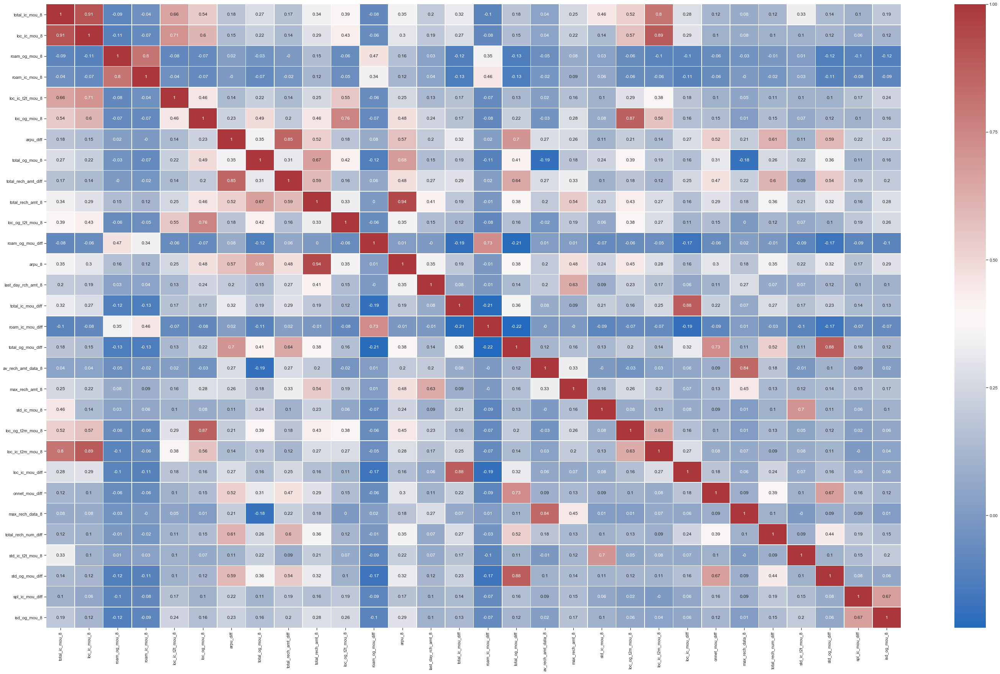

In [100]:
f, ax = plt.subplots(figsize=(50, 30))
sns.heatmap(round(X_train[top_features].corr(),2),cmap="vlag", annot=True, linewidths=.5, ax=ax)
plt.show()

> ## 4.8. Logistic Model

In [101]:
top_features = ['total_ic_mou_8','loc_ic_mou_8','roam_og_mou_8','roam_ic_mou_8','loc_ic_t2t_mou_8','loc_og_mou_8',
                'arpu_diff','total_og_mou_8','total_rech_amt_diff','total_rech_amt_8','loc_og_t2t_mou_8',
                'roam_og_mou_diff','arpu_8','last_day_rch_amt_8','total_ic_mou_diff','roam_ic_mou_diff',
                'total_og_mou_diff','av_rech_amt_data_8','max_rech_amt_8','std_ic_mou_8','loc_og_t2m_mou_8',
                'loc_ic_t2m_mou_8','loc_ic_mou_diff','onnet_mou_diff','max_rech_data_8','total_rech_num_diff',
                'std_ic_t2t_mou_8','std_og_mou_diff','spl_ic_mou_diff','isd_og_mou_8']

X_train = X_train[top_features]
X_test = X_test[top_features]

In [102]:

# logistic regression
steps = [('scaler', StandardScaler()), 
         ("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))
        ]

# compile pipeline
logistic = Pipeline(steps)

# hyperparameter space
params = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [103]:

# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    5.3s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('logistic',
                                        LogisticRegression(C=1.0,
                                                           class_weight={0: 0.1,
                                                                         1: 0.9},
                                                           dual=False,
                                                           fit_intercept=True,
                                                           intercept_scaling=1,
                                                           l1_ratio=None,
      

In [104]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8985192342067702
Best hyperparameters:  {'logistic__C': 0.5, 'logistic__penalty': 'l2'}


In [105]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6057  834]
 [ 135  475]]
Sensitivity: 	0.78
Specificity: 	0.88
ROC:    	 0.9


<Table>
    <tr>
        <td><b> Predicted <br> Actual </b></td>
        <td><b> Churn </b> </td>
        <td><b> Not churn </b></td>
        <td><b> _ALL_ </b></td>
    </tr>
    <tr>
        <td><b> Churn  </b></td>
        <td> 6057  </td>
        <td> 834 </td>
        <td> 6891 </td>
    </tr>
    <tr>
        <td><b> Not churn </b></td>
        <td> 135  </td>
        <td> 475 </td>
        <td> 610 </td>
    </tr>
    <tr>
        <td><b> _ALL_ </b></td>
        <td> 6192  </td>
        <td> 1309 </td>
        <td> 7501 </td>
    </tr>
</Table>

> ## 4.9. Extract the intercept and coefficients

In [106]:
logistic_model = model.best_estimator_.named_steps['logistic']

In [107]:
# intercept
intercept_df = pd.DataFrame(logistic_model.intercept_.reshape((1,1)), columns = ['intercept'])

In [108]:
# coefficients
coefficients = logistic_model.coef_.tolist()
coefficients = [val for sublist in coefficients for val in sublist]
coefficients = [round(coefficient, 3) for coefficient in coefficients]

logistic_features = list(X_train.columns)
coefficients_df = pd.DataFrame(logistic_model.coef_, columns=logistic_features)

In [109]:
# concatenate dataframes
coefficients = pd.concat([intercept_df, coefficients_df], axis=1)
coefficients

,intercept,total_ic_mou_8,loc_ic_mou_8,roam_og_mou_8,roam_ic_mou_8,loc_ic_t2t_mou_8,loc_og_mou_8,arpu_diff,total_og_mou_8,total_rech_amt_diff,total_rech_amt_8,loc_og_t2t_mou_8,roam_og_mou_diff,arpu_8,last_day_rch_amt_8,total_ic_mou_diff,roam_ic_mou_diff,total_og_mou_diff,av_rech_amt_data_8,max_rech_amt_8,std_ic_mou_8,loc_og_t2m_mou_8,loc_ic_t2m_mou_8,loc_ic_mou_diff,onnet_mou_diff,max_rech_data_8,total_rech_num_diff,std_ic_t2t_mou_8,std_og_mou_diff,spl_ic_mou_diff,isd_og_mou_8
0,-1.572529,0.227368,-0.62509,0.221327,0.04337,-0.173593,0.465919,0.028653,-0.331235,-0.292495,0.038176,-0.424182,-0.032187,0.43514,-0.487187,-0.283563,-0.107618,-0.060378,-0.682183,0.277445,-0.31163,-0.728508,-0.14967,-0.067997,-0.061345,-0.184675,-0.307345,0.009855,-0.067903,0.148248,-0.70286


> ### Business Insights

> - Telecom company needs to pay attention to the roaming rates. They need to provide good offers to the customers who are using services from a roaming zone.
> - The company needs to focus on the STD and ISD rates. Perhaps, the rates are too high. Provide them with some kind of STD and ISD packages.
> - To look into both of the issues stated above, it is desired that the telecom company collects customer query and complaint data and work on their services according to the needs of customers.